In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot

# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for specific humidity
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for specific humidity
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for specific humidity
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (specific_humidity) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 12
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

# Swap columns 'temperatures' and 'specific_humidity' directly
df['A'] = df['temperatures']
df['temperatures'] = df['specific_humidity']
df['specific_humidity'] = df['A']
df = df.drop(columns=['A'])
# Rename columns
df = df.rename(columns={'temperatures': 'specific_humidity', 'specific_humidity': 'temperatures'})

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['solar_activity'], axis=1)

n_vars = df_trimmed.shape[1]-1
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['specific_humidity'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['specific_humidity'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['specific_humidity']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['specific_humidity']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]

print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 12
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  specific_humidity          slp  vapor_pressure  \
0      2006-01-31     6501           5.386935  1018.534543        8.674922   
1      2006-02-28     6501           4.299929  1021.230347        6.942276   
2      2006-03-31     6501           6.505135  1018.968548       10.468176   
3      2006-04-30     6501          10.211263  1014.686944       16.358802   
4      2006-05-31     6501          11.737971  1014.236828       18.798749   
...           ...      ...                ...          ...             ...   
24057  2024-07-31     9858          15.211417  1013.969355       23.769169   
24058  2024-08-31     9858          15.149811  1015.112097       23.699154   
24059  2024-09-30     9858          10.720199  1014.393750       16.790240   
24060  2024-10-31     9858           6.989922  1018.230376       1

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

12
179
(84, 1981)
(11, 1981)


[I 2025-05-26 09:15:15,226] A new study created in memory with name: no-name-eacbe1d0-e12a-4655-b67c-d86a6c1548d5
[I 2025-05-26 09:17:13,020] Trial 0 finished with value: 45.77221908569336 and parameters: {'lr': 0.4322030304101199, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.309073428780689}. Best is trial 0 with value: 45.77221908569336.


Cross Validation Accuracies:
[44.96522521972656, 49.01280212402344, 45.565399169921875, 49.15097427368164, 40.16669464111328]
Mean Cross Validation Accuracy:
45.77221908569336
Standard Deviation of Cross Validation Accuracy:
3.287347956171445


[I 2025-05-26 09:20:10,504] Trial 1 finished with value: 4.223214054107666 and parameters: {'lr': 0.4168760467023287, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.33366083500910204}. Best is trial 1 with value: 4.223214054107666.


Cross Validation Accuracies:
[6.145695686340332, 2.869007110595703, 3.8381497859954834, 5.133975982666016, 3.129241704940796]
Mean Cross Validation Accuracy:
4.223214054107666
Standard Deviation of Cross Validation Accuracy:
1.2413177960504524


[I 2025-05-26 09:24:32,508] Trial 2 finished with value: 0.06411324292421341 and parameters: {'lr': 0.05692836456397687, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4462452353575239}. Best is trial 2 with value: 0.06411324292421341.


Cross Validation Accuracies:
[0.056061211973428726, 0.05881498008966446, 0.07562779635190964, 0.0760001689195633, 0.05406205728650093]
Mean Cross Validation Accuracy:
0.06411324292421341
Standard Deviation of Cross Validation Accuracy:
0.009672818353285774


[I 2025-05-26 09:28:58,903] Trial 3 finished with value: 69.52018737792969 and parameters: {'lr': 0.716492475745488, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.15718717789247802}. Best is trial 2 with value: 0.06411324292421341.


Cross Validation Accuracies:
[74.11441040039062, 83.52287292480469, 69.35191345214844, 80.10531616210938, 40.50642395019531]
Mean Cross Validation Accuracy:
69.52018737792969
Standard Deviation of Cross Validation Accuracy:
15.303946049546019


[I 2025-05-26 09:30:47,161] Trial 4 finished with value: 0.06618142724037171 and parameters: {'lr': 0.28705440852842395, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.33181041968354485}. Best is trial 2 with value: 0.06411324292421341.


Cross Validation Accuracies:
[0.058912042528390884, 0.063413105905056, 0.07389328628778458, 0.08006874471902847, 0.05461995676159859]
Mean Cross Validation Accuracy:
0.06618142724037171
Standard Deviation of Cross Validation Accuracy:
0.009449926068050018


[I 2025-05-26 09:32:47,007] Trial 5 finished with value: 0.07273897454142571 and parameters: {'lr': 0.11997258437024921, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.3167057650154362}. Best is trial 2 with value: 0.06411324292421341.


Cross Validation Accuracies:
[0.07776262611150742, 0.06572970002889633, 0.07573564350605011, 0.08786094188690186, 0.05660596117377281]
Mean Cross Validation Accuracy:
0.07273897454142571
Standard Deviation of Cross Validation Accuracy:
0.010698551732749955


[I 2025-05-26 09:34:40,684] Trial 6 finished with value: 0.06621144190430642 and parameters: {'lr': 0.007073769409049632, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2584224843997458}. Best is trial 2 with value: 0.06411324292421341.


Cross Validation Accuracies:
[0.05519567430019379, 0.06249715015292168, 0.07948417961597443, 0.07921116799116135, 0.05466903746128082]
Mean Cross Validation Accuracy:
0.06621144190430642
Standard Deviation of Cross Validation Accuracy:
0.011077261792921476


[I 2025-05-26 09:39:07,805] Trial 7 finished with value: 0.06892595589160919 and parameters: {'lr': 0.014523507457633207, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4823822666069745}. Best is trial 2 with value: 0.06411324292421341.


Cross Validation Accuracies:
[0.05974648892879486, 0.05907547473907471, 0.07575920224189758, 0.08390436321496964, 0.06614425033330917]
Mean Cross Validation Accuracy:
0.06892595589160919
Standard Deviation of Cross Validation Accuracy:
0.009592480597834342


[I 2025-05-26 09:41:30,608] Trial 8 finished with value: 74.74927825927735 and parameters: {'lr': 0.9304368650264602, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.37074899137704}. Best is trial 2 with value: 0.06411324292421341.


Cross Validation Accuracies:
[39.90794372558594, 101.80432891845703, 69.27620697021484, 75.44973754882812, 87.30817413330078]
Mean Cross Validation Accuracy:
74.74927825927735
Standard Deviation of Cross Validation Accuracy:
20.65945486398621


[I 2025-05-26 09:43:41,618] Trial 9 finished with value: 0.06289937868714332 and parameters: {'lr': 0.0094996338632426, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.37791822055336555}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.057037677615880966, 0.05533178150653839, 0.07221480458974838, 0.07654821872711182, 0.05336441099643707]
Mean Cross Validation Accuracy:
0.06289937868714332
Standard Deviation of Cross Validation Accuracy:
0.009545801900135185


[I 2025-05-26 09:45:50,939] Trial 10 finished with value: 0.06349714025855065 and parameters: {'lr': 0.001403910267377751, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.18757821482543657}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05686526000499725, 0.05782225355505943, 0.07266715914011002, 0.07716105133295059, 0.052969977259635925]
Mean Cross Validation Accuracy:
0.06349714025855065
Standard Deviation of Cross Validation Accuracy:
0.009568689019274447


[I 2025-05-26 09:47:48,991] Trial 11 finished with value: 0.06515573635697365 and parameters: {'lr': 0.0011931848652545502, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.10998752783787694}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05633582919836044, 0.05794569477438927, 0.08188631385564804, 0.07666151970624924, 0.05294932425022125]
Mean Cross Validation Accuracy:
0.06515573635697365
Standard Deviation of Cross Validation Accuracy:
0.011756421499322326


[I 2025-05-26 09:49:46,359] Trial 12 finished with value: 0.06317365393042565 and parameters: {'lr': 0.0015778061640216833, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.22215551747120177}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05610739812254906, 0.057443179190158844, 0.07258787006139755, 0.07692144066095352, 0.052808381617069244]
Mean Cross Validation Accuracy:
0.06317365393042565
Standard Deviation of Cross Validation Accuracy:
0.0096730376549453


[I 2025-05-26 09:51:48,434] Trial 13 finished with value: 0.06366044580936432 and parameters: {'lr': 0.004423793405367358, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.24898017513392812}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05706936493515968, 0.058076247572898865, 0.0732814222574234, 0.07756658643484116, 0.05230860784649849]
Mean Cross Validation Accuracy:
0.06366044580936432
Standard Deviation of Cross Validation Accuracy:
0.009893773568050329


[I 2025-05-26 09:54:24,489] Trial 14 finished with value: 0.06313389092683792 and parameters: {'lr': 0.0036856717748782433, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.4069639764891889}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05645009130239487, 0.05799302086234093, 0.07259532064199448, 0.07644080370664597, 0.05219021812081337]
Mean Cross Validation Accuracy:
0.06313389092683792
Standard Deviation of Cross Validation Accuracy:
0.009565127044732169


[I 2025-05-26 09:56:45,769] Trial 15 finished with value: 0.0686847634613514 and parameters: {'lr': 0.023519922172978734, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.4045289220289413}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.055971626192331314, 0.07006078213453293, 0.07241185009479523, 0.08544362336397171, 0.05953593552112579]
Mean Cross Validation Accuracy:
0.0686847634613514
Standard Deviation of Cross Validation Accuracy:
0.010411233349594992


[I 2025-05-26 09:59:00,704] Trial 16 finished with value: 0.06620218008756637 and parameters: {'lr': 0.004980036820558237, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3954381903220326}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.06115066632628441, 0.05841786041855812, 0.07250368595123291, 0.08364848047494888, 0.055290207266807556]
Mean Cross Validation Accuracy:
0.06620218008756637
Standard Deviation of Cross Validation Accuracy:
0.01048109677645728


[I 2025-05-26 10:01:06,842] Trial 17 finished with value: 0.06473910659551621 and parameters: {'lr': 0.009794610705294587, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.4387187568878312}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05861571803689003, 0.05766623094677925, 0.0736769363284111, 0.08036928623914719, 0.053367361426353455]
Mean Cross Validation Accuracy:
0.06473910659551621
Standard Deviation of Cross Validation Accuracy:
0.010402166712768864


[I 2025-05-26 10:03:05,958] Trial 18 finished with value: 0.06349865943193436 and parameters: {'lr': 0.0034562779799841275, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.48182122371908037}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05814328417181969, 0.05677294358611107, 0.07211657613515854, 0.0762162134051323, 0.054244279861450195]
Mean Cross Validation Accuracy:
0.06349865943193436
Standard Deviation of Cross Validation Accuracy:
0.00889453210028402


[I 2025-05-26 10:06:59,510] Trial 19 finished with value: 0.06344018429517746 and parameters: {'lr': 0.05064086398214403, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3728382198815395}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05569693073630333, 0.058413684368133545, 0.07268058508634567, 0.07776135206222534, 0.05264836922287941]
Mean Cross Validation Accuracy:
0.06344018429517746
Standard Deviation of Cross Validation Accuracy:
0.00992136888480236


[I 2025-05-26 10:09:03,158] Trial 20 finished with value: 0.06354004964232444 and parameters: {'lr': 0.0023552814402941886, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.43975008666807996}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05760109797120094, 0.05758272483944893, 0.07250557094812393, 0.07661361247301102, 0.05339724197983742]
Mean Cross Validation Accuracy:
0.06354004964232444
Standard Deviation of Cross Validation Accuracy:
0.009218850583557106


[I 2025-05-26 10:11:18,088] Trial 21 finished with value: 0.06347054168581963 and parameters: {'lr': 0.00268637722617778, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.26092837968271476}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05794421210885048, 0.05784745141863823, 0.07260014861822128, 0.07691062986850739, 0.05205026641488075]
Mean Cross Validation Accuracy:
0.06347054168581963
Standard Deviation of Cross Validation Accuracy:
0.009555813341717716


[I 2025-05-26 10:13:36,321] Trial 22 finished with value: 0.0632668137550354 and parameters: {'lr': 0.014195235485613106, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.20390692067493416}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05025925859808922, 0.06005892530083656, 0.07295654714107513, 0.07925726473331451, 0.05380207300186157]
Mean Cross Validation Accuracy:
0.0632668137550354
Standard Deviation of Cross Validation Accuracy:
0.01112343303662722


[I 2025-05-26 10:15:50,975] Trial 23 finished with value: 0.06335022374987602 and parameters: {'lr': 0.0019652717158316207, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.35987652344214194}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.056884802877902985, 0.0572572685778141, 0.07283809781074524, 0.07665330171585083, 0.053117647767066956]
Mean Cross Validation Accuracy:
0.06335022374987602
Standard Deviation of Cross Validation Accuracy:
0.0094933979015754


[I 2025-05-26 10:17:57,138] Trial 24 finished with value: 0.11260156184434891 and parameters: {'lr': 0.001010268102736783, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.28032131615662886}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.30297502875328064, 0.057785045355558395, 0.0725584477186203, 0.0766027644276619, 0.053086522966623306]
Mean Cross Validation Accuracy:
0.11260156184434891
Standard Deviation of Cross Validation Accuracy:
0.09559112054981148


[I 2025-05-26 10:20:29,516] Trial 25 finished with value: 0.06361857131123543 and parameters: {'lr': 0.007095474547499733, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.21713062911387776}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05659198388457298, 0.059042658656835556, 0.07221219688653946, 0.07907645404338837, 0.051169563084840775]
Mean Cross Validation Accuracy:
0.06361857131123543
Standard Deviation of Cross Validation Accuracy:
0.010373873455904317


[I 2025-05-26 10:22:58,109] Trial 26 finished with value: 0.06470465809106826 and parameters: {'lr': 0.01630067071029622, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.4077089062835798}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.060095325112342834, 0.05660740286111832, 0.07230199128389359, 0.08098392188549042, 0.053534649312496185]
Mean Cross Validation Accuracy:
0.06470465809106826
Standard Deviation of Cross Validation Accuracy:
0.010337451235312158


[I 2025-05-26 10:25:04,412] Trial 27 finished with value: 0.06348291411995888 and parameters: {'lr': 0.0018797871697302146, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.133419602489089}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.056804683059453964, 0.057663485407829285, 0.07279060035943985, 0.07708205282688141, 0.05307374894618988]
Mean Cross Validation Accuracy:
0.06348291411995888
Standard Deviation of Cross Validation Accuracy:
0.009574809000190011


[I 2025-05-26 10:30:11,946] Trial 28 finished with value: 0.452738356590271 and parameters: {'lr': 0.006894611399877782, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.22962709383841223}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.44634371995925903, 0.3936391770839691, 0.5017423033714294, 0.3950631320476532, 0.5269034504890442]
Mean Cross Validation Accuracy:
0.452738356590271
Standard Deviation of Cross Validation Accuracy:
0.05433577803831764


[I 2025-05-26 10:32:21,292] Trial 29 finished with value: 0.07288059368729591 and parameters: {'lr': 0.0037625156361984725, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2918141057120753}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.06855832040309906, 0.056464675813913345, 0.08560051769018173, 0.07755209505558014, 0.07622735947370529]
Mean Cross Validation Accuracy:
0.07288059368729591
Standard Deviation of Cross Validation Accuracy:
0.009828373607785528


[I 2025-05-26 10:34:48,309] Trial 30 finished with value: 3.004431462287903 and parameters: {'lr': 0.03916140892041767, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.16940166668702822}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[3.4949426651000977, 3.747123956680298, 3.4591989517211914, 2.4883008003234863, 1.832590937614441]
Mean Cross Validation Accuracy:
3.004431462287903
Standard Deviation of Cross Validation Accuracy:
0.7264444818763952


[I 2025-05-26 10:37:12,440] Trial 31 finished with value: 0.06299432665109635 and parameters: {'lr': 0.011957927498390988, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.20935215607630506}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05680466815829277, 0.05585435405373573, 0.07281436026096344, 0.0765196904540062, 0.05297856032848358]
Mean Cross Validation Accuracy:
0.06299432665109635
Standard Deviation of Cross Validation Accuracy:
0.009684783756778085


[I 2025-05-26 10:39:37,477] Trial 32 finished with value: 0.06565773338079453 and parameters: {'lr': 0.027135838916423877, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3462424442242294}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.049390193074941635, 0.05840252339839935, 0.0764031633734703, 0.08741311728954315, 0.05667966976761818]
Mean Cross Validation Accuracy:
0.06565773338079453
Standard Deviation of Cross Validation Accuracy:
0.014047331137820954


[I 2025-05-26 10:41:58,440] Trial 33 finished with value: 0.06294433176517486 and parameters: {'lr': 0.010012650411557415, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.31361192061901666}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05310690775513649, 0.05927582085132599, 0.07381357252597809, 0.07478323578834534, 0.053742121905088425]
Mean Cross Validation Accuracy:
0.06294433176517486
Standard Deviation of Cross Validation Accuracy:
0.009520646963032797


[I 2025-05-26 10:43:53,552] Trial 34 finished with value: 0.06439798623323441 and parameters: {'lr': 0.010125913937631775, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.30379611201656603}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.06093072518706322, 0.05794752016663551, 0.07319643348455429, 0.0778297483921051, 0.052085503935813904]
Mean Cross Validation Accuracy:
0.06439798623323441
Standard Deviation of Cross Validation Accuracy:
0.009623435360510947


[I 2025-05-26 10:46:53,094] Trial 35 finished with value: 0.2002149611711502 and parameters: {'lr': 0.02035698456585969, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.33247656976953555}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.2120523601770401, 0.3287472128868103, 0.19435356557369232, 0.17306272685527802, 0.0928589403629303]
Mean Cross Validation Accuracy:
0.2002149611711502
Standard Deviation of Cross Validation Accuracy:
0.07610200882603733


[I 2025-05-26 10:51:14,481] Trial 36 finished with value: 0.06476227641105652 and parameters: {'lr': 0.009328447207609135, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3856827734647817}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.055008336901664734, 0.06158601865172386, 0.07388578355312347, 0.07916449755430222, 0.05416674539446831]
Mean Cross Validation Accuracy:
0.06476227641105652
Standard Deviation of Cross Validation Accuracy:
0.010081225949857268


[I 2025-05-26 10:52:56,216] Trial 37 finished with value: 0.06899440586566925 and parameters: {'lr': 0.04122209957483195, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.4189780918875269}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.055565401911735535, 0.07461155951023102, 0.07577961683273315, 0.0793016254901886, 0.05971382558345795]
Mean Cross Validation Accuracy:
0.06899440586566925
Standard Deviation of Cross Validation Accuracy:
0.00948996940871351


[I 2025-05-26 10:54:39,021] Trial 38 finished with value: 0.07140524163842202 and parameters: {'lr': 0.12880069034040115, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.31930083158481076}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.07345645874738693, 0.06629092991352081, 0.08300039917230606, 0.08207470923662186, 0.0522037111222744]
Mean Cross Validation Accuracy:
0.07140524163842202
Standard Deviation of Cross Validation Accuracy:
0.011378467974861507


[I 2025-05-26 10:56:36,922] Trial 39 finished with value: 1.8410963535308837 and parameters: {'lr': 0.1021087078717212, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4584028613083279}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[2.017735719680786, 1.7023892402648926, 1.7020726203918457, 1.918689250946045, 1.8645949363708496]
Mean Cross Validation Accuracy:
1.8410963535308837
Standard Deviation of Cross Validation Accuracy:
0.12356501806345088


[I 2025-05-26 11:00:30,638] Trial 40 finished with value: 0.0657286748290062 and parameters: {'lr': 0.07741905295972519, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3510979728099577}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.06067200005054474, 0.060918305069208145, 0.07306867092847824, 0.07737723737955093, 0.05660716071724892]
Mean Cross Validation Accuracy:
0.0657286748290062
Standard Deviation of Cross Validation Accuracy:
0.008018431130418382


[I 2025-05-26 11:02:16,176] Trial 41 finished with value: 0.06296621188521385 and parameters: {'lr': 0.006555369092281117, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.23645065654836822}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05575110763311386, 0.05735306441783905, 0.07241538166999817, 0.07692664861679077, 0.05238485708832741]
Mean Cross Validation Accuracy:
0.06296621188521385
Standard Deviation of Cross Validation Accuracy:
0.009795007162374128


[I 2025-05-26 11:04:12,180] Trial 42 finished with value: 0.06326864063739776 and parameters: {'lr': 0.0057679747914607836, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.18259584805527362}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.057505179196596146, 0.05769889056682587, 0.07281635701656342, 0.07685010880231857, 0.05147266760468483]
Mean Cross Validation Accuracy:
0.06326864063739776
Standard Deviation of Cross Validation Accuracy:
0.009787744878044983


[I 2025-05-26 11:06:32,707] Trial 43 finished with value: 0.06344938278198242 and parameters: {'lr': 0.012730296101720804, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2559722291213838}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.054732952266931534, 0.05927346646785736, 0.07243214547634125, 0.0767684206366539, 0.05403992906212807]
Mean Cross Validation Accuracy:
0.06344938278198242
Standard Deviation of Cross Validation Accuracy:
0.009381247809217104


[I 2025-05-26 11:08:54,750] Trial 44 finished with value: 0.06346179246902466 and parameters: {'lr': 0.0030688270055937916, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.276992915487708}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05595763027667999, 0.058304741978645325, 0.07288379222154617, 0.07685590535402298, 0.05330689251422882]
Mean Cross Validation Accuracy:
0.06346179246902466
Standard Deviation of Cross Validation Accuracy:
0.009531064498510572


[I 2025-05-26 11:10:50,984] Trial 45 finished with value: 0.06684954017400742 and parameters: {'lr': 0.01831241235414983, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.20363250574601846}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.06324729323387146, 0.05857023969292641, 0.0774114802479744, 0.07699482142925262, 0.05802386626601219]
Mean Cross Validation Accuracy:
0.06684954017400742
Standard Deviation of Cross Validation Accuracy:
0.008647506337414438


[I 2025-05-26 11:12:53,613] Trial 46 finished with value: 0.06723575592041016 and parameters: {'lr': 0.008032714099320411, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.24012660956459006}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.0597979761660099, 0.06174389272928238, 0.07440855354070663, 0.0828390121459961, 0.05738934502005577]
Mean Cross Validation Accuracy:
0.06723575592041016
Standard Deviation of Cross Validation Accuracy:
0.009770809251506911


[I 2025-05-26 11:14:34,472] Trial 47 finished with value: 0.0637121744453907 and parameters: {'lr': 0.005336120933945957, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3184496214504804}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05753693729639053, 0.0579470656812191, 0.07236965745687485, 0.0776083916425705, 0.05309882014989853]
Mean Cross Validation Accuracy:
0.0637121744453907
Standard Deviation of Cross Validation Accuracy:
0.009508629625725191


[I 2025-05-26 11:16:32,319] Trial 48 finished with value: 0.06567944958806038 and parameters: {'lr': 0.012210724715405038, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.15391046100913244}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05860787257552147, 0.06468197703361511, 0.07349928468465805, 0.07943335175514221, 0.05217476189136505]
Mean Cross Validation Accuracy:
0.06567944958806038
Standard Deviation of Cross Validation Accuracy:
0.009835633060317506


[I 2025-05-26 11:18:38,709] Trial 49 finished with value: 0.06377997398376464 and parameters: {'lr': 0.004477772206793103, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.4183413346171709}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.057200297713279724, 0.058657582849264145, 0.07253094762563705, 0.07622544467449188, 0.054285597056150436]
Mean Cross Validation Accuracy:
0.06377997398376464
Standard Deviation of Cross Validation Accuracy:
0.008844699027070406


[I 2025-05-26 11:21:15,932] Trial 50 finished with value: 0.06429765671491623 and parameters: {'lr': 0.029622420886222106, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.37547231645160845}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05452251806855202, 0.06317170709371567, 0.07261104881763458, 0.07583289593458176, 0.05535011366009712]
Mean Cross Validation Accuracy:
0.06429765671491623
Standard Deviation of Cross Validation Accuracy:
0.008706938117747434


[I 2025-05-26 11:23:05,139] Trial 51 finished with value: 0.06310849487781525 and parameters: {'lr': 0.0017857307982064262, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.22392943863107462}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.055187687277793884, 0.05817881599068642, 0.07259306311607361, 0.07663622498512268, 0.05294668301939964]
Mean Cross Validation Accuracy:
0.06310849487781525
Standard Deviation of Cross Validation Accuracy:
0.009625589475298926


[I 2025-05-26 11:25:16,761] Trial 52 finished with value: 0.06321111992001534 and parameters: {'lr': 0.003543629473424171, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.19961975414285926}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.056656111031770706, 0.05763494595885277, 0.07237134873867035, 0.07642772793769836, 0.05296546593308449]
Mean Cross Validation Accuracy:
0.06321111992001534
Standard Deviation of Cross Validation Accuracy:
0.009355466879779187


[I 2025-05-26 11:27:04,948] Trial 53 finished with value: 0.06357889249920845 and parameters: {'lr': 0.0014401162723377393, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2712469746057935}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.0572100505232811, 0.05765998736023903, 0.07259723544120789, 0.07737138122320175, 0.05305580794811249]
Mean Cross Validation Accuracy:
0.06357889249920845
Standard Deviation of Cross Validation Accuracy:
0.009569682850010868


[I 2025-05-26 11:28:40,436] Trial 54 finished with value: 0.06415488496422768 and parameters: {'lr': 0.006032029771631726, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.49968733265694887}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05872776359319687, 0.059027835726737976, 0.0736192911863327, 0.07678636163473129, 0.05261317268013954]
Mean Cross Validation Accuracy:
0.06415488496422768
Standard Deviation of Cross Validation Accuracy:
0.009360348185005848


[I 2025-05-26 11:30:20,120] Trial 55 finished with value: 0.06341863796114922 and parameters: {'lr': 0.002724261882904878, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2344806875355741}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05671143904328346, 0.0577334426343441, 0.07260063290596008, 0.07663820683956146, 0.05340946838259697]
Mean Cross Validation Accuracy:
0.06341863796114922
Standard Deviation of Cross Validation Accuracy:
0.00934406197943464


[I 2025-05-26 11:33:03,451] Trial 56 finished with value: 0.06334176063537597 and parameters: {'lr': 0.002106146246042588, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.2903080170647357}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05643255636096001, 0.05774712935090065, 0.0726277232170105, 0.07684735953807831, 0.05305403470993042]
Mean Cross Validation Accuracy:
0.06334176063537597
Standard Deviation of Cross Validation Accuracy:
0.009523703170722127


[I 2025-05-26 11:34:52,657] Trial 57 finished with value: 0.06405399665236473 and parameters: {'lr': 0.010613150590444058, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.22118174863604534}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.058516763150691986, 0.05778210982680321, 0.07380541414022446, 0.0776241198182106, 0.0525415763258934]
Mean Cross Validation Accuracy:
0.06405399665236473
Standard Deviation of Cross Validation Accuracy:
0.009816024925975001


[I 2025-05-26 11:36:35,082] Trial 58 finished with value: 0.06765246018767357 and parameters: {'lr': 0.4859487562014133, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.45075097622869376}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05649624019861221, 0.057351551949977875, 0.08451004326343536, 0.08565738052129745, 0.05424708500504494]
Mean Cross Validation Accuracy:
0.06765246018767357
Standard Deviation of Cross Validation Accuracy:
0.014273256826170741


[I 2025-05-26 11:38:59,745] Trial 59 finished with value: 0.06853870302438736 and parameters: {'lr': 0.008121711226744164, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.24665201322635102}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.06038370355963707, 0.05975949764251709, 0.07496032863855362, 0.09519375115633011, 0.05239623412489891]
Mean Cross Validation Accuracy:
0.06853870302438736
Standard Deviation of Cross Validation Accuracy:
0.015204516644884111


[I 2025-05-26 11:40:37,476] Trial 60 finished with value: 0.06529944464564323 and parameters: {'lr': 0.0040033286006629235, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.14037249569286192}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.058989282697439194, 0.05870380625128746, 0.07601726800203323, 0.07798808068037033, 0.05479878559708595]
Mean Cross Validation Accuracy:
0.06529944464564323
Standard Deviation of Cross Validation Accuracy:
0.009689764207825328


[I 2025-05-26 11:42:32,690] Trial 61 finished with value: 0.06341164037585259 and parameters: {'lr': 0.0014649609985381514, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.21755444846105582}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05631241947412491, 0.05791959539055824, 0.0726277157664299, 0.07699847966432571, 0.05319999158382416]
Mean Cross Validation Accuracy:
0.06341164037585259
Standard Deviation of Cross Validation Accuracy:
0.00953286435484489


[I 2025-05-26 11:44:37,443] Trial 62 finished with value: 0.0633868396282196 and parameters: {'lr': 0.0016539134587696034, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.17469093512192335}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05683350935578346, 0.05743427574634552, 0.07265830039978027, 0.07702362537384033, 0.052984487265348434]
Mean Cross Validation Accuracy:
0.0633868396282196
Standard Deviation of Cross Validation Accuracy:
0.00957611611687436


[I 2025-05-26 11:46:47,913] Trial 63 finished with value: 0.06411230638623237 and parameters: {'lr': 0.0011532575538163203, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.20854048775798484}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.060100018978118896, 0.05804484710097313, 0.07282043248414993, 0.07674060761928558, 0.05285562574863434]
Mean Cross Validation Accuracy:
0.06411230638623237
Standard Deviation of Cross Validation Accuracy:
0.009109674237539181


[I 2025-05-26 11:48:33,378] Trial 64 finished with value: 0.06343264058232308 and parameters: {'lr': 0.0023844311004500808, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.19402847877810814}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05622468143701553, 0.05769534409046173, 0.0729328840970993, 0.07709990441799164, 0.053210388869047165]
Mean Cross Validation Accuracy:
0.06343264058232308
Standard Deviation of Cross Validation Accuracy:
0.009658306308658273


[I 2025-05-26 11:50:08,687] Trial 65 finished with value: 0.06604249849915504 and parameters: {'lr': 0.004610112631248274, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2625586553592609}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.06152637302875519, 0.05678313970565796, 0.07436103373765945, 0.0813593864440918, 0.056182559579610825]
Mean Cross Validation Accuracy:
0.06604249849915504
Standard Deviation of Cross Validation Accuracy:
0.01007129182240528


[I 2025-05-26 11:51:52,228] Trial 66 finished with value: 0.06354106888175011 and parameters: {'lr': 0.002960633075025163, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3957231470059858}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05665823444724083, 0.05774303898215294, 0.07277703285217285, 0.07721520215272903, 0.05331183597445488]
Mean Cross Validation Accuracy:
0.06354106888175011
Standard Deviation of Cross Validation Accuracy:
0.009569876881304387


[I 2025-05-26 11:53:33,533] Trial 67 finished with value: 0.06667626276612282 and parameters: {'lr': 0.02204030242566343, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2305088055236947}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.06899916380643845, 0.058289363980293274, 0.07490713149309158, 0.07546267658472061, 0.055722977966070175]
Mean Cross Validation Accuracy:
0.06667626276612282
Standard Deviation of Cross Validation Accuracy:
0.008254194766179817


[I 2025-05-26 11:56:34,362] Trial 68 finished with value: 0.06806733533740043 and parameters: {'lr': 0.01428398082075711, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.42838012761431077}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.06912130862474442, 0.061620332300662994, 0.07739531993865967, 0.07955409586429596, 0.052645619958639145]
Mean Cross Validation Accuracy:
0.06806733533740043
Standard Deviation of Cross Validation Accuracy:
0.009994608318420821


[I 2025-05-26 11:58:46,678] Trial 69 finished with value: 0.06370762512087821 and parameters: {'lr': 0.007082732997733334, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.28842534965719213}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05616818740963936, 0.05798841640353203, 0.0726194754242897, 0.07756258547306061, 0.0541994608938694]
Mean Cross Validation Accuracy:
0.06370762512087821
Standard Deviation of Cross Validation Accuracy:
0.009500933201669727


[I 2025-05-26 12:01:47,069] Trial 70 finished with value: 0.08726298809051514 and parameters: {'lr': 0.001113790752427104, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.11177627219564232}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.06430936604738235, 0.09056349098682404, 0.09261148422956467, 0.10803664475679398, 0.08079395443201065]
Mean Cross Validation Accuracy:
0.08726298809051514
Standard Deviation of Cross Validation Accuracy:
0.014420552714651803


[I 2025-05-26 12:03:51,216] Trial 71 finished with value: 0.06329957842826843 and parameters: {'lr': 0.0034049349458550307, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.19606630618681975}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05590250343084335, 0.057760369032621384, 0.07269911468029022, 0.07721791416406631, 0.05291799083352089]
Mean Cross Validation Accuracy:
0.06329957842826843
Standard Deviation of Cross Validation Accuracy:
0.009749341225346788


[I 2025-05-26 12:05:38,000] Trial 72 finished with value: 0.06345223486423493 and parameters: {'lr': 0.0019030240378071555, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1819970327878822}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05731385573744774, 0.05785490572452545, 0.07246991246938705, 0.07651460915803909, 0.053107891231775284]
Mean Cross Validation Accuracy:
0.06345223486423493
Standard Deviation of Cross Validation Accuracy:
0.009251587632084819


[I 2025-05-26 12:07:20,829] Trial 73 finished with value: 0.06296419873833656 and parameters: {'lr': 0.003514053667524742, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1677072567278584}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05493120104074478, 0.05752767622470856, 0.07267925888299942, 0.07699808478355408, 0.05268477275967598]
Mean Cross Validation Accuracy:
0.06296419873833656
Standard Deviation of Cross Validation Accuracy:
0.009910436707290237


[I 2025-05-26 12:09:05,809] Trial 74 finished with value: 0.06327414140105247 and parameters: {'lr': 0.0024624541326476205, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.14849617075148308}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05714021995663643, 0.058047398924827576, 0.07264784723520279, 0.07638926804065704, 0.05214597284793854]
Mean Cross Validation Accuracy:
0.06327414140105247
Standard Deviation of Cross Validation Accuracy:
0.009472622365360119


[I 2025-05-26 12:10:58,111] Trial 75 finished with value: 0.0630696564912796 and parameters: {'lr': 0.0060555353494800125, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.12821264169751345}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05488228425383568, 0.058332160115242004, 0.07280822098255157, 0.07633642107248306, 0.05298919603228569]
Mean Cross Validation Accuracy:
0.0630696564912796
Standard Deviation of Cross Validation Accuracy:
0.00961186038118027


[I 2025-05-26 12:12:50,783] Trial 76 finished with value: 0.0636838786303997 and parameters: {'lr': 0.009160899348965135, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.16226003340177636}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.05477719008922577, 0.058517929166555405, 0.07248543202877045, 0.0788167268037796, 0.0538221150636673]
Mean Cross Validation Accuracy:
0.0636838786303997
Standard Deviation of Cross Validation Accuracy:
0.010096939648641482


[I 2025-05-26 12:14:35,563] Trial 77 finished with value: 0.06604699864983558 and parameters: {'lr': 0.005841893306528118, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.11594949856259343}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.06419246643781662, 0.05958950147032738, 0.07404394447803497, 0.07791078835725784, 0.05449829250574112]
Mean Cross Validation Accuracy:
0.06604699864983558
Standard Deviation of Cross Validation Accuracy:
0.008754562489953585


[I 2025-05-26 12:16:09,710] Trial 78 finished with value: 0.06641678884625435 and parameters: {'lr': 0.011037601685290381, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.12327028662198827}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.06808015704154968, 0.060596104711294174, 0.07302701473236084, 0.07803791016340256, 0.05234275758266449]
Mean Cross Validation Accuracy:
0.06641678884625435
Standard Deviation of Cross Validation Accuracy:
0.00909363580196426


[I 2025-05-26 12:18:10,477] Trial 79 finished with value: 0.06455275416374207 and parameters: {'lr': 0.01734106447497611, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.10148273940706805}. Best is trial 9 with value: 0.06289937868714332.


Cross Validation Accuracies:
[0.053518567234277725, 0.0644366666674614, 0.07071549445390701, 0.07925358414649963, 0.05483945831656456]
Mean Cross Validation Accuracy:
0.06455275416374207
Standard Deviation of Cross Validation Accuracy:
0.009697511472351207


[I 2025-05-26 12:20:17,458] Trial 80 finished with value: 0.06281124874949455 and parameters: {'lr': 0.005008402931747258, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3587784218067439}. Best is trial 80 with value: 0.06281124874949455.


Cross Validation Accuracies:
[0.05698858201503754, 0.05569219961762428, 0.072815902531147, 0.07577414065599442, 0.052785418927669525]
Mean Cross Validation Accuracy:
0.06281124874949455
Standard Deviation of Cross Validation Accuracy:
0.009520832273799002


[I 2025-05-26 12:22:55,887] Trial 81 finished with value: 0.06365080997347831 and parameters: {'lr': 0.0048555036026739495, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.36846087445286}. Best is trial 80 with value: 0.06281124874949455.


Cross Validation Accuracies:
[0.05794097110629082, 0.057450246065855026, 0.0722583532333374, 0.07680020481348038, 0.05380427464842796]
Mean Cross Validation Accuracy:
0.06365080997347831
Standard Deviation of Cross Validation Accuracy:
0.009110432439767594


[I 2025-05-26 12:24:46,289] Trial 82 finished with value: 0.06359595656394959 and parameters: {'lr': 0.0065471596911201675, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3408788712686675}. Best is trial 80 with value: 0.06281124874949455.


Cross Validation Accuracies:
[0.055879805237054825, 0.05847851186990738, 0.07260247319936752, 0.07705842703580856, 0.053960565477609634]
Mean Cross Validation Accuracy:
0.06359595656394959
Standard Deviation of Cross Validation Accuracy:
0.009390670327432167


[I 2025-05-26 12:26:41,207] Trial 83 finished with value: 0.06376015692949295 and parameters: {'lr': 0.00844223668870768, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3588684716722983}. Best is trial 80 with value: 0.06281124874949455.


Cross Validation Accuracies:
[0.05839372053742409, 0.05513574182987213, 0.07382090389728546, 0.0783233717083931, 0.053127046674489975]
Mean Cross Validation Accuracy:
0.06376015692949295
Standard Deviation of Cross Validation Accuracy:
0.01029123960756973


[I 2025-05-26 12:28:42,749] Trial 84 finished with value: 0.0640960916876793 and parameters: {'lr': 0.004243804793065399, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3885288589821261}. Best is trial 80 with value: 0.06281124874949455.


Cross Validation Accuracies:
[0.05826300010085106, 0.05824064090847969, 0.07274550199508667, 0.07712748646736145, 0.054103828966617584]
Mean Cross Validation Accuracy:
0.0640960916876793
Standard Deviation of Cross Validation Accuracy:
0.00908610063937757


[I 2025-05-26 12:30:49,245] Trial 85 finished with value: 0.06341266110539437 and parameters: {'lr': 0.005574379522832077, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.31248490081739383}. Best is trial 80 with value: 0.06281124874949455.


Cross Validation Accuracies:
[0.05686553567647934, 0.058000560849905014, 0.07231505960226059, 0.07660529762506485, 0.053276851773262024]
Mean Cross Validation Accuracy:
0.06341266110539437
Standard Deviation of Cross Validation Accuracy:
0.009254065795226486


[I 2025-05-26 12:34:14,384] Trial 86 finished with value: 0.06293366476893425 and parameters: {'lr': 0.007420024353667591, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.13282637294767097}. Best is trial 80 with value: 0.06281124874949455.


Cross Validation Accuracies:
[0.0542815700173378, 0.0572255402803421, 0.07276055961847305, 0.07794967293739319, 0.05245098099112511]
Mean Cross Validation Accuracy:
0.06293366476893425
Standard Deviation of Cross Validation Accuracy:
0.01038630301553473


[I 2025-05-26 12:37:45,771] Trial 87 finished with value: 0.06285050362348557 and parameters: {'lr': 0.012950917477009435, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.13504268909351397}. Best is trial 80 with value: 0.06281124874949455.


Cross Validation Accuracies:
[0.0554460734128952, 0.05546243488788605, 0.07350854575634003, 0.07617578655481339, 0.053659677505493164]
Mean Cross Validation Accuracy:
0.06285050362348557
Standard Deviation of Cross Validation Accuracy:
0.009849238127106634


[I 2025-05-26 12:43:18,052] Trial 88 finished with value: 0.06653240323066711 and parameters: {'lr': 0.012585568240792908, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.12985405719444212}. Best is trial 80 with value: 0.06281124874949455.


Cross Validation Accuracies:
[0.04966050758957863, 0.06436622887849808, 0.07196911424398422, 0.08878716081380844, 0.0578790046274662]
Mean Cross Validation Accuracy:
0.06653240323066711
Standard Deviation of Cross Validation Accuracy:
0.013334665672302137


[I 2025-05-26 12:46:21,509] Trial 89 finished with value: 0.06374156102538109 and parameters: {'lr': 0.01549370781939039, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.14230278748631828}. Best is trial 80 with value: 0.06281124874949455.


Cross Validation Accuracies:
[0.05465754121541977, 0.057628702372312546, 0.07495026290416718, 0.07891920953989029, 0.05255208909511566]
Mean Cross Validation Accuracy:
0.06374156102538109
Standard Deviation of Cross Validation Accuracy:
0.010964367297166294


[I 2025-05-26 12:49:48,257] Trial 90 finished with value: 0.06338721513748169 and parameters: {'lr': 0.007115613055347014, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.16367060505348802}. Best is trial 80 with value: 0.06281124874949455.


Cross Validation Accuracies:
[0.05448084697127342, 0.05839062109589577, 0.07320160418748856, 0.07852990180253983, 0.052333101630210876]
Mean Cross Validation Accuracy:
0.06338721513748169
Standard Deviation of Cross Validation Accuracy:
0.010508148868579197


[I 2025-05-26 12:53:06,629] Trial 91 finished with value: 0.06366483643651008 and parameters: {'lr': 0.011256899758068283, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.12542367388551928}. Best is trial 80 with value: 0.06281124874949455.


Cross Validation Accuracies:
[0.05518079176545143, 0.058559611439704895, 0.0728524699807167, 0.07892244309186935, 0.052808865904808044]
Mean Cross Validation Accuracy:
0.06366483643651008
Standard Deviation of Cross Validation Accuracy:
0.010325711630933728


[I 2025-05-26 12:56:14,682] Trial 92 finished with value: 0.06430140510201454 and parameters: {'lr': 0.008161581308216249, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.15138296850630792}. Best is trial 80 with value: 0.06281124874949455.


Cross Validation Accuracies:
[0.05969754233956337, 0.055157676339149475, 0.07477585226297379, 0.08008281141519547, 0.05179314315319061]
Mean Cross Validation Accuracy:
0.06430140510201454
Standard Deviation of Cross Validation Accuracy:
0.0111357691566785


[I 2025-05-26 12:59:28,973] Trial 93 finished with value: 0.063113471865654 and parameters: {'lr': 0.004928045745145278, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.1403208708146381}. Best is trial 80 with value: 0.06281124874949455.


Cross Validation Accuracies:
[0.05459226667881012, 0.05805506929755211, 0.07331408560276031, 0.07748549431562424, 0.05212044343352318]
Mean Cross Validation Accuracy:
0.063113471865654
Standard Deviation of Cross Validation Accuracy:
0.010292255325272514


[I 2025-05-26 13:03:02,499] Trial 94 finished with value: 0.06352730765938759 and parameters: {'lr': 0.010018726520984482, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.32393456797214404}. Best is trial 80 with value: 0.06281124874949455.


Cross Validation Accuracies:
[0.05601879581809044, 0.05709056556224823, 0.07356257736682892, 0.07699335366487503, 0.053971245884895325]
Mean Cross Validation Accuracy:
0.06352730765938759
Standard Deviation of Cross Validation Accuracy:
0.009707406951981478


[I 2025-05-26 13:07:05,636] Trial 95 finished with value: 0.06283615976572036 and parameters: {'lr': 0.006451432401692036, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.1740592950914815}. Best is trial 80 with value: 0.06281124874949455.


Cross Validation Accuracies:
[0.05626356229186058, 0.05750039592385292, 0.07224813848733902, 0.07685671746730804, 0.05131198465824127]
Mean Cross Validation Accuracy:
0.06283615976572036
Standard Deviation of Cross Validation Accuracy:
0.009895831515917808


[I 2025-05-26 13:10:34,237] Trial 96 finished with value: 0.06691414639353752 and parameters: {'lr': 0.006814151366323133, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.17216735223811608}. Best is trial 80 with value: 0.06281124874949455.


Cross Validation Accuracies:
[0.06397254765033722, 0.060350123792886734, 0.07687246054410934, 0.07541067898273468, 0.05796492099761963]
Mean Cross Validation Accuracy:
0.06691414639353752
Standard Deviation of Cross Validation Accuracy:
0.007787003503473747


[I 2025-05-26 13:14:07,899] Trial 97 finished with value: 0.06266190335154534 and parameters: {'lr': 0.025099140649404033, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.10155711537887459}. Best is trial 97 with value: 0.06266190335154534.


Cross Validation Accuracies:
[0.04449043050408363, 0.05722661316394806, 0.07310318201780319, 0.07822883129119873, 0.060260459780693054]
Mean Cross Validation Accuracy:
0.06266190335154534
Standard Deviation of Cross Validation Accuracy:
0.011973815446700604


[I 2025-05-26 13:20:28,589] Trial 98 finished with value: 0.08265749588608742 and parameters: {'lr': 0.03624603572968807, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.10601515013637047}. Best is trial 97 with value: 0.06266190335154534.


Cross Validation Accuracies:
[0.05165967717766762, 0.057065799832344055, 0.11100374907255173, 0.0799877792596817, 0.11357047408819199]
Mean Cross Validation Accuracy:
0.08265749588608742
Standard Deviation of Cross Validation Accuracy:
0.026007880919011767


[I 2025-05-26 13:23:47,569] Trial 99 finished with value: 0.06463769301772118 and parameters: {'lr': 0.01881104631594154, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.11728748515407006}. Best is trial 97 with value: 0.06266190335154534.


Cross Validation Accuracies:
[0.05562916770577431, 0.06259498000144958, 0.07403235882520676, 0.07625866681337357, 0.054673291742801666]
Mean Cross Validation Accuracy:
0.06463769301772118
Standard Deviation of Cross Validation Accuracy:
0.009032411362687471
Number of finished trials: 100
Best trial: {'lr': 0.025099140649404033, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.10155711537887459}
Best hyperparameters:  {'lr': 0.025099140649404033, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.10155711537887459}
Fold 1:
Epoch 1/100
84/84 [==============================] - 11s 59ms/step - loss: 0.1366 - val_loss: 0.1389
Epoch 2/100
84/84 [==============================] - 4s 45ms/step - loss: 0.0862 - val_loss: 0.1705
Epoch 3/100
84/84 [==============================] - 4s 48ms/step - loss: 0.0858 - val_loss: 0.0880
Epoch 4/100
84/84 [==============================] - 4s 48ms/step - loss: 0.0833 - val_

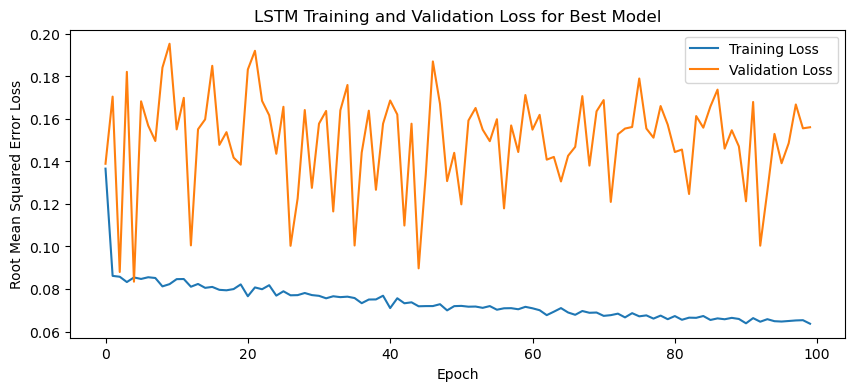

1/1 - 3s - loss: 0.0580 - 3s/epoch - 3s/step
Test Loss: 0.057993993163108826
1/1 [==============================] - 0s 36ms/step


IndexError: index 10 is out of bounds for axis 0 with size 10

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

# Make one forecast with an LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100

# Optimize and fit the model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history=best_model.fit(X, y, epochs=nb_epoch, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No SA)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No SA)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_SH_S12_No_SA.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

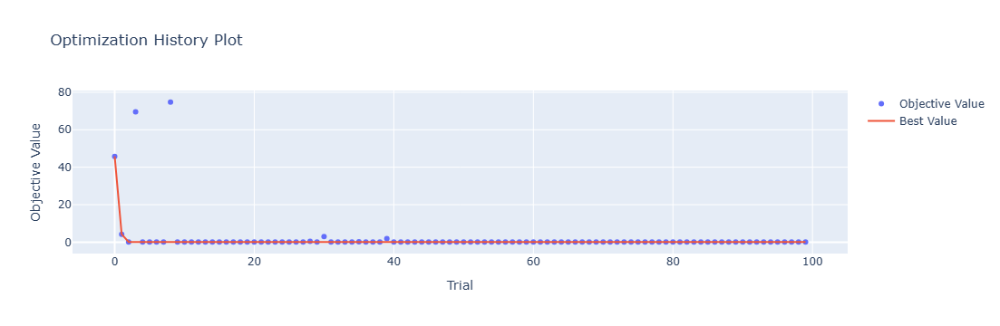

In [4]:
optuna.visualization.plot_optimization_history(study)

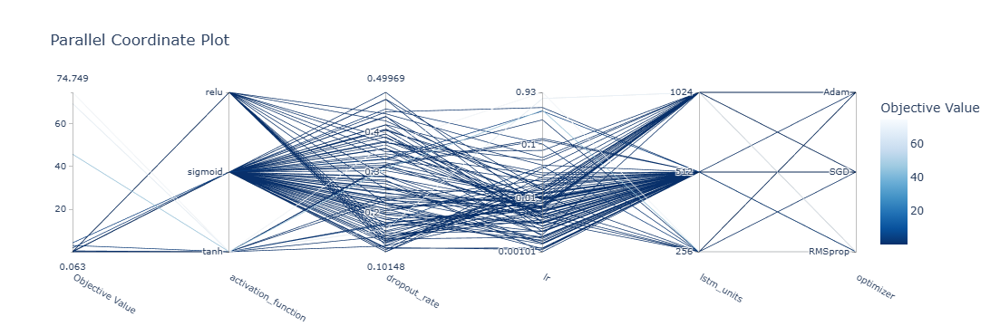

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

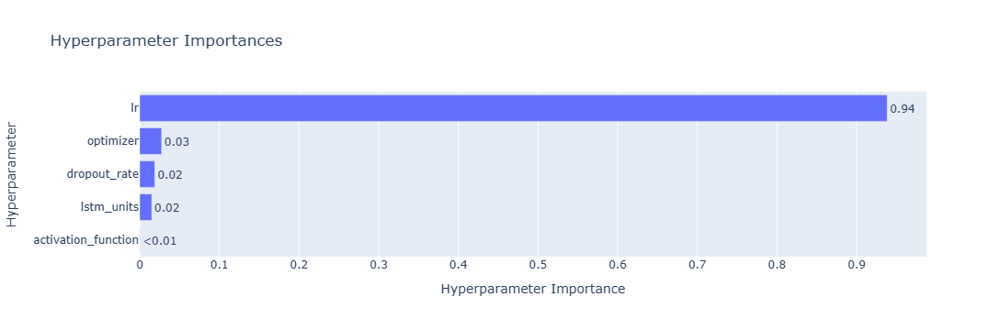

In [6]:
optuna.visualization.plot_param_importances(study)

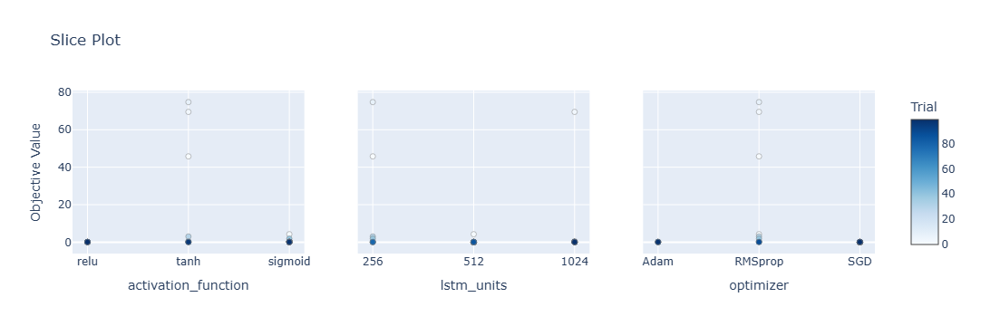

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

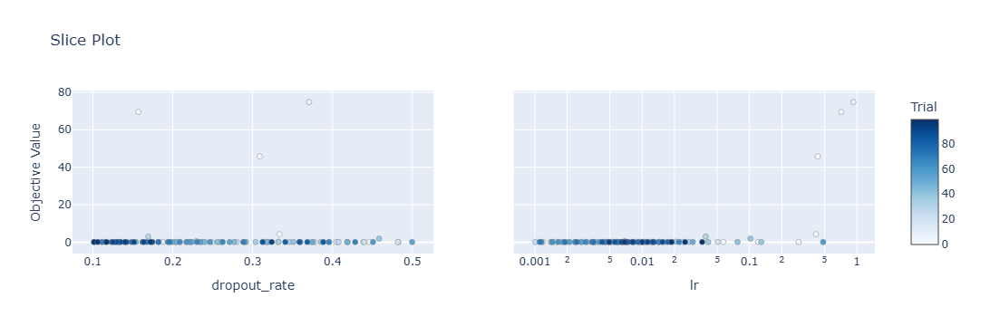

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

Epoch 1/100
84/84 [==============================] - 23s 101ms/step - loss: 0.1553 - accuracy: 0.5238 - mae: 0.1298 - rmse: 0.1553 - mape: 28.0326 - pearson: 0.6409 - val_loss: 0.0870 - val_accuracy: 0.8000 - val_mae: 0.0726 - val_rmse: 0.0870 - val_mape: 15.3622 - val_pearson: 0.6839
Epoch 2/100
84/84 [==============================] - 4s 51ms/step - loss: 0.0826 - accuracy: 0.6429 - mae: 0.0658 - rmse: 0.0826 - mape: 15.2539 - pearson: 0.7148 - val_loss: 0.0721 - val_accuracy: 0.8000 - val_mae: 0.0600 - val_rmse: 0.0721 - val_mape: 13.2984 - val_pearson: 0.7164
Epoch 3/100
84/84 [==============================] - 4s 50ms/step - loss: 0.0810 - accuracy: 0.6310 - mae: 0.0637 - rmse: 0.0810 - mape: 14.2685 - pearson: 0.7363 - val_loss: 0.0890 - val_accuracy: 0.8000 - val_mae: 0.0705 - val_rmse: 0.0890 - val_mape: 14.6772 - val_pearson: 0.7148
Epoch 4/100
84/84 [==============================] - 4s 52ms/step - loss: 0.0772 - accuracy: 0.5952 - mae: 0.0609 - rmse: 0.0772 - mape: 13.7783 -

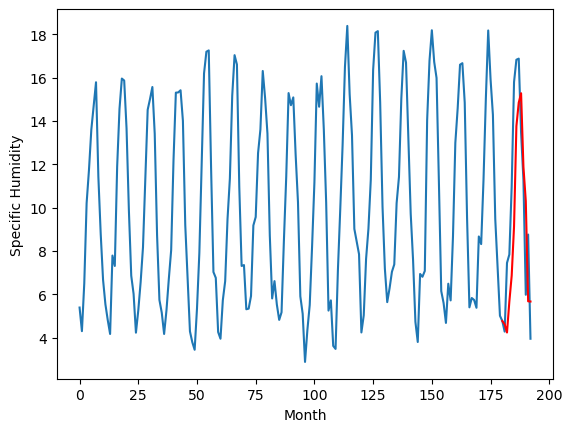

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		4.31		-0.59
5.61		3.93		-1.68
7.82		5.35		-2.47
8.04		6.55		-1.49
10.53		8.83		-1.70
15.28		13.45		-1.83
16.08		14.53		-1.55
16.24		14.97		-1.27
14.08		11.57		-2.51
11.00		10.00		-1.00
5.34		5.36		0.02
8.98		5.35		-3.63
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.05, 4.308329167962074, 3.930693718791008, 5.350655290484428, 6.5542247027158735, 8.82559344470501, 13.445337745547295, 14.532610389590264, 14.969033095240594, 11.571683022379876, 9.998475763201714, 5.358920785784722, 5.351457565743477]


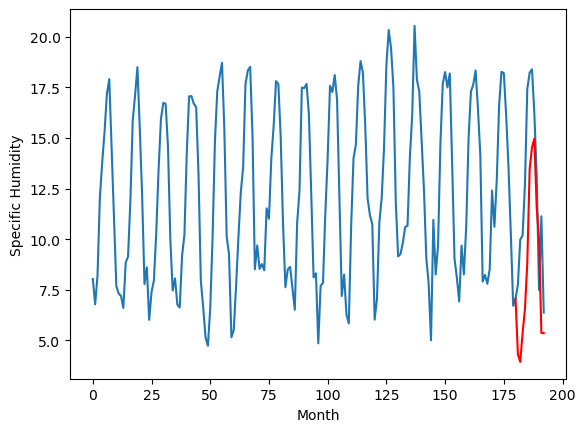

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.82		4.20		-0.62
4.97		3.82		-1.15
6.82		5.24		-1.58
7.06		6.44		-0.62
9.82		8.71		-1.11
14.44		13.33		-1.11
16.35		14.42		-1.93
16.55		14.86		-1.69
13.55		11.46		-2.09
10.83		9.88		-0.95
4.96		5.24		0.28
7.36		5.24		-2.12
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.06, 4.19861194729805, 3.8201827728748325, 5.237510772943497, 6.441369267702103, 8.709887000322343, 13.330332251787187, 14.41888007760048, 14.855576368570329, 11.456617447137834, 9.88434753060341, 5.243393036127092, 5.2398723746277405]


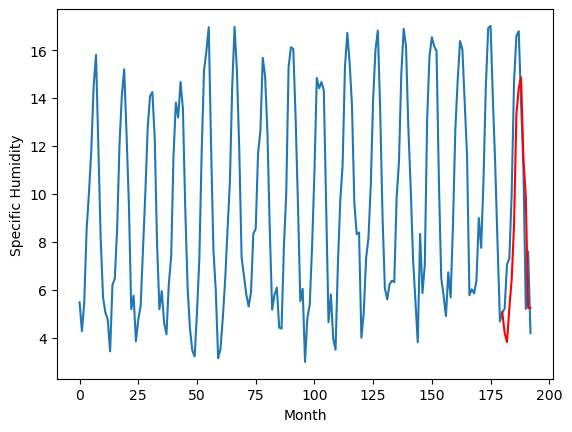

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.21		3.90		-0.31
4.12		3.52		-0.60
7.57		4.94		-2.63
8.14		6.15		-1.99
11.65		8.42		-3.23
15.55		13.03		-2.52
16.39		14.12		-2.27
16.01		14.56		-1.45
13.70		11.16		-2.54
11.27		9.58		-1.69
5.06		4.94		-0.12
8.11		4.94		-3.17
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.05, 3.900195061564445, 3.5239315026998517, 4.9425607913732525, 6.146675466895103, 8.416360020041466, 13.03359186589718, 14.120636343359948, 14.557940750718117, 11.160682945847512, 9.583941608071328, 4.940652995705605, 4.935157187618316]


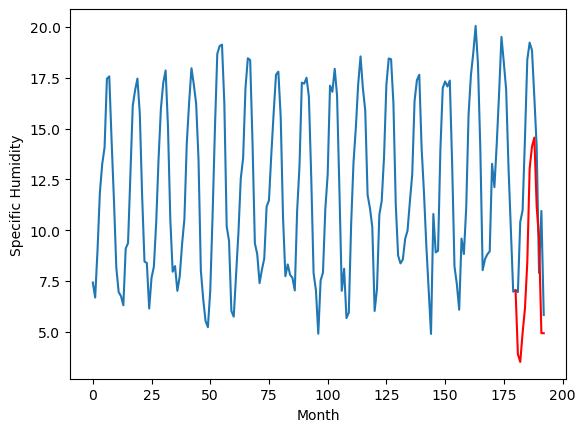

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.32		5.15		-0.17
4.92		4.77		-0.15
7.76		6.19		-1.57
9.16		7.40		-1.76
13.17		9.67		-3.50
16.86		14.29		-2.57
17.57		15.37		-2.20
17.49		15.80		-1.69
13.26		12.41		-0.85
11.17		10.83		-0.34
6.95		6.19		-0.76
9.71		6.18		-3.53
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.2, 5.150762572288513, 4.772256537675857, 6.194095536470413, 7.395080729722976, 9.668400450944901, 14.285526915788651, 15.373885198831559, 15.802527203559876, 12.405056252479554, 10.830971612930298, 6.192186250686646, 6.1846466542780405]


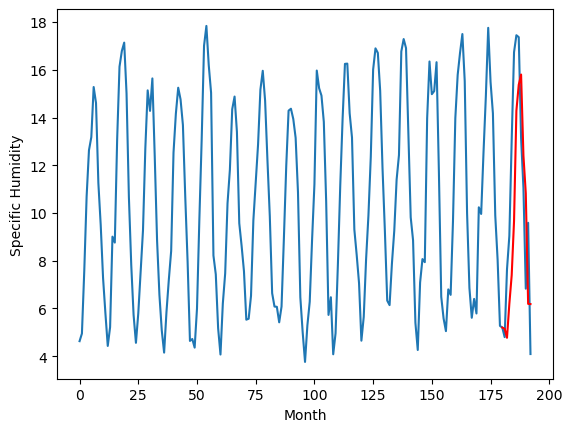

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.42		7.79		0.37
8.01		7.41		-0.60
9.58		8.83		-0.75
10.59		10.03		-0.56
13.09		12.29		-0.80
18.35		16.92		-1.43
19.47		18.00		-1.47
20.63		18.44		-2.19
16.54		15.04		-1.50
14.22		13.47		-0.75
8.96		8.83		-0.13
10.38		8.83		-1.55
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.16, 7.785457326769828, 7.406102462410926, 8.825100107789039, 10.029685540795326, 12.29408077776432, 16.91512732088566, 18.003275795578958, 18.439770026803018, 15.04132680475712, 13.467394991517068, 8.826635523438455, 8.825447719632649]


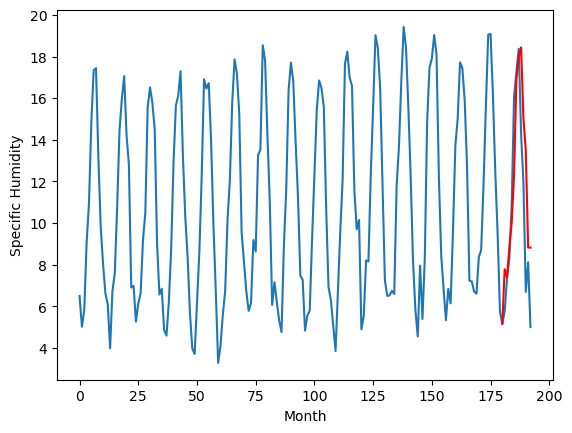

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.33		5.24		-0.09
5.38		4.86		-0.52
6.97		6.27		-0.70
7.57		7.48		-0.09
10.57		9.74		-0.83
14.95		14.36		-0.59
16.39		15.45		-0.94
16.92		15.89		-1.03
13.60		12.49		-1.11
11.49		10.92		-0.57
5.74		6.27		0.53
7.58		6.27		-1.31
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.05, 5.235431219935418, 4.856122280955315, 6.273345853686333, 7.476972247958184, 9.741407062411309, 14.362888957858086, 15.45325436770916, 15.892041828036309, 12.491239215731621, 10.916562463641167, 6.273740198016167, 6.270713564725593]


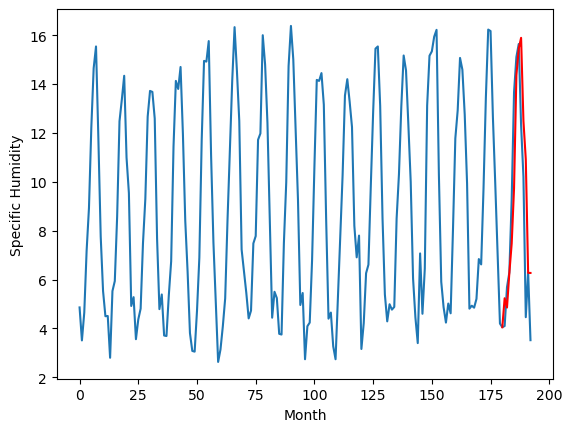

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.12		7.18		0.06
7.15		6.80		-0.35
8.77		8.22		-0.55
9.47		9.43		-0.04
12.49		11.69		-0.80
16.76		16.31		-0.45
18.26		17.40		-0.86
18.54		17.85		-0.69
15.05		14.45		-0.60
13.17		12.87		-0.30
7.38		8.23		0.85
9.15		8.22		-0.93
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.64, 7.184168108105659, 6.804110862612724, 8.220729209780693, 9.426841236948967, 11.691278197169304, 16.31472656905651, 17.404964305758476, 17.845761724114418, 14.445396133065223, 12.872443147301674, 8.22857613146305, 8.224567242264747]


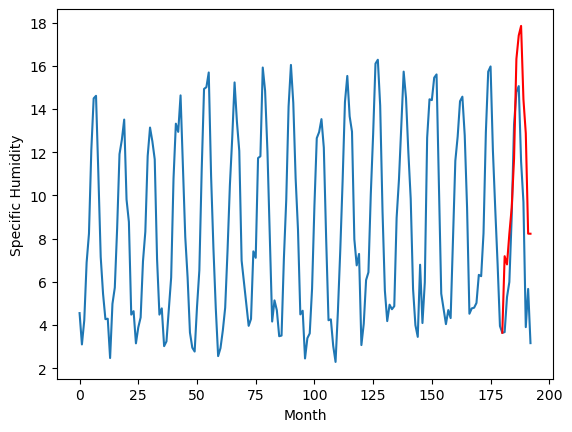

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.40		4.39		-0.01
3.72		4.00		0.28
6.78		5.43		-1.35
7.51		6.63		-0.88
10.42		8.90		-1.52
15.40		13.53		-1.87
16.90		14.62		-2.28
17.09		15.06		-2.03
13.28		11.66		-1.62
10.86		10.08		-0.78
5.57		5.44		-0.13
7.16		5.44		-1.72
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.46, 4.385059003829956, 4.002649550437927, 5.425942664146423, 6.631949310302734, 8.90019429206848, 13.526071195602416, 14.6156698513031, 15.055906538963317, 11.65636182308197, 10.084368352890014, 5.443493490219115, 5.437830428238957]


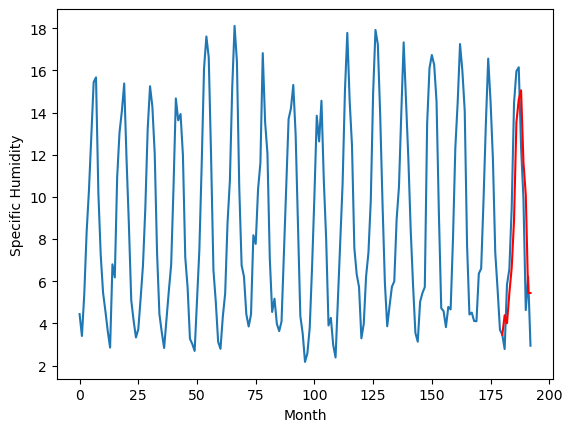

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.17		6.25		0.08
5.72		5.87		0.15
7.52		7.29		-0.23
8.84		8.50		-0.34
10.93		10.77		-0.16
15.70		15.40		-0.30
16.63		16.49		-0.14
17.05		16.93		-0.12
13.88		13.53		-0.35
12.57		11.96		-0.61
7.05		7.32		0.27
7.89		7.31		-0.58
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.93, 6.253563866019249, 5.871699705719948, 7.2922113090753555, 8.50078572332859, 10.767934456467628, 15.397070065140724, 16.48582471907139, 16.930643007159233, 13.531302139163017, 11.963325664401054, 7.320296928286552, 7.310901099815965]


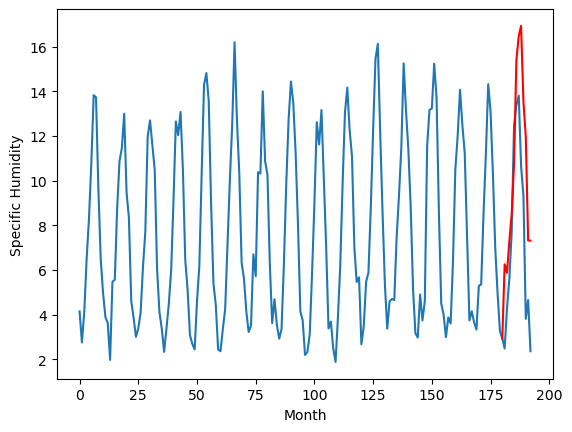

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		4.62		0.14
3.74		4.24		0.50
5.36		5.65		0.29
6.96		6.87		-0.09
8.48		9.13		0.65
13.61		13.76		0.15
14.68		14.85		0.17
15.17		15.30		0.13
11.55		11.90		0.35
10.56		10.34		-0.22
5.71		5.69		-0.02
5.71		5.68		-0.03
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.74, 4.6152538067102435, 4.2356359666585925, 5.6548076575994495, 6.8667667812109, 9.131840795874595, 13.76206740796566, 14.849396080374717, 15.300669611096382, 11.90165418446064, 10.335239112973213, 5.693784893155097, 5.681065249852836]


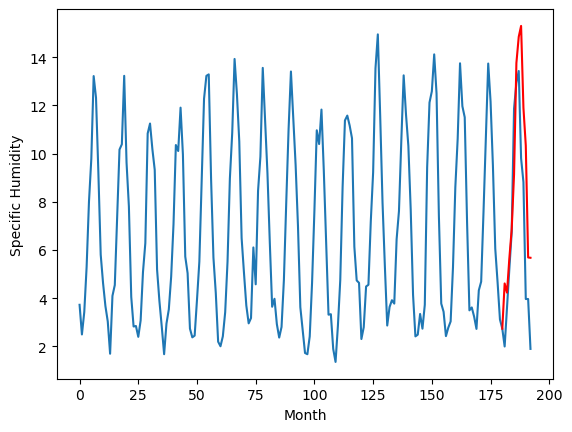

RangeIndex(start=1, stop=12, step=1)
[4.62, 4.899999999999999, 4.820000000000001, 4.209999999999998, 5.32, 7.42, 5.33, 7.119999999999999, 4.4, 6.170000000000001, 4.48]
[4.6187129771709445, 4.308329167962074, 4.19861194729805, 3.900195061564445, 5.150762572288513, 7.785457326769828, 5.235431219935418, 7.184168108105659, 4.385059003829956, 6.253563866019249, 4.6152538067102435]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.62   4.618713
1                 1    4.90   4.308329
2                 2    4.82   4.198612
3                 3    4.21   3.900195
4                 4    5.32   5.150763
5                 5    7.42   7.785457
6                 6    5.33   5.235431
7                 7    7.12   7.184168
8                 8    4.40   4.385059
9                 9    6.17   6.253564
10               10    4.48   4.615254


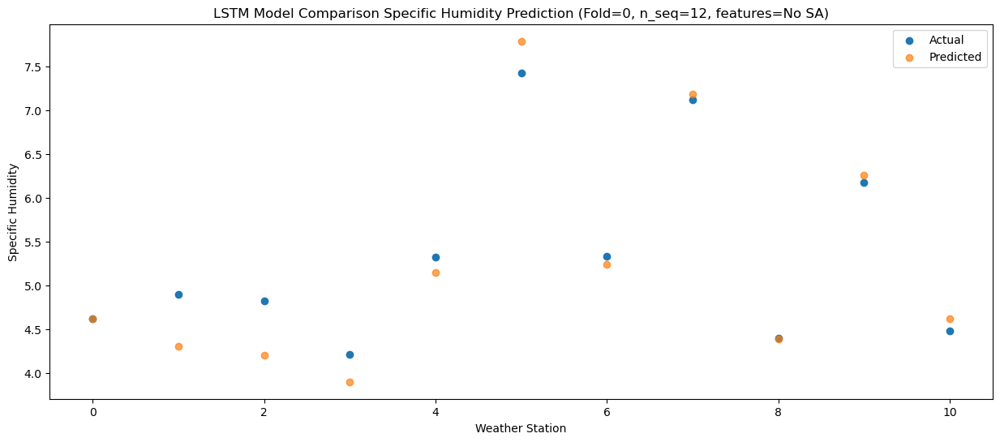

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.13   4.236732
1                 1    5.61   3.930694
2                 2    4.97   3.820183
3                 3    4.12   3.523932
4                 4    4.92   4.772257
5                 5    8.01   7.406102
6                 6    5.38   4.856122
7                 7    7.15   6.804111
8                 8    3.72   4.002650
9                 9    5.72   5.871700
10               10    3.74   4.235636


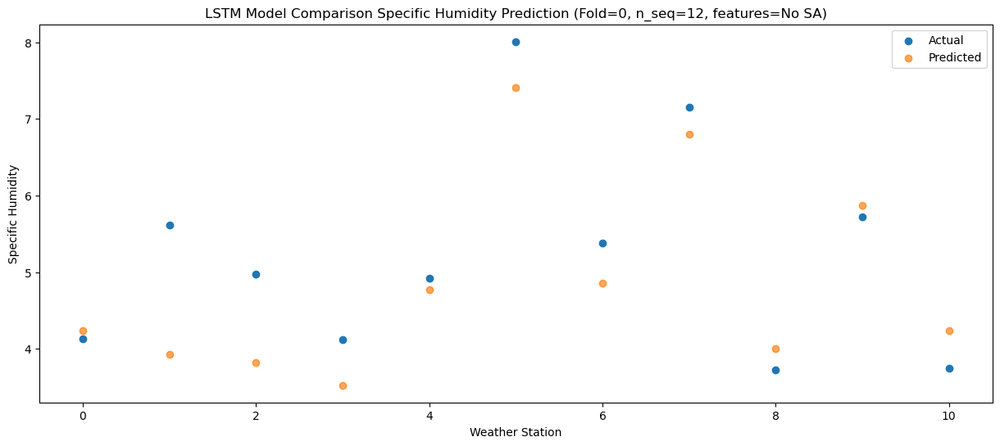

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.30   5.661162
1                 1    7.82   5.350655
2                 2    6.82   5.237511
3                 3    7.57   4.942561
4                 4    7.76   6.194096
5                 5    9.58   8.825100
6                 6    6.97   6.273346
7                 7    8.77   8.220729
8                 8    6.78   5.425943
9                 9    7.52   7.292211
10               10    5.36   5.654808


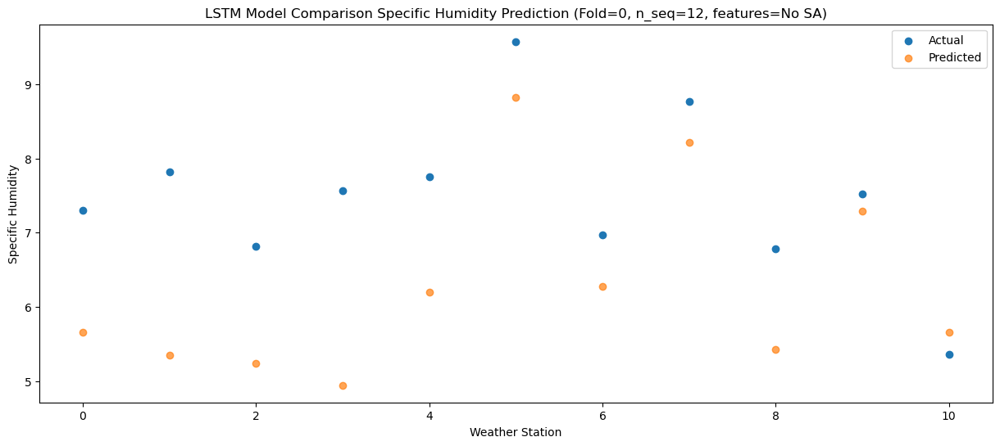

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.69   6.864853
1                 1    8.04   6.554225
2                 2    7.06   6.441369
3                 3    8.14   6.146675
4                 4    9.16   7.395081
5                 5   10.59  10.029686
6                 6    7.57   7.476972
7                 7    9.47   9.426841
8                 8    7.51   6.631949
9                 9    8.84   8.500786
10               10    6.96   6.866767


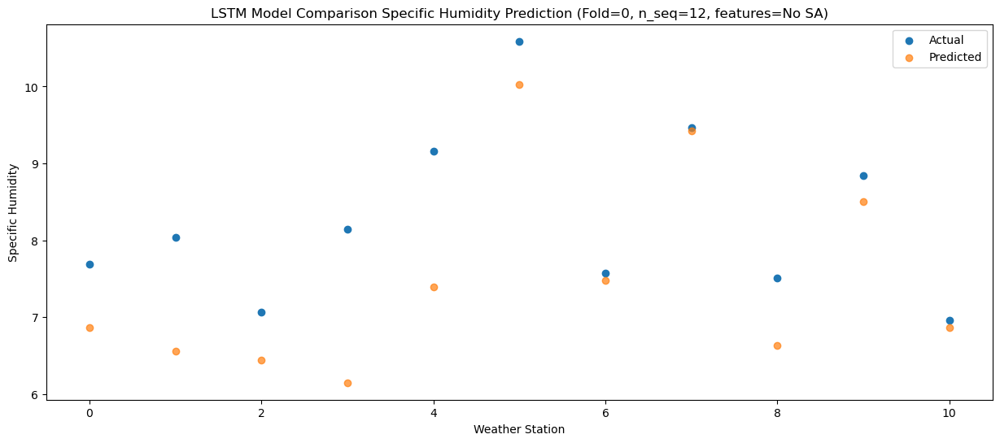

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.84   9.138086
1                 1   10.53   8.825593
2                 2    9.82   8.709887
3                 3   11.65   8.416360
4                 4   13.17   9.668400
5                 5   13.09  12.294081
6                 6   10.57   9.741407
7                 7   12.49  11.691278
8                 8   10.42   8.900194
9                 9   10.93  10.767934
10               10    8.48   9.131841


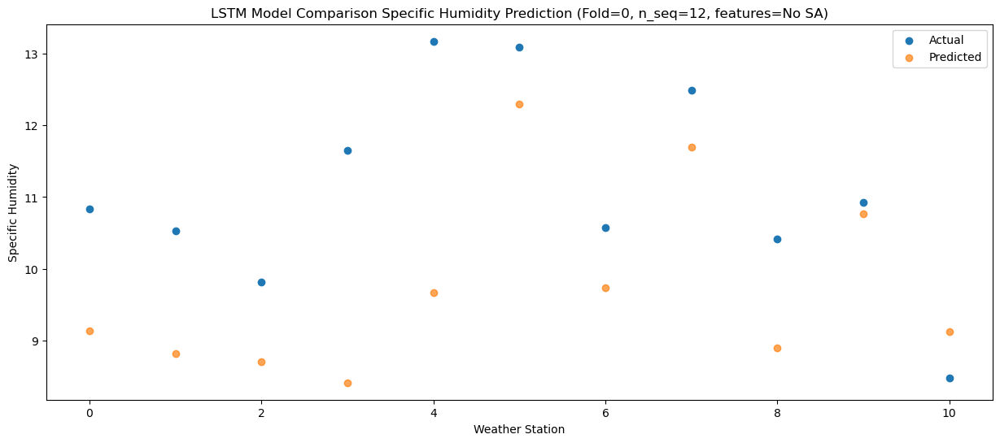

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   15.65  13.761757
1                 1   15.28  13.445338
2                 2   14.44  13.330332
3                 3   15.55  13.033592
4                 4   16.86  14.285527
5                 5   18.35  16.915127
6                 6   14.95  14.362889
7                 7   16.76  16.314727
8                 8   15.40  13.526071
9                 9   15.70  15.397070
10               10   13.61  13.762067


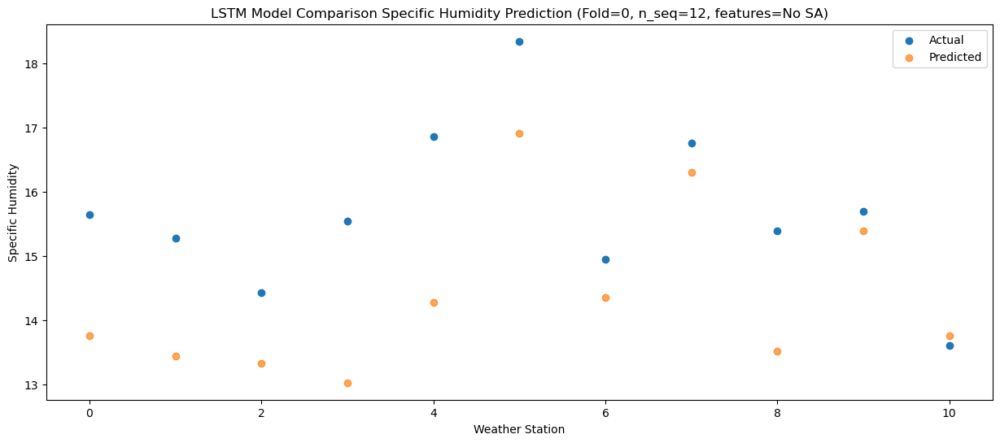

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.68  14.850038
1                 1   16.08  14.532610
2                 2   16.35  14.418880
3                 3   16.39  14.120636
4                 4   17.57  15.373885
5                 5   19.47  18.003276
6                 6   16.39  15.453254
7                 7   18.26  17.404964
8                 8   16.90  14.615670
9                 9   16.63  16.485825
10               10   14.68  14.849396


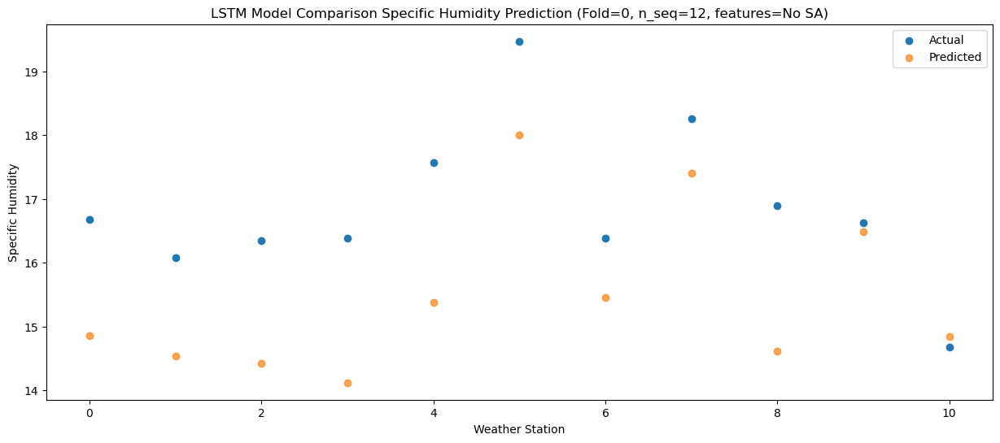

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.73  15.281880
1                 1   16.24  14.969033
2                 2   16.55  14.855576
3                 3   16.01  14.557941
4                 4   17.49  15.802527
5                 5   20.63  18.439770
6                 6   16.92  15.892042
7                 7   18.54  17.845762
8                 8   17.09  15.055907
9                 9   17.05  16.930643
10               10   15.17  15.300670


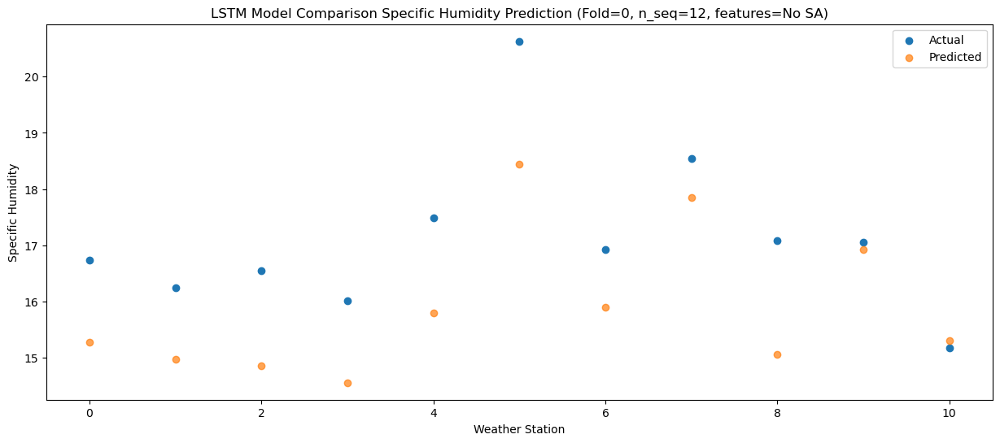

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   13.31  11.883557
1                 1   14.08  11.571683
2                 2   13.55  11.456617
3                 3   13.70  11.160683
4                 4   13.26  12.405056
5                 5   16.54  15.041327
6                 6   13.60  12.491239
7                 7   15.05  14.445396
8                 8   13.28  11.656362
9                 9   13.88  13.531302
10               10   11.55  11.901654


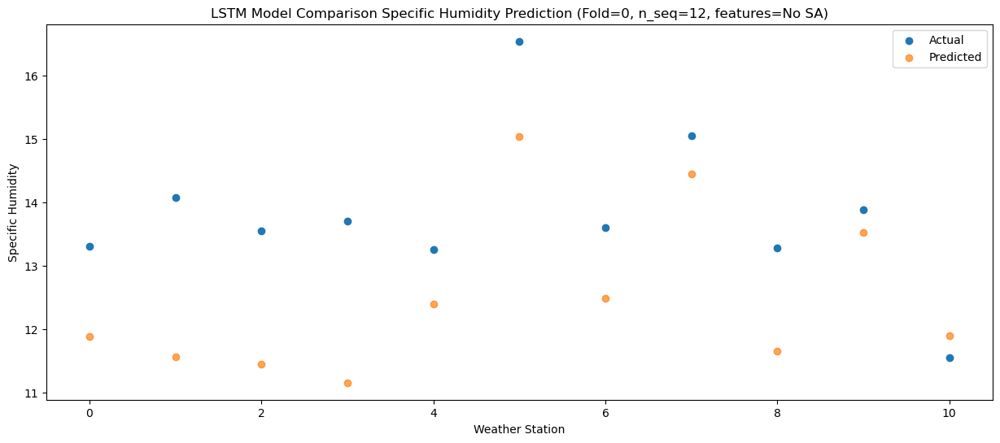

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   11.13  10.311033
1                 1   11.00   9.998476
2                 2   10.83   9.884348
3                 3   11.27   9.583942
4                 4   11.17  10.830972
5                 5   14.22  13.467395
6                 6   11.49  10.916562
7                 7   13.17  12.872443
8                 8   10.86  10.084368
9                 9   12.57  11.963326
10               10   10.56  10.335239


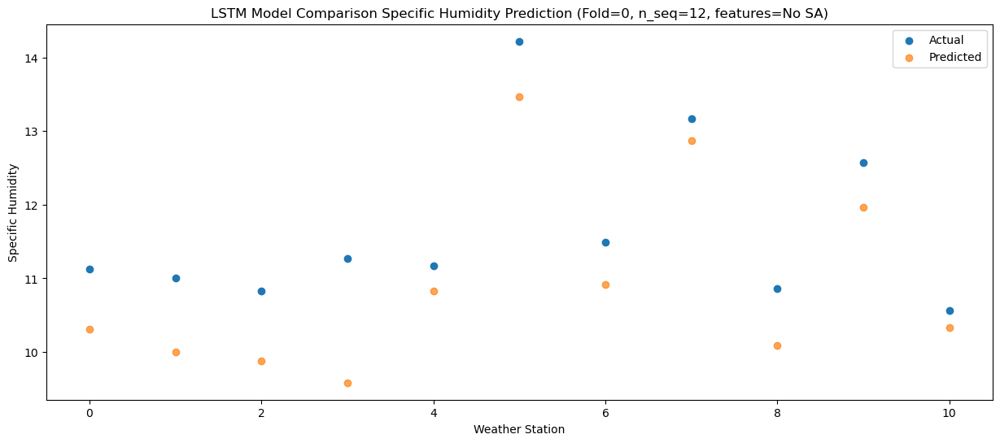

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.83   5.677762
1                 1    5.34   5.358921
2                 2    4.96   5.243393
3                 3    5.06   4.940653
4                 4    6.95   6.192186
5                 5    8.96   8.826636
6                 6    5.74   6.273740
7                 7    7.38   8.228576
8                 8    5.57   5.443493
9                 9    7.05   7.320297
10               10    5.71   5.693785


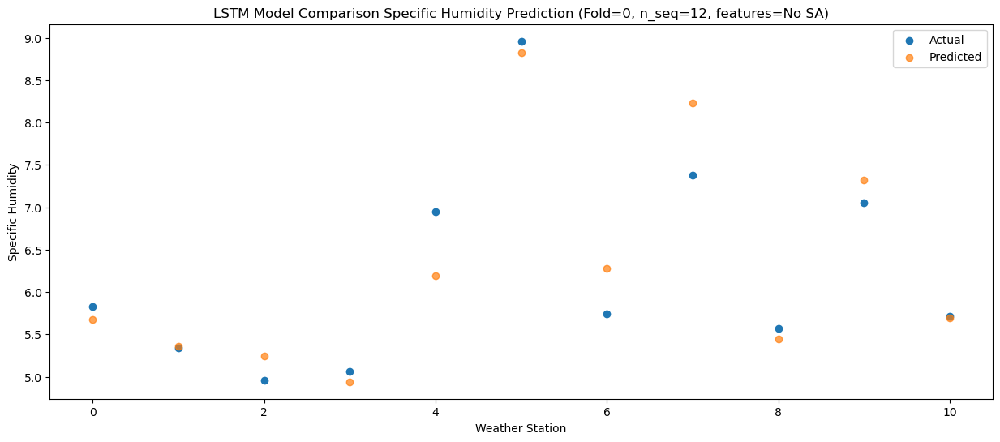

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    8.61   5.668326
1                 1    8.98   5.351458
2                 2    7.36   5.239872
3                 3    8.11   4.935157
4                 4    9.71   6.184647
5                 5   10.38   8.825448
6                 6    7.58   6.270714
7                 7    9.15   8.224567
8                 8    7.16   5.437830
9                 9    7.89   7.310901
10               10    5.71   5.681065


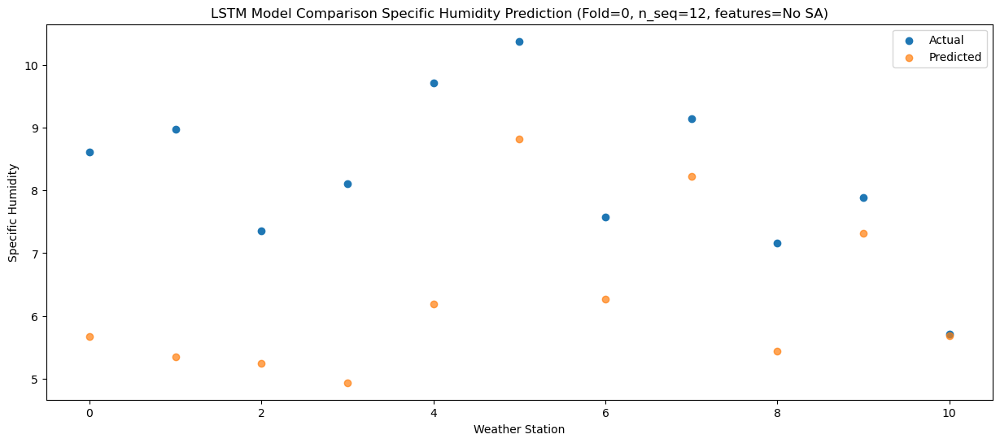

Model: "sequential_501"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1002 (LSTM)            (1, 1, 1024)              12263424  
                                                                 
 dropout_1002 (Dropout)      (1, 1, 1024)              0         
                                                                 
 lstm_1003 (LSTM)            (1, 1024)                 8392704   
                                                                 
 dropout_1003 (Dropout)      (1, 1024)                 0         
                                                                 
 dense_1503 (Dense)          (1, 256)                  262400    
                                                                 
 dense_1504 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1505 (Dense)          (1, 12)                

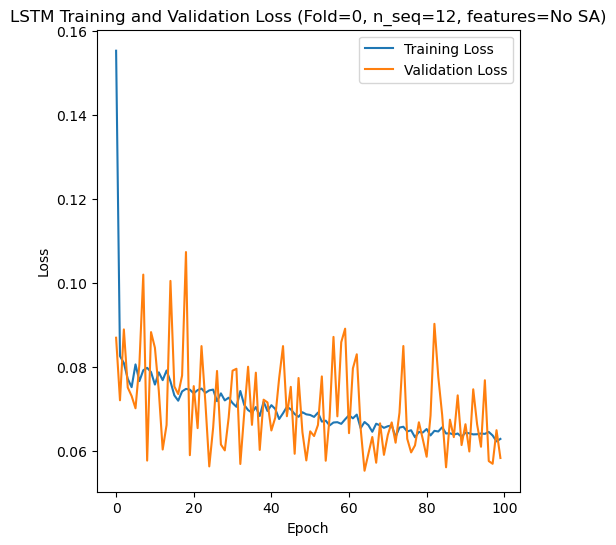

Epoch 1/100
84/84 [==============================] - 10s 62ms/step - loss: 0.1228 - accuracy: 0.6667 - mae: 0.0978 - rmse: 0.1228 - mape: 23.5051 - pearson: 0.6981 - val_loss: 0.0646 - val_accuracy: 0.7000 - val_mae: 0.0516 - val_rmse: 0.0646 - val_mape: 11.2046 - val_pearson: 0.7653
Epoch 2/100
84/84 [==============================] - 4s 43ms/step - loss: 0.0844 - accuracy: 0.6905 - mae: 0.0669 - rmse: 0.0844 - mape: 15.4336 - pearson: 0.7149 - val_loss: 0.0601 - val_accuracy: 0.7000 - val_mae: 0.0466 - val_rmse: 0.0601 - val_mape: 10.6614 - val_pearson: 0.7996
Epoch 3/100
84/84 [==============================] - 3s 41ms/step - loss: 0.0845 - accuracy: 0.6905 - mae: 0.0677 - rmse: 0.0845 - mape: 15.6111 - pearson: 0.7139 - val_loss: 0.0598 - val_accuracy: 0.7000 - val_mae: 0.0483 - val_rmse: 0.0598 - val_mape: 10.3794 - val_pearson: 0.7966
Epoch 4/100
84/84 [==============================] - 3s 39ms/step - loss: 0.0834 - accuracy: 0.6548 - mae: 0.0674 - rmse: 0.0834 - mape: 15.5697 - 

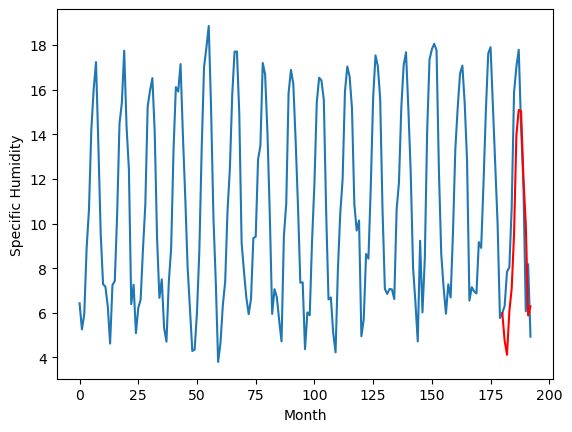

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.34		4.26		-0.08
4.53		3.62		-0.91
6.06		5.56		-0.50
6.42		6.60		0.18
9.34		9.01		-0.33
13.32		13.47		0.15
15.19		14.60		-0.59
15.40		14.54		-0.86
12.45		11.52		-0.93
10.41		9.47		-0.94
4.82		5.38		0.56
6.99		5.79		-1.20
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.15, 4.258327081501484, 3.6238084581494334, 5.5627231147885325, 6.602564170658589, 9.008486583530903, 13.469810321629048, 14.59541995793581, 14.537262759804726, 11.523715577721596, 9.47446425974369, 5.3832653385400775, 5.793446533083916]


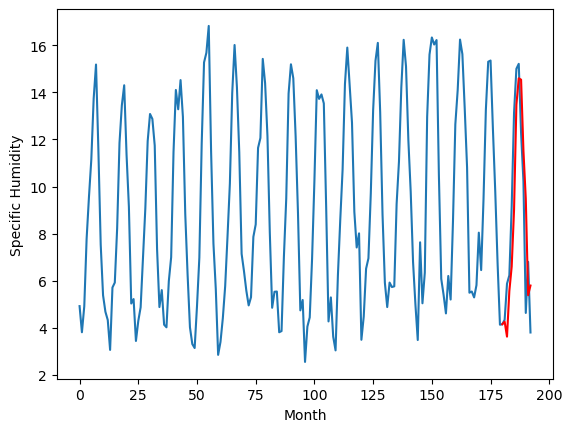

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.22		3.01		-0.21
3.22		2.37		-0.85
5.84		4.31		-1.53
5.55		5.35		-0.20
8.39		7.76		-0.63
12.91		12.22		-0.69
14.50		13.35		-1.15
14.72		13.29		-1.43
11.96		10.27		-1.69
9.21		8.22		-0.99
3.71		4.13		0.42
6.35		4.54		-1.81
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.12, 3.007956318259239, 2.3747336786985396, 4.314806453585625, 5.353681675791741, 7.760039917826653, 12.219984166026116, 13.347092263102532, 13.286374527662993, 10.270315605849028, 8.22305794402957, 4.130549151152373, 4.540784466713667]


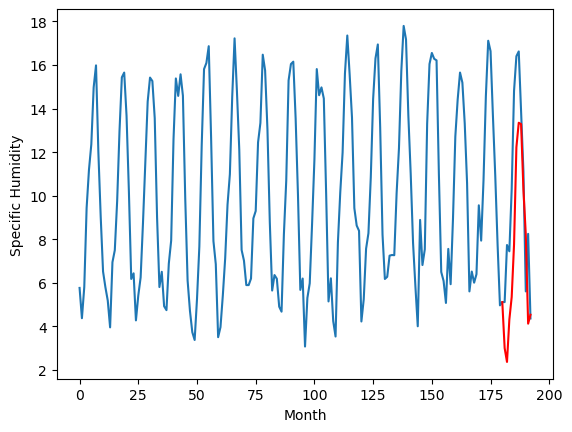

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.03		2.31		0.28
2.10		1.68		-0.42
4.74		3.62		-1.12
6.08		4.66		-1.42
9.97		7.07		-2.90
13.16		11.52		-1.64
13.64		12.65		-0.99
13.98		12.58		-1.40
10.89		9.57		-1.32
8.64		7.53		-1.11
4.19		3.44		-0.75
7.11		3.85		-3.26
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.35, 2.310608698874712, 1.6750904460251332, 3.618852510005236, 4.658476008921862, 7.067821635752916, 11.520712985545398, 12.645415677577258, 12.584120771735908, 9.573153040260078, 7.52680017694831, 3.4396271918714056, 3.848618260473014]


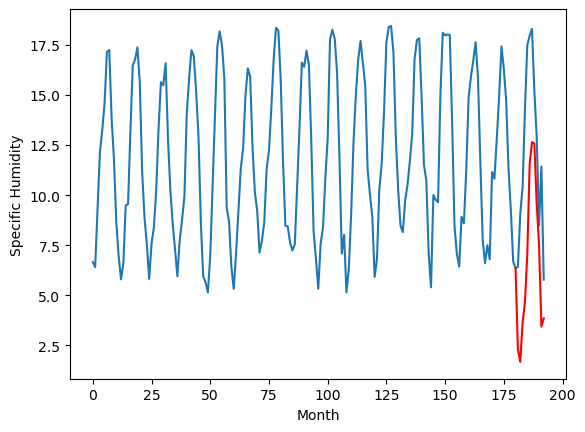

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.18		6.37		0.19
6.22		5.73		-0.49
8.94		7.68		-1.26
10.20		8.72		-1.48
14.23		11.13		-3.10
17.64		15.58		-2.06
17.82		16.71		-1.11
17.86		16.65		-1.21
14.76		13.64		-1.12
12.81		11.59		-1.22
8.22		7.50		-0.72
11.15		7.91		-3.24
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.08, 6.369844936132431, 5.733419858217239, 7.678697906732559, 8.718497358560562, 11.13033922791481, 15.581340872049331, 16.706956230401993, 16.645550627559423, 13.635493655055761, 11.589134116023779, 7.502841372340917, 7.910480875819921]


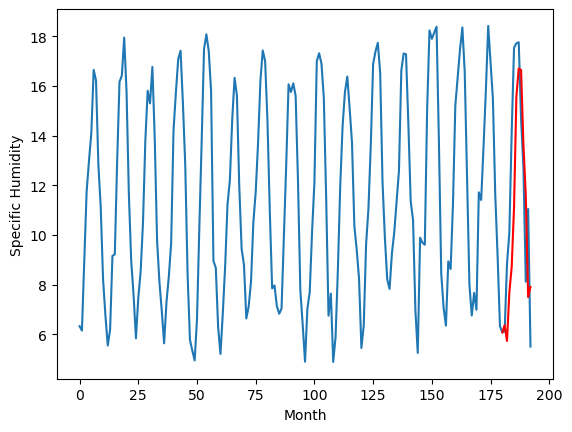

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.75		4.86		-0.89
5.12		4.23		-0.89
5.91		6.17		0.26
7.21		7.21		-0.00
11.52		9.62		-1.90
13.69		14.06		0.37
15.02		15.19		0.17
15.24		15.13		-0.11
11.70		12.12		0.42
8.59		10.07		1.48
6.75		5.99		-0.76
5.70		6.39		0.69
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.92, 4.862923668771982, 4.227969991117716, 6.173321472555399, 7.206220971494913, 9.61573587551713, 14.061414109617472, 15.19035528793931, 15.12857360586524, 12.122578093856573, 10.074667880386114, 5.993018576949835, 6.392506131976843]


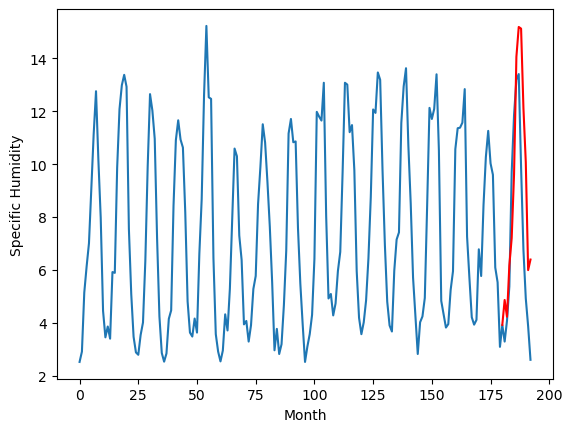

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.66		5.71		0.05
5.78		5.07		-0.71
7.34		7.01		-0.33
7.96		8.05		0.09
10.89		10.46		-0.43
15.24		14.91		-0.33
17.74		16.04		-1.70
18.03		15.98		-2.05
14.68		12.96		-1.72
12.55		10.91		-1.64
6.62		6.82		0.20
8.49		7.23		-1.26
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.16, 5.71022923335433, 5.0739162717759605, 7.014893964380025, 8.049873069375753, 10.456653789132833, 14.909547046273946, 16.037504032701253, 15.976052023917436, 12.961836316138506, 10.912637688666582, 6.824576832801103, 7.226515181809663]


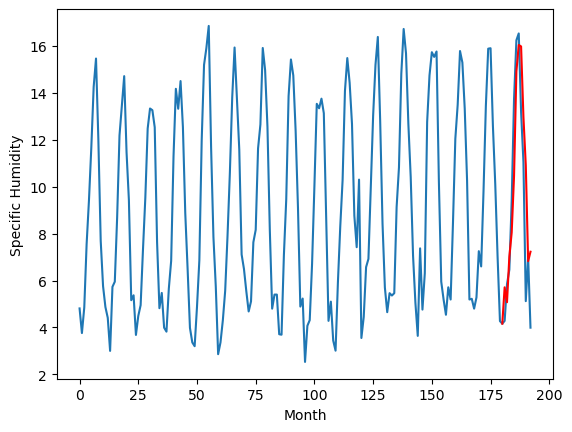

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.53		6.60		0.07
6.01		5.96		-0.05
8.74		7.91		-0.83
9.97		8.95		-1.02
13.18		11.35		-1.83
17.94		15.81		-2.13
18.57		16.93		-1.64
18.42		16.87		-1.55
15.17		13.86		-1.31
12.44		11.81		-0.63
7.88		7.73		-0.15
9.52		8.13		-1.39
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.84, 6.600062463283539, 5.961917910575867, 7.908934149742127, 8.945905718803406, 11.354677233695984, 15.805833373069763, 16.934081349372864, 16.873561322540045, 13.859507977813482, 11.81282728895545, 7.728632151931524, 8.134122490733862]


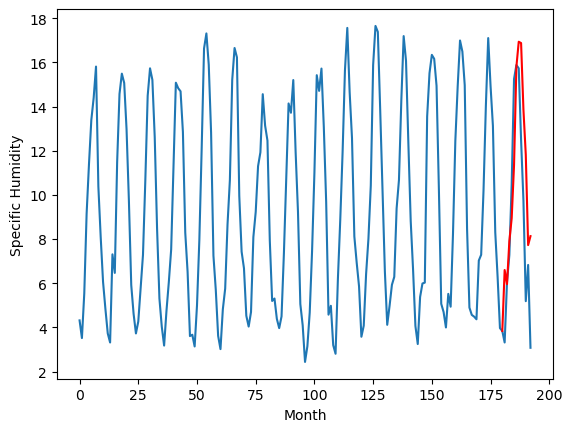

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.49		6.28		-0.21
5.68		5.64		-0.04
8.29		7.59		-0.70
9.45		8.62		-0.83
13.67		11.03		-2.64
16.81		15.48		-1.33
17.86		16.60		-1.26
17.44		16.54		-0.90
13.87		13.53		-0.34
11.43		11.48		0.05
7.90		7.40		-0.50
7.29		7.81		0.52
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.73, 6.277021398693323, 5.638354768902063, 7.585007538944483, 8.619441380649805, 11.028496136814356, 15.47542082324624, 16.601119389683006, 16.54289065107703, 13.533072812408207, 11.484294755309818, 7.404631478637455, 7.806617213338612]


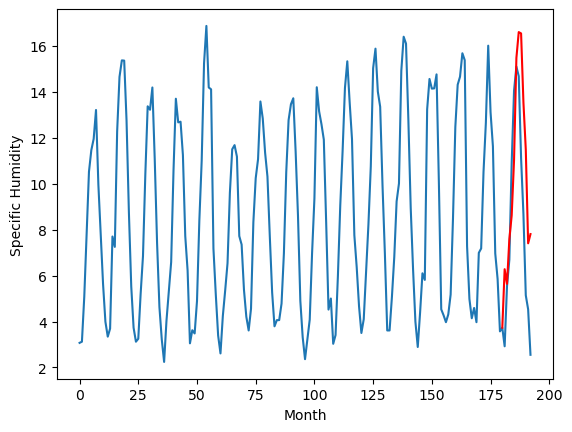

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.71		2.47		-0.24
1.97		1.83		-0.14
3.79		3.78		-0.01
3.96		4.81		0.85
9.11		7.22		-1.89
12.10		11.66		-0.44
13.34		12.79		-0.55
12.31		12.73		0.42
9.35		9.72		0.37
5.91		7.67		1.76
3.55		3.60		0.05
2.57		3.99		1.42
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.83, 2.4674815875291825, 1.8308176738023758, 3.776635144352913, 4.809603307843208, 7.219738815426826, 11.664042328000068, 12.791580651402473, 12.731258817464113, 9.72318453386426, 7.6725985486805435, 3.5955488164722915, 3.992600061446428]


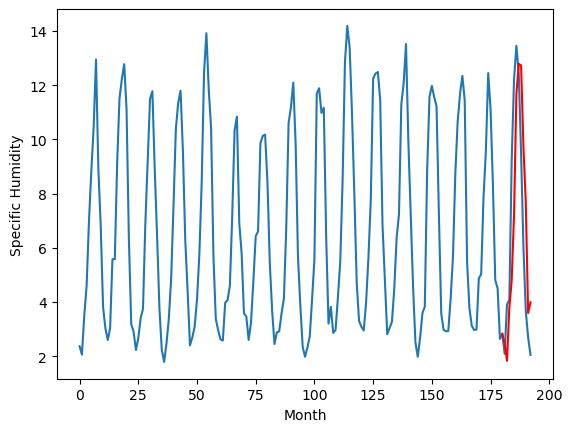

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.08		4.75		0.67
4.12		4.11		-0.01
5.36		6.05		0.69
6.73		7.09		0.36
8.26		9.50		1.24
13.58		13.95		0.37
15.44		15.08		-0.36
15.78		15.02		-0.76
12.59		12.01		-0.58
10.73		9.96		-0.77
5.54		5.87		0.33
5.42		6.27		0.85
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.69, 4.752552905529737, 4.110296109169721, 6.04973087593913, 7.091908672302961, 9.496031740158795, 13.948799589127301, 15.07884190365672, 15.020722893476485, 12.006073502302169, 9.957733896970748, 5.873347071409224, 6.271042195558547]


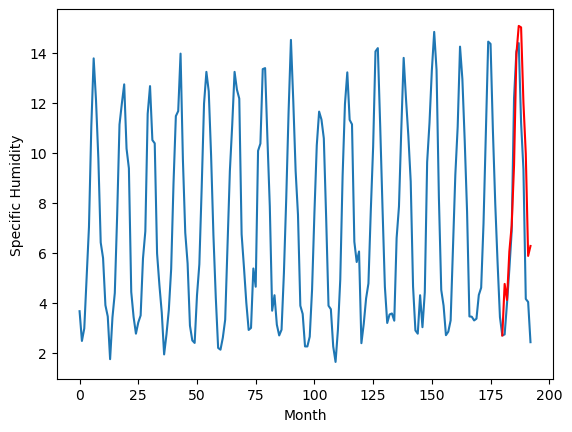

RangeIndex(start=1, stop=12, step=1)
[5.03, 4.340000000000002, 3.2199999999999998, 2.0299999999999994, 6.18, 5.75, 5.66, 6.529999999999999, 6.49, 2.7100000000000004, 4.079999999999999]
[4.750535221248865, 4.258327081501484, 3.007956318259239, 2.310608698874712, 6.369844936132431, 4.862923668771982, 5.71022923335433, 6.600062463283539, 6.277021398693323, 2.4674815875291825, 4.752552905529737]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.03   4.750535
1                 1    4.34   4.258327
2                 2    3.22   3.007956
3                 3    2.03   2.310609
4                 4    6.18   6.369845
5                 5    5.75   4.862924
6                 6    5.66   5.710229
7                 7    6.53   6.600062
8                 8    6.49   6.277021
9                 9    2.71   2.467482
10               10    4.08   4.752553


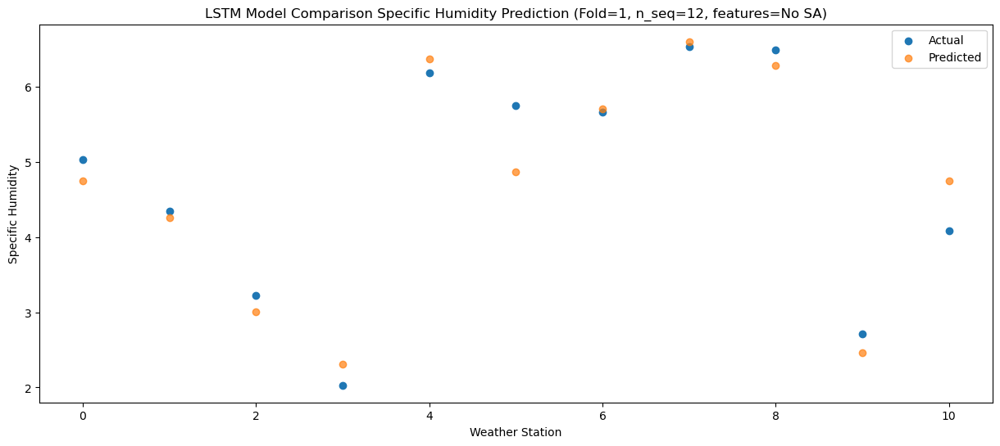

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    5.35   4.118669
1                 1    4.53   3.623808
2                 2    3.22   2.374734
3                 3    2.10   1.675090
4                 4    6.22   5.733420
5                 5    5.12   4.227970
6                 6    5.78   5.073916
7                 7    6.01   5.961918
8                 8    5.68   5.638355
9                 9    1.97   1.830818
10               10    4.12   4.110296


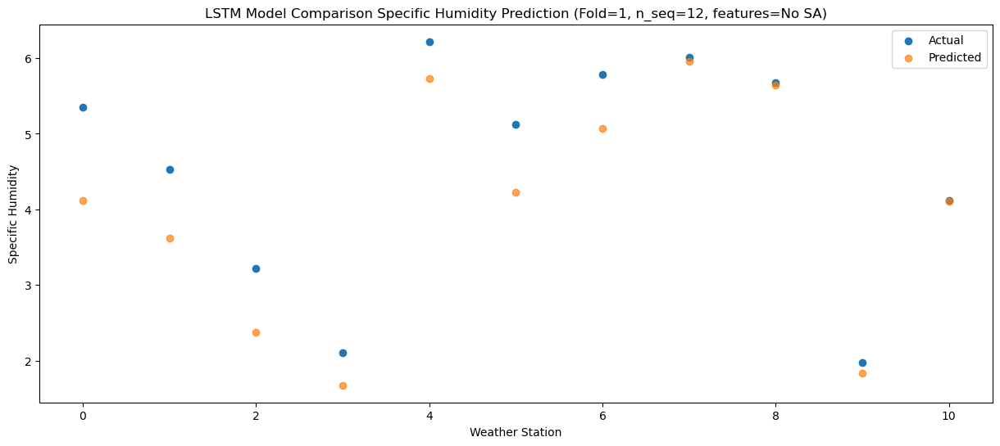

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.88   6.057640
1                 1    6.06   5.562723
2                 2    5.84   4.314806
3                 3    4.74   3.618853
4                 4    8.94   7.678698
5                 5    5.91   6.173321
6                 6    7.34   7.014894
7                 7    8.74   7.908934
8                 8    8.29   7.585008
9                 9    3.79   3.776635
10               10    5.36   6.049731


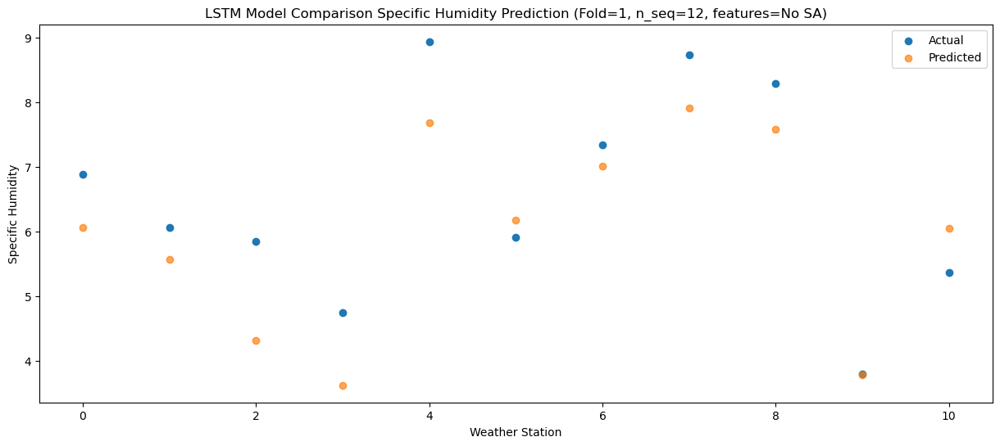

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.08   7.098928
1                 1    6.42   6.602564
2                 2    5.55   5.353682
3                 3    6.08   4.658476
4                 4   10.20   8.718497
5                 5    7.21   7.206221
6                 6    7.96   8.049873
7                 7    9.97   8.945906
8                 8    9.45   8.619441
9                 9    3.96   4.809603
10               10    6.73   7.091909


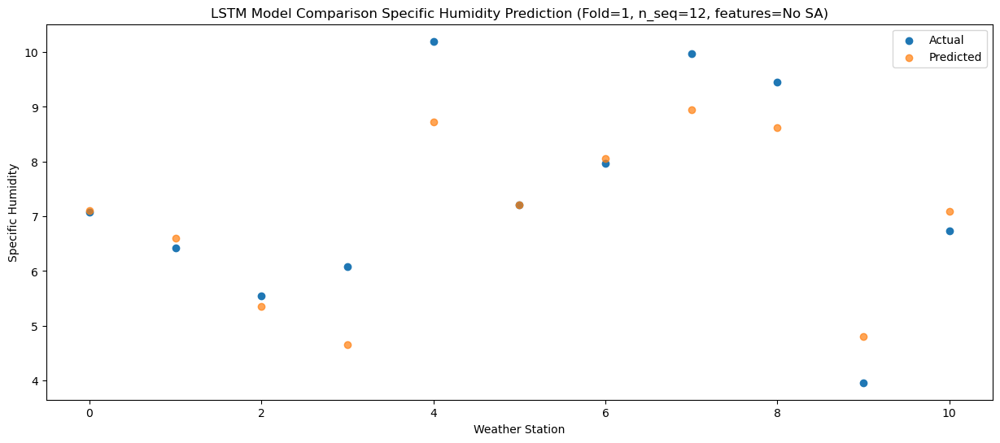

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    9.76   9.505962
1                 1    9.34   9.008487
2                 2    8.39   7.760040
3                 3    9.97   7.067822
4                 4   14.23  11.130339
5                 5   11.52   9.615736
6                 6   10.89  10.456654
7                 7   13.18  11.354677
8                 8   13.67  11.028496
9                 9    9.11   7.219739
10               10    8.26   9.496032


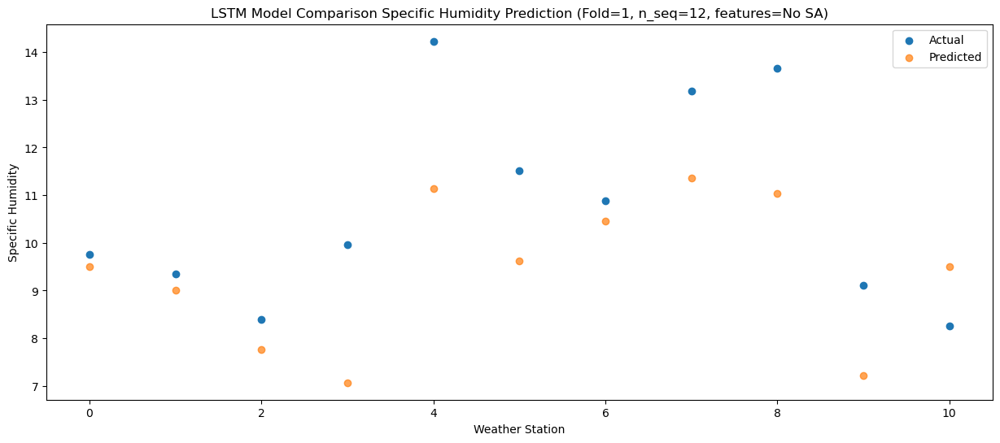

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.92  13.965880
1                 1   13.32  13.469810
2                 2   12.91  12.219984
3                 3   13.16  11.520713
4                 4   17.64  15.581341
5                 5   13.69  14.061414
6                 6   15.24  14.909547
7                 7   17.94  15.805833
8                 8   16.81  15.475421
9                 9   12.10  11.664042
10               10   13.58  13.948800


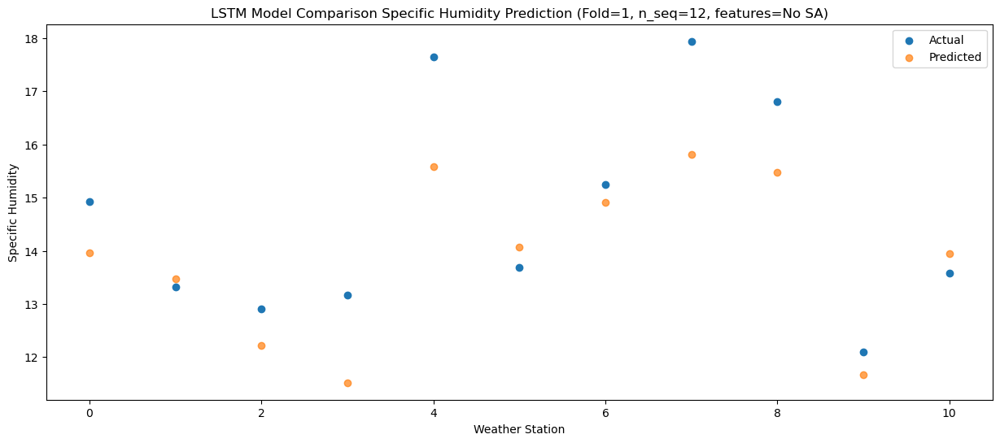

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.07  15.092977
1                 1   15.19  14.595420
2                 2   14.50  13.347092
3                 3   13.64  12.645416
4                 4   17.82  16.706956
5                 5   15.02  15.190355
6                 6   17.74  16.037504
7                 7   18.57  16.934081
8                 8   17.86  16.601119
9                 9   13.34  12.791581
10               10   15.44  15.078842


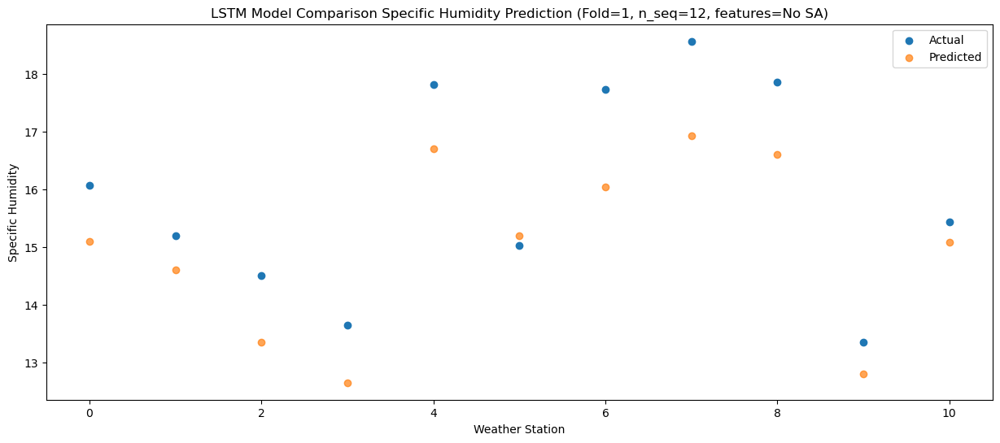

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.83  15.036179
1                 1   15.40  14.537263
2                 2   14.72  13.286375
3                 3   13.98  12.584121
4                 4   17.86  16.645551
5                 5   15.24  15.128574
6                 6   18.03  15.976052
7                 7   18.42  16.873561
8                 8   17.44  16.542891
9                 9   12.31  12.731259
10               10   15.78  15.020723


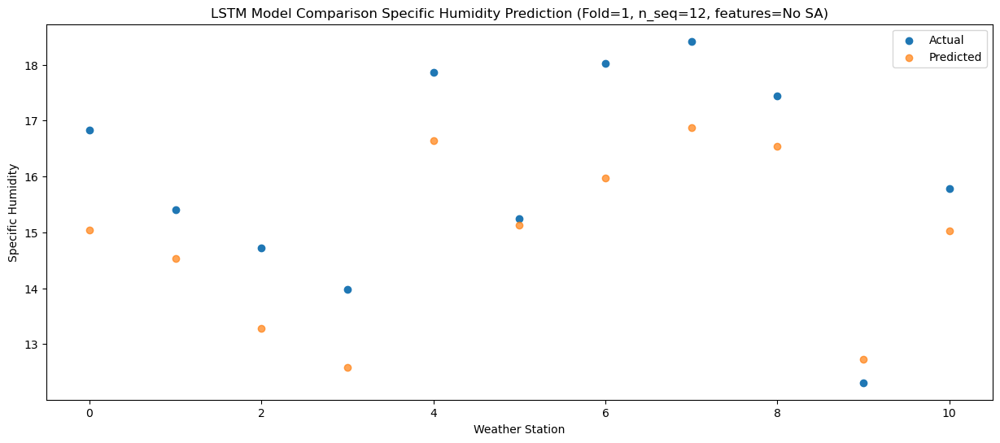

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   13.35  12.023979
1                 1   12.45  11.523716
2                 2   11.96  10.270316
3                 3   10.89   9.573153
4                 4   14.76  13.635494
5                 5   11.70  12.122578
6                 6   14.68  12.961836
7                 7   15.17  13.859508
8                 8   13.87  13.533073
9                 9    9.35   9.723185
10               10   12.59  12.006074


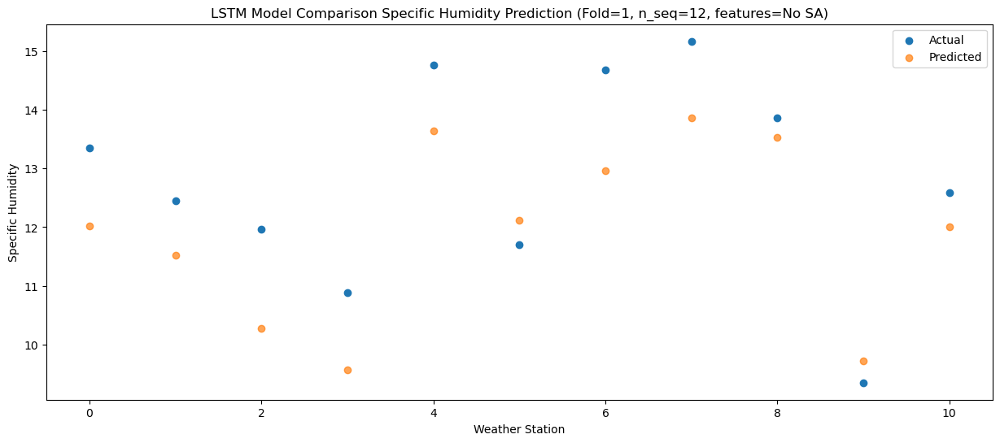

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.77   9.973238
1                 1   10.41   9.474464
2                 2    9.21   8.223058
3                 3    8.64   7.526800
4                 4   12.81  11.589134
5                 5    8.59  10.074668
6                 6   12.55  10.912638
7                 7   12.44  11.812827
8                 8   11.43  11.484295
9                 9    5.91   7.672599
10               10   10.73   9.957734


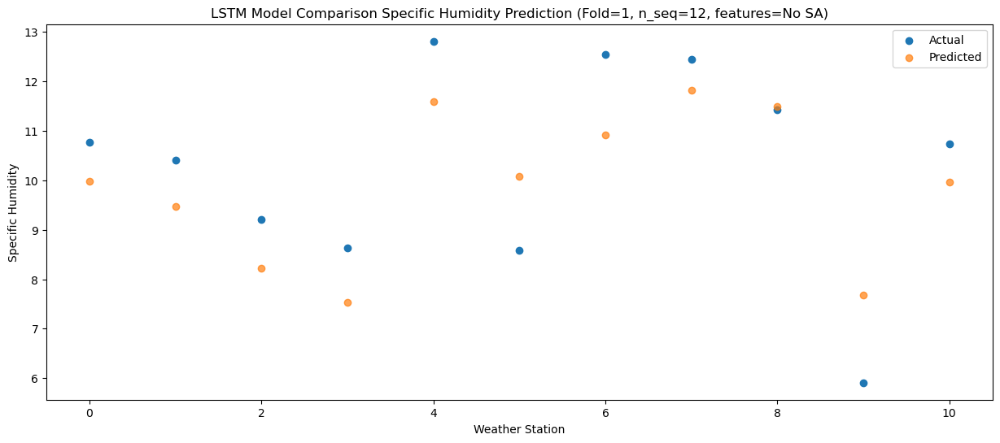

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.11   5.883445
1                 1    4.82   5.383265
2                 2    3.71   4.130549
3                 3    4.19   3.439627
4                 4    8.22   7.502841
5                 5    6.75   5.993019
6                 6    6.62   6.824577
7                 7    7.88   7.728632
8                 8    7.90   7.404631
9                 9    3.55   3.595549
10               10    5.54   5.873347


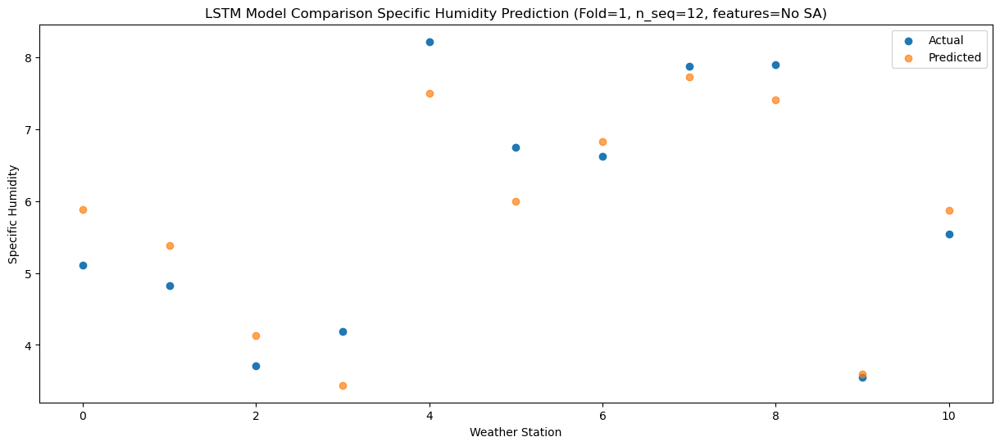

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.22   6.292228
1                 1    6.99   5.793447
2                 2    6.35   4.540784
3                 3    7.11   3.848618
4                 4   11.15   7.910481
5                 5    5.70   6.392506
6                 6    8.49   7.226515
7                 7    9.52   8.134122
8                 8    7.29   7.806617
9                 9    2.57   3.992600
10               10    5.42   6.271042


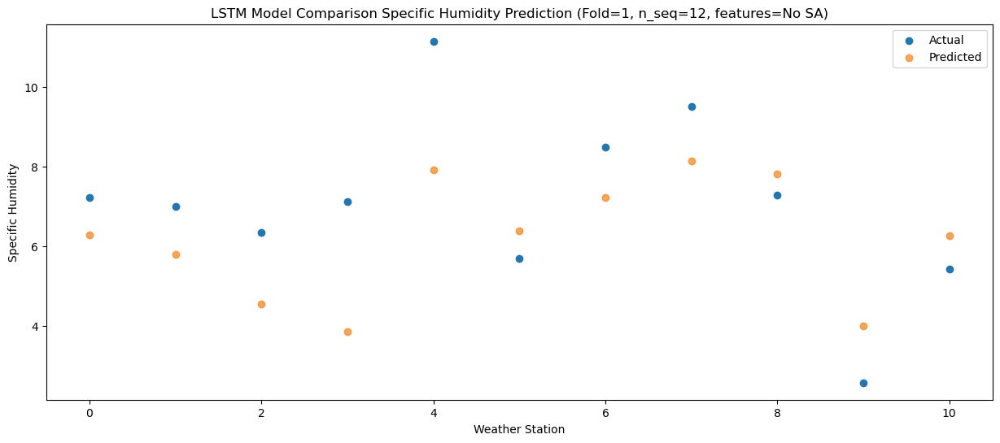

Model: "sequential_502"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1004 (LSTM)            (1, 1, 1024)              12263424  
                                                                 
 dropout_1004 (Dropout)      (1, 1, 1024)              0         
                                                                 
 lstm_1005 (LSTM)            (1, 1024)                 8392704   
                                                                 
 dropout_1005 (Dropout)      (1, 1024)                 0         
                                                                 
 dense_1506 (Dense)          (1, 256)                  262400    
                                                                 
 dense_1507 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1508 (Dense)          (1, 12)                

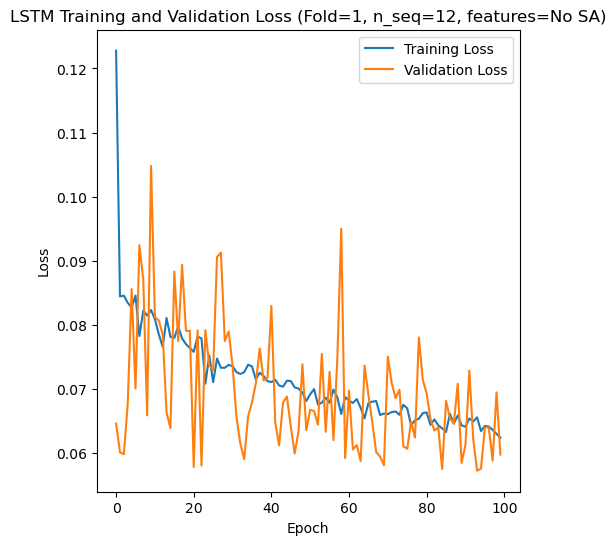

Epoch 1/100
84/84 [==============================] - 18s 80ms/step - loss: 0.1082 - accuracy: 0.6190 - mae: 0.0848 - rmse: 0.1082 - mape: 19.0657 - pearson: 0.6526 - val_loss: 0.1059 - val_accuracy: 1.0000 - val_mae: 0.0822 - val_rmse: 0.1059 - val_mape: 23.0403 - val_pearson: 0.6784
Epoch 2/100
84/84 [==============================] - 4s 47ms/step - loss: 0.0851 - accuracy: 0.6429 - mae: 0.0674 - rmse: 0.0851 - mape: 15.7390 - pearson: 0.7040 - val_loss: 0.0793 - val_accuracy: 1.0000 - val_mae: 0.0641 - val_rmse: 0.0793 - val_mape: 15.2662 - val_pearson: 0.7609
Epoch 3/100
84/84 [==============================] - 4s 47ms/step - loss: 0.0856 - accuracy: 0.6071 - mae: 0.0677 - rmse: 0.0856 - mape: 15.7195 - pearson: 0.7055 - val_loss: 0.0879 - val_accuracy: 0.0000e+00 - val_mae: 0.0651 - val_rmse: 0.0879 - val_mape: 13.5067 - val_pearson: 0.7344
Epoch 4/100
84/84 [==============================] - 4s 47ms/step - loss: 0.0830 - accuracy: 0.6310 - mae: 0.0662 - rmse: 0.0830 - mape: 15.085

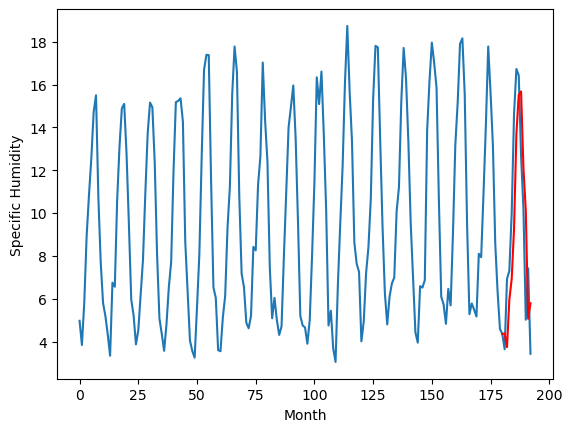

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.84		1.64		-0.20
1.16		1.00		-0.16
3.01		3.22		0.21
3.13		4.19		1.06
8.25		6.53		-1.72
11.16		10.96		-0.20
12.77		12.79		0.02
11.15		12.95		1.80
8.33		9.38		1.05
4.94		7.37		2.43
2.51		2.33		-0.18
1.45		3.05		1.60
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.82, 1.6419464045763015, 1.0023600751161574, 3.2202210122346875, 4.189892678856849, 6.532227664589882, 10.95552554666996, 12.787556200623513, 12.946849405169488, 9.375436841845513, 7.374664842486382, 2.333409845232964, 3.0527434939146048]


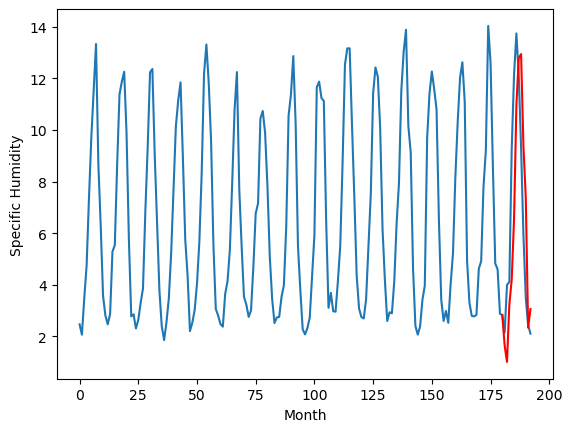

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.53		4.80		-0.73
7.66		4.17		-3.49
7.88		6.38		-1.50
8.85		7.35		-1.50
10.16		9.69		-0.47
13.94		14.11		0.17
14.34		15.95		1.61
14.96		16.11		1.15
13.68		12.54		-1.14
11.02		10.54		-0.48
7.07		5.50		-1.57
8.47		6.24		-2.23
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.16, 4.798981794118881, 4.165427454710007, 6.379898556470871, 7.353243597745895, 9.691303738355636, 14.114699372053146, 15.947223314046859, 16.107038550972938, 12.543108039498328, 10.544382863640784, 5.4991396003961555, 6.23883133471012]


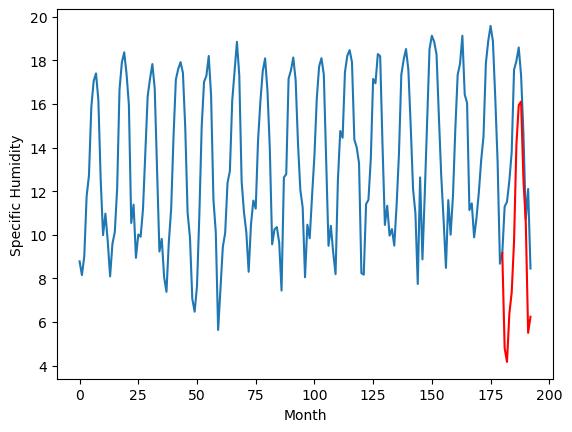

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.98		4.82		0.84
4.15		4.19		0.04
4.79		6.40		1.61
6.14		7.37		1.23
7.82		9.70		1.88
12.42		14.13		1.71
15.02		15.96		0.94
15.76		16.12		0.36
13.10		12.55		-0.55
10.14		10.55		0.41
5.69		5.51		-0.18
5.33		6.24		0.91
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.44, 4.819383603930473, 4.185106140971183, 6.3976307934522625, 7.370125216841697, 9.701779288649558, 14.125924987196921, 15.956742090582846, 16.118597534894942, 12.547287491559981, 10.551532176733016, 5.506048587560652, 6.23637065052986]


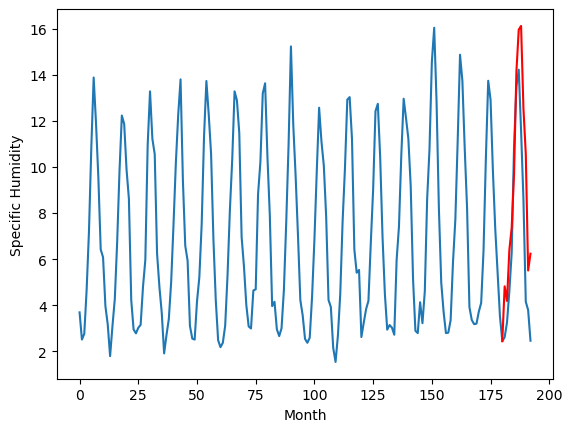

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.10		4.73		-0.37
5.08		4.09		-0.99
8.37		6.31		-2.06
8.39		7.28		-1.11
11.59		9.61		-1.98
15.48		14.04		-1.44
16.51		15.87		-0.64
16.11		16.02		-0.09
13.97		12.46		-1.51
11.44		10.46		-0.98
5.78		5.41		-0.37
9.06		6.16		-2.90
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.65, 4.727757663726806, 4.091732115745544, 6.307628483772278, 7.278525264263153, 9.613983781337737, 14.03904500722885, 15.868479878902434, 16.024850697517394, 12.459856600761412, 10.462034196853637, 5.414172143936156, 6.156488389968871]


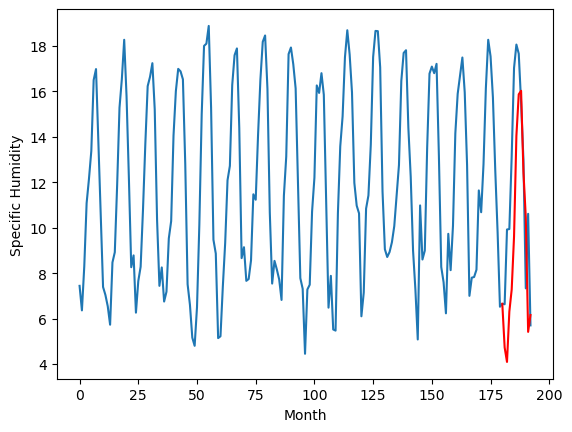

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.33		2.22		-0.11
2.28		1.58		-0.70
5.27		3.80		-1.47
6.84		4.77		-2.07
11.67		7.11		-4.56
14.31		11.53		-2.78
13.27		13.36		0.09
13.40		13.51		0.11
9.84		9.95		0.11
8.25		7.95		-0.30
4.06		2.90		-1.16
6.93		3.64		-3.29
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.19, 2.219763389825821, 1.5781334555149078, 3.797681919336319, 4.76904421210289, 7.105651191473007, 11.531733802556992, 13.358743361234666, 13.512733927965165, 9.947626343965531, 7.947985521554948, 2.9048122084140786, 3.643627516031266]


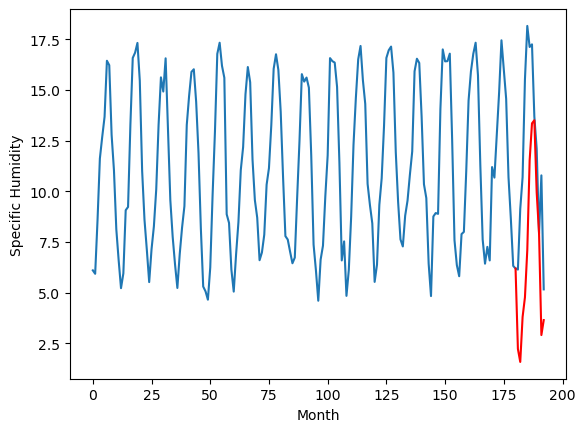

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.68		8.54		-0.14
8.35		7.89		-0.46
11.21		10.11		-1.10
12.53		11.08		-1.45
16.73		13.42		-3.31
20.48		17.85		-2.63
21.30		19.68		-1.62
21.68		19.83		-1.85
17.23		16.26		-0.97
14.62		14.26		-0.36
10.63		9.22		-1.41
13.13		9.96		-3.17
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.78, 8.535713626742362, 7.892275764346122, 10.113819553256034, 11.08447207391262, 13.42323030412197, 17.852718963027, 19.678874148726464, 19.829963399767877, 16.26189751803875, 14.261334611773492, 9.222035600543023, 9.95817370593548]


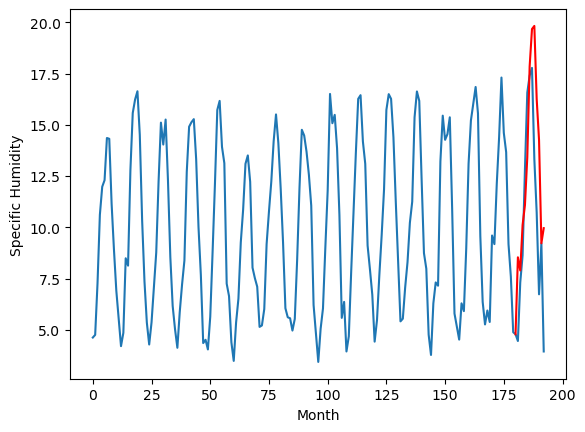

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.97		3.45		-0.52
3.84		2.81		-1.03
3.93		5.02		1.09
4.23		5.99		1.76
4.35		8.33		3.98
7.01		12.76		5.75
12.25		14.59		2.34
12.54		14.74		2.20
9.78		11.18		1.40
6.07		9.18		3.11
4.42		4.15		-0.27
4.55		4.88		0.33
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.61, 3.448997604250908, 2.8098590248823165, 5.024618374705314, 5.994103299975395, 8.334711181521415, 12.757724868655204, 14.587768899798393, 14.744110020399093, 11.178661497831344, 9.180666717290878, 4.146555694341659, 4.8801219785213465]


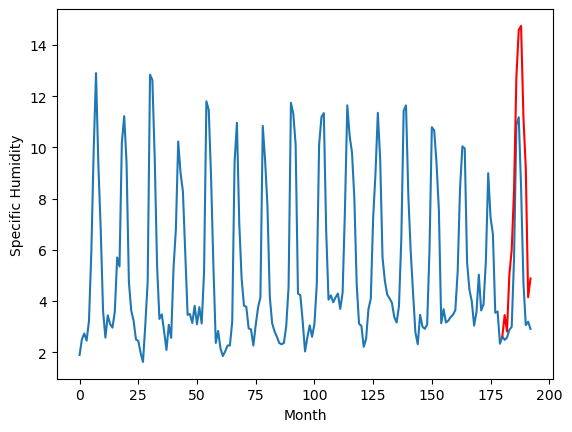

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.29		7.20		-1.09
8.82		6.56		-2.26
8.93		8.77		-0.16
10.25		9.74		-0.51
11.73		12.08		0.35
12.98		16.50		3.52
14.13		18.33		4.20
13.53		18.49		4.96
13.07		14.93		1.86
10.27		12.93		2.66
9.73		7.90		-1.83
9.55		8.64		-0.91
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.6, 7.201910885572434, 6.563350888490677, 8.771495314836503, 9.741973491907121, 12.079737516641618, 16.500586363077165, 18.328704210519792, 18.490390109419824, 14.928752707839013, 12.932855057120324, 7.902425693869592, 8.636070536971094]


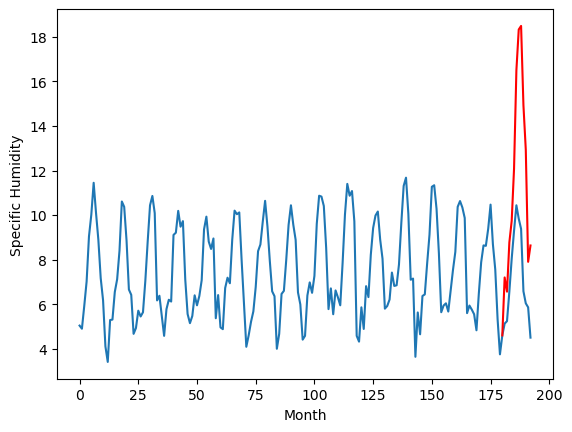

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.98		5.86		-0.12
6.05		5.22		-0.83
7.78		7.44		-0.34
8.31		8.41		0.10
11.02		10.74		-0.28
15.52		15.17		-0.35
17.04		17.00		-0.04
17.62		17.16		-0.46
14.02		13.60		-0.42
11.86		11.60		-0.26
6.30		6.55		0.25
8.15		7.30		-0.85
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.27, 5.858846253156662, 5.223359948396682, 7.437008267641067, 8.408970183134079, 10.74426776766777, 15.169962233304977, 17.002609676122667, 17.15794793367386, 13.595519936084749, 11.598835027217866, 6.554751908779146, 7.2954934597015395]


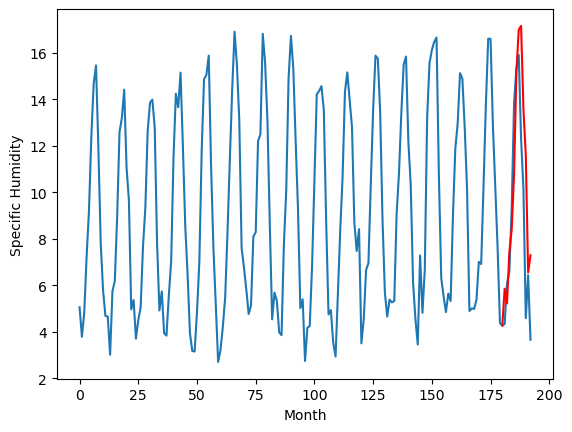

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.63		4.38		-0.25
4.87		3.75		-1.12
5.90		5.96		0.06
6.51		6.93		0.42
9.18		9.27		0.09
13.28		13.70		0.42
14.69		15.53		0.84
15.08		15.69		0.61
11.87		12.12		0.25
10.14		10.13		-0.01
4.78		5.08		0.30
6.34		5.82		-0.52
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.91, 4.380755732655525, 3.7465016943216325, 5.96195651113987, 6.933247933983803, 9.268005262017251, 13.696937451958657, 15.530956636071206, 15.685002754330636, 12.121089647412301, 10.125221202969552, 5.07795138180256, 5.818354795575143]


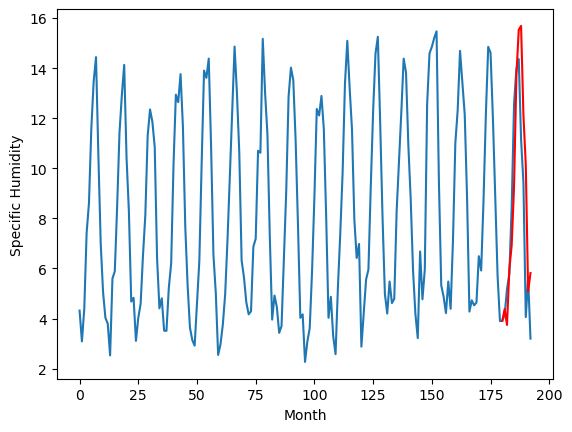

RangeIndex(start=1, stop=12, step=1)
[4.390000000000001, 1.8399999999999992, 5.529999999999999, 3.9799999999999995, 5.1, 2.33, 8.68, 3.9700000000000006, 8.29, 5.9799999999999995, 4.63]
[4.374346773028374, 1.6419464045763015, 4.798981794118881, 4.819383603930473, 4.727757663726806, 2.219763389825821, 8.535713626742362, 3.448997604250908, 7.201910885572434, 5.858846253156662, 4.380755732655525]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.39   4.374347
1                 1    1.84   1.641946
2                 2    5.53   4.798982
3                 3    3.98   4.819384
4                 4    5.10   4.727758
5                 5    2.33   2.219763
6                 6    8.68   8.535714
7                 7    3.97   3.448998
8                 8    8.29   7.201911
9                 9    5.98   5.858846
10               10    4.63   4.380756


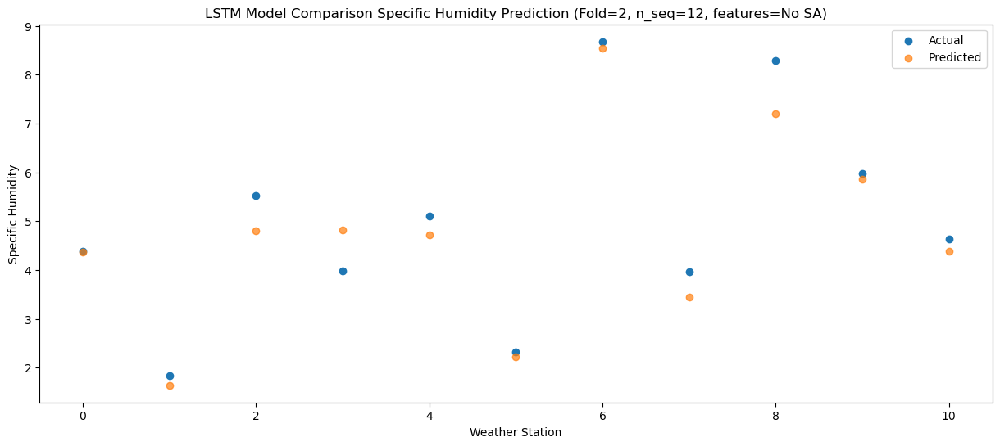

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   3.738935
1                 1    1.16   1.002360
2                 2    7.66   4.165427
3                 3    4.15   4.185106
4                 4    5.08   4.091732
5                 5    2.28   1.578133
6                 6    8.35   7.892276
7                 7    3.84   2.809859
8                 8    8.82   6.563351
9                 9    6.05   5.223360
10               10    4.87   3.746502


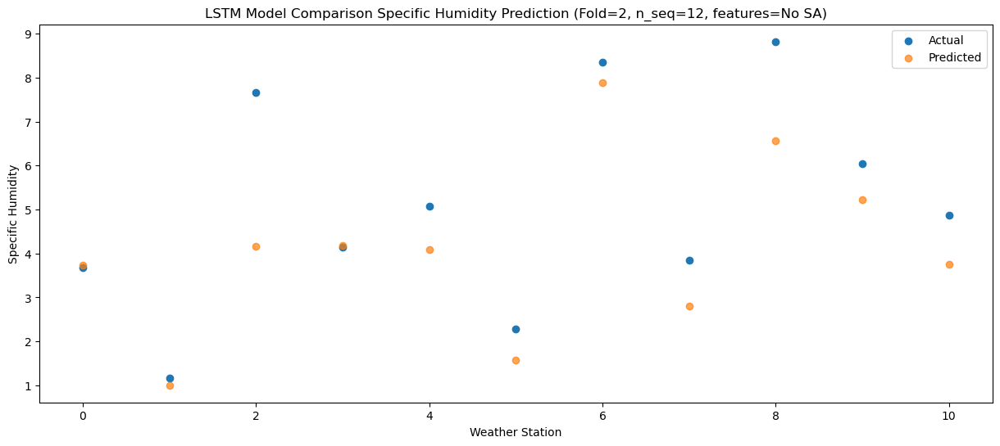

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.95   5.958377
1                 1    3.01   3.220221
2                 2    7.88   6.379899
3                 3    4.79   6.397631
4                 4    8.37   6.307628
5                 5    5.27   3.797682
6                 6   11.21  10.113820
7                 7    3.93   5.024618
8                 8    8.93   8.771495
9                 9    7.78   7.437008
10               10    5.90   5.961957


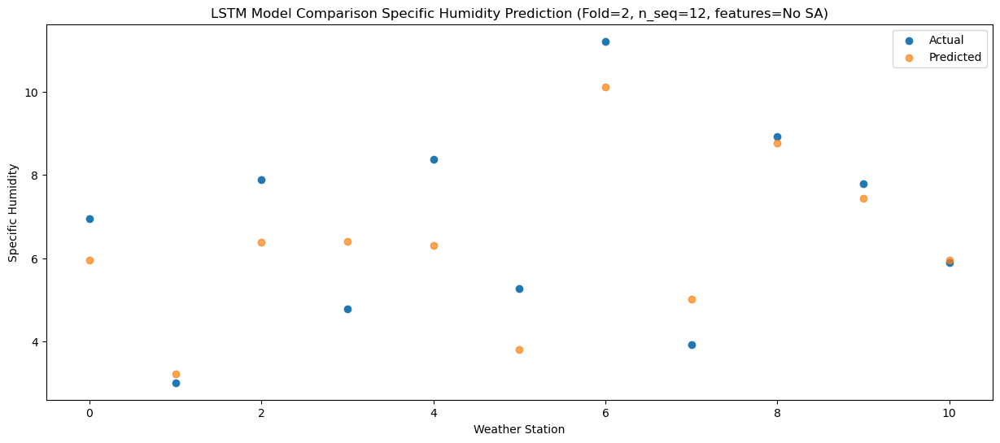

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.34   6.927085
1                 1    3.13   4.189893
2                 2    8.85   7.353244
3                 3    6.14   7.370125
4                 4    8.39   7.278525
5                 5    6.84   4.769044
6                 6   12.53  11.084472
7                 7    4.23   5.994103
8                 8   10.25   9.741973
9                 9    8.31   8.408970
10               10    6.51   6.933248


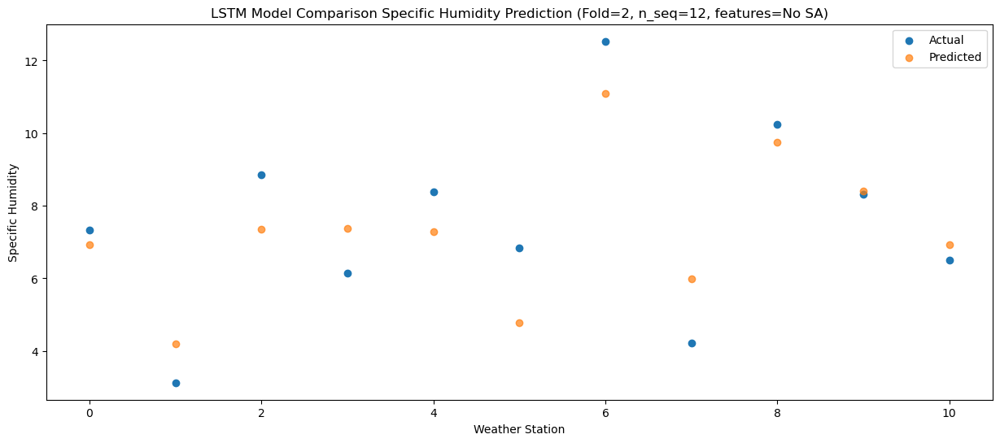

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.01   9.264245
1                 1    8.25   6.532228
2                 2   10.16   9.691304
3                 3    7.82   9.701779
4                 4   11.59   9.613984
5                 5   11.67   7.105651
6                 6   16.73  13.423230
7                 7    4.35   8.334711
8                 8   11.73  12.079738
9                 9   11.02  10.744268
10               10    9.18   9.268005


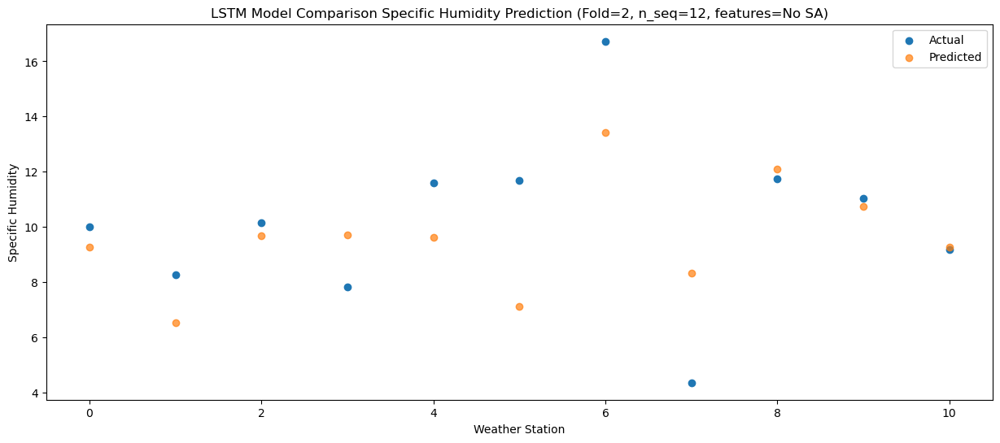

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.66  13.690518
1                 1   11.16  10.955526
2                 2   13.94  14.114699
3                 3   12.42  14.125925
4                 4   15.48  14.039045
5                 5   14.31  11.531734
6                 6   20.48  17.852719
7                 7    7.01  12.757725
8                 8   12.98  16.500586
9                 9   15.52  15.169962
10               10   13.28  13.696937


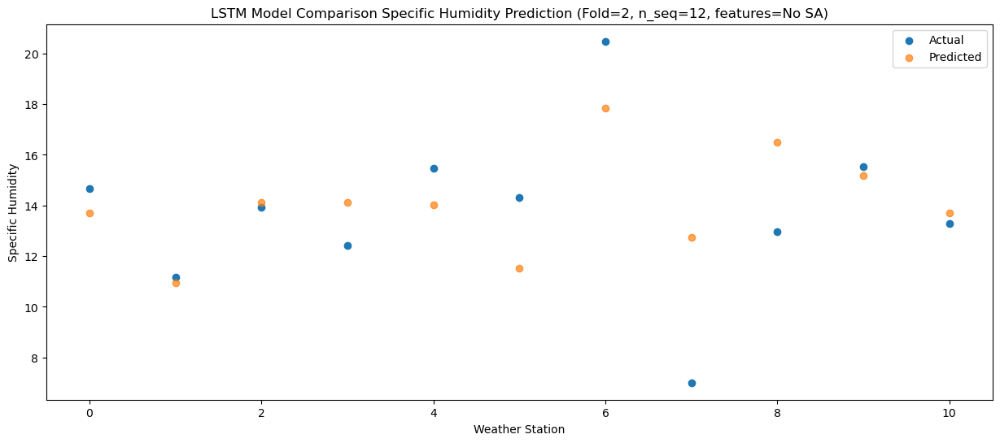

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.76  15.524394
1                 1   12.77  12.787556
2                 2   14.34  15.947223
3                 3   15.02  15.956742
4                 4   16.51  15.868480
5                 5   13.27  13.358743
6                 6   21.30  19.678874
7                 7   12.25  14.587769
8                 8   14.13  18.328704
9                 9   17.04  17.002610
10               10   14.69  15.530957


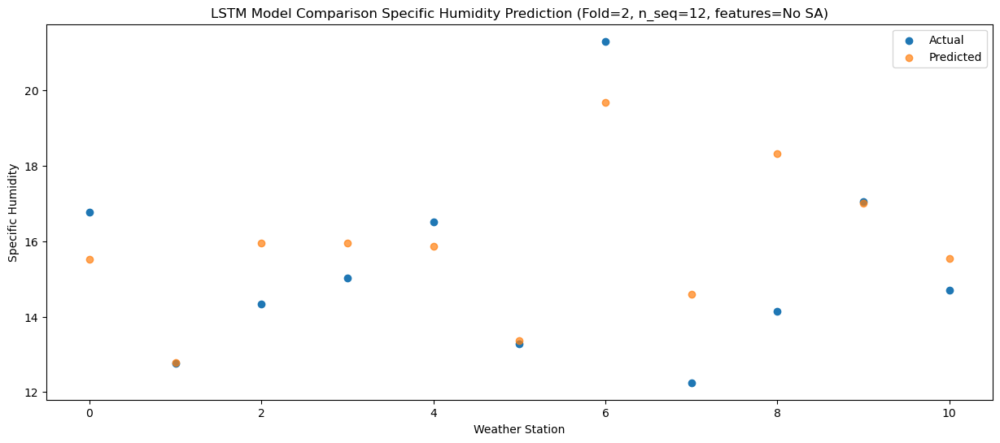

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.46  15.681407
1                 1   11.15  12.946849
2                 2   14.96  16.107039
3                 3   15.76  16.118598
4                 4   16.11  16.024851
5                 5   13.40  13.512734
6                 6   21.68  19.829963
7                 7   12.54  14.744110
8                 8   13.53  18.490390
9                 9   17.62  17.157948
10               10   15.08  15.685003


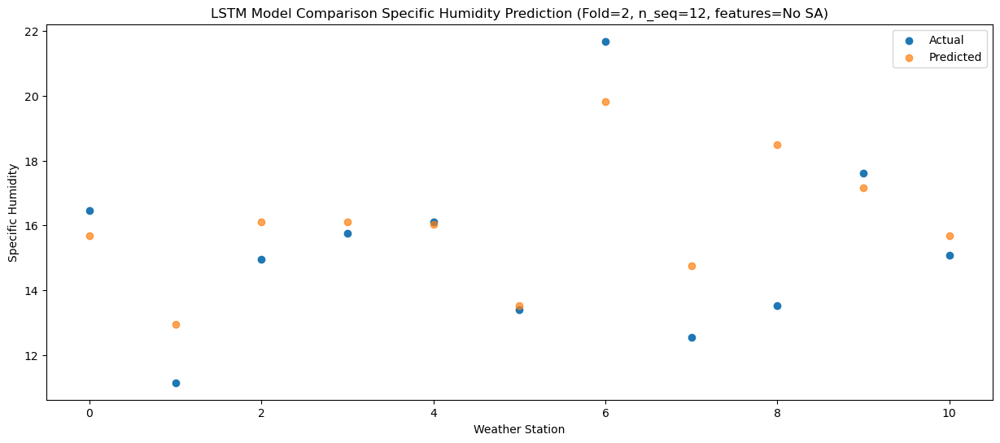

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   12.69  12.109125
1                 1    8.33   9.375437
2                 2   13.68  12.543108
3                 3   13.10  12.547287
4                 4   13.97  12.459857
5                 5    9.84   9.947626
6                 6   17.23  16.261898
7                 7    9.78  11.178661
8                 8   13.07  14.928753
9                 9   14.02  13.595520
10               10   11.87  12.121090


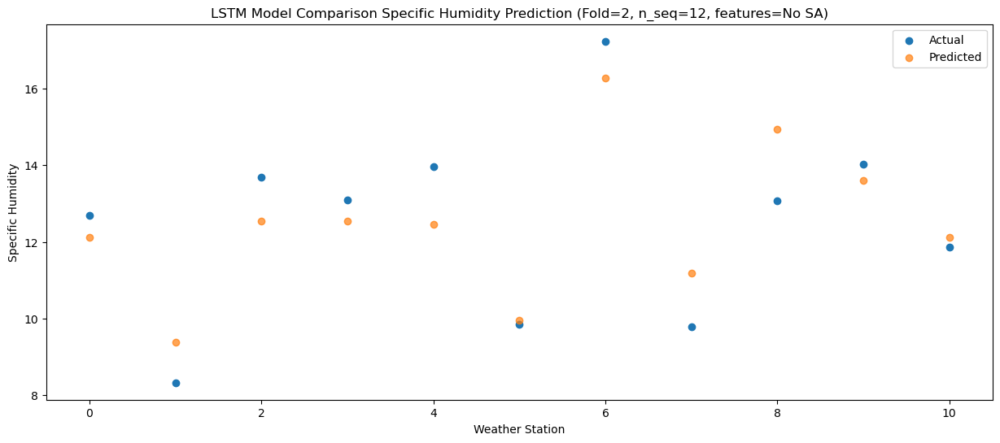

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.24  10.113820
1                 1    4.94   7.374665
2                 2   11.02  10.544383
3                 3   10.14  10.551532
4                 4   11.44  10.462034
5                 5    8.25   7.947986
6                 6   14.62  14.261335
7                 7    6.07   9.180667
8                 8   10.27  12.932855
9                 9   11.86  11.598835
10               10   10.14  10.125221


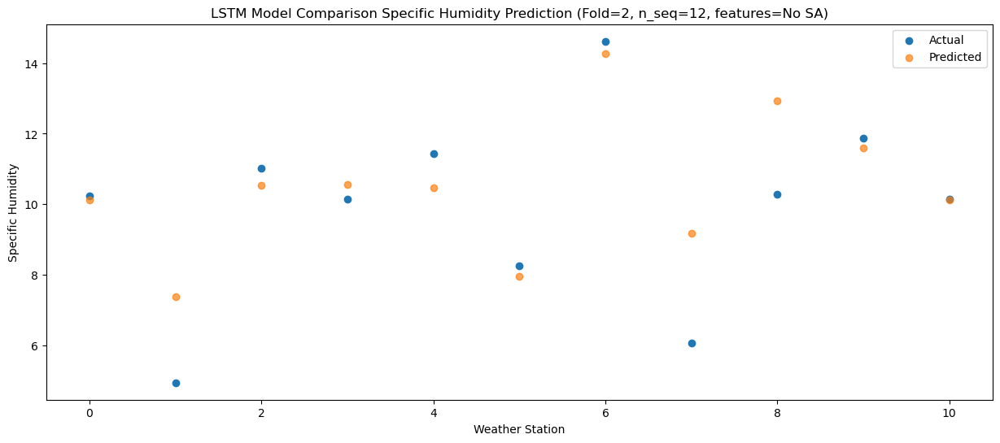

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.05   5.064976
1                 1    2.51   2.333410
2                 2    7.07   5.499140
3                 3    5.69   5.506049
4                 4    5.78   5.414172
5                 5    4.06   2.904812
6                 6   10.63   9.222036
7                 7    4.42   4.146556
8                 8    9.73   7.902426
9                 9    6.30   6.554752
10               10    4.78   5.077951


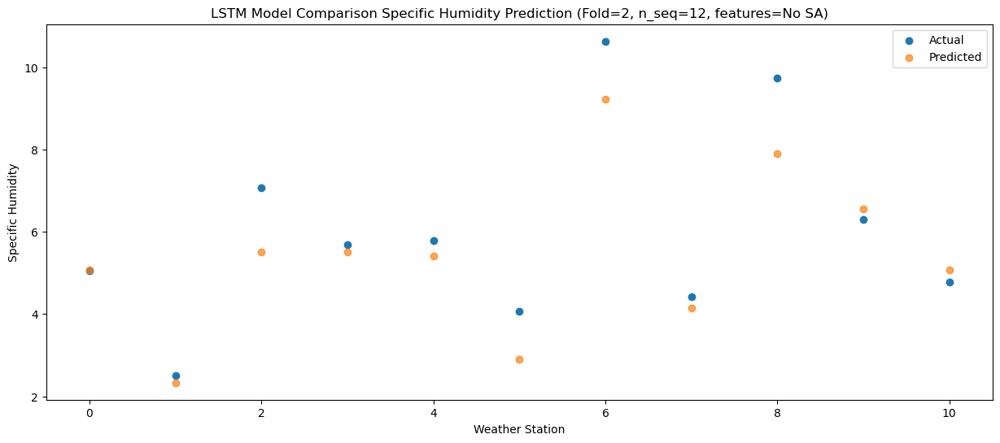

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.45   5.790181
1                 1    1.45   3.052743
2                 2    8.47   6.238831
3                 3    5.33   6.236371
4                 4    9.06   6.156488
5                 5    6.93   3.643628
6                 6   13.13   9.958174
7                 7    4.55   4.880122
8                 8    9.55   8.636071
9                 9    8.15   7.295493
10               10    6.34   5.818355


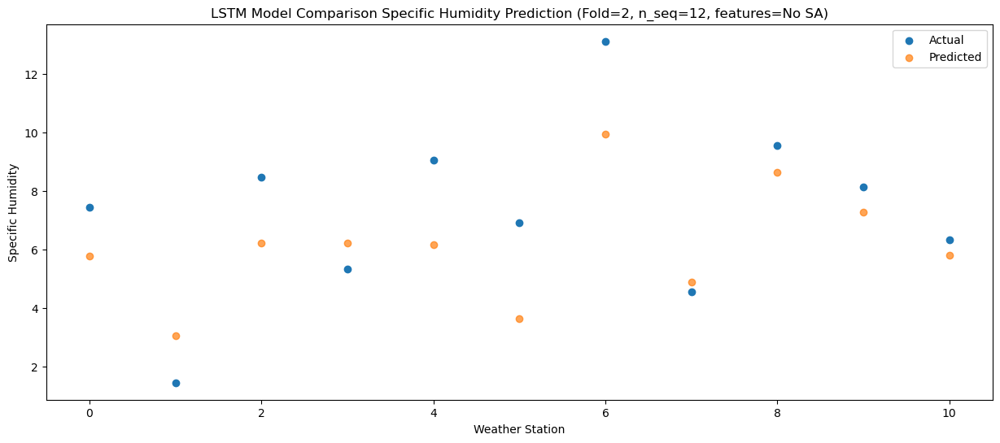

Model: "sequential_503"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1006 (LSTM)            (1, 1, 1024)              12263424  
                                                                 
 dropout_1006 (Dropout)      (1, 1, 1024)              0         
                                                                 
 lstm_1007 (LSTM)            (1, 1024)                 8392704   
                                                                 
 dropout_1007 (Dropout)      (1, 1024)                 0         
                                                                 
 dense_1509 (Dense)          (1, 256)                  262400    
                                                                 
 dense_1510 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1511 (Dense)          (1, 12)                

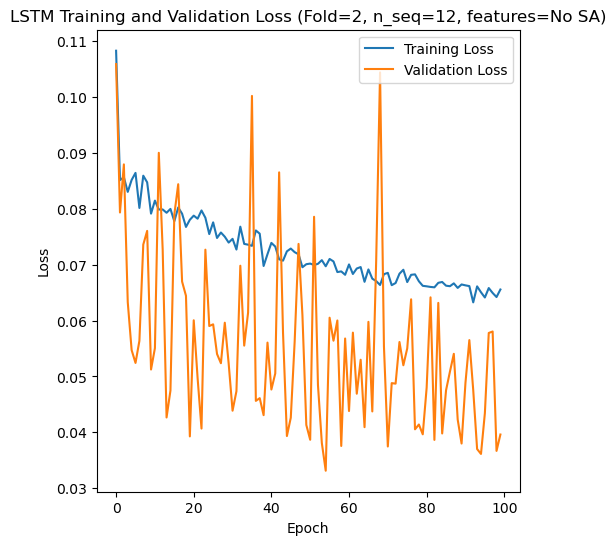

Epoch 1/100
84/84 [==============================] - 19s 99ms/step - loss: 0.1148 - accuracy: 0.6071 - mae: 0.0940 - rmse: 0.1148 - mape: 20.7332 - pearson: 0.6911 - val_loss: 0.0739 - val_accuracy: 0.9000 - val_mae: 0.0567 - val_rmse: 0.0739 - val_mape: 14.8419 - val_pearson: 0.6754
Epoch 2/100
84/84 [==============================] - 4s 45ms/step - loss: 0.0791 - accuracy: 0.6786 - mae: 0.0629 - rmse: 0.0791 - mape: 13.9915 - pearson: 0.7515 - val_loss: 0.1065 - val_accuracy: 0.9000 - val_mae: 0.0829 - val_rmse: 0.1065 - val_mape: 17.8815 - val_pearson: 0.6932
Epoch 3/100
84/84 [==============================] - 4s 49ms/step - loss: 0.0789 - accuracy: 0.6190 - mae: 0.0633 - rmse: 0.0789 - mape: 14.3777 - pearson: 0.7461 - val_loss: 0.0877 - val_accuracy: 0.1000 - val_mae: 0.0679 - val_rmse: 0.0877 - val_mape: 15.8008 - val_pearson: 0.6512
Epoch 4/100
84/84 [==============================] - 4s 47ms/step - loss: 0.0790 - accuracy: 0.6310 - mae: 0.0631 - rmse: 0.0790 - mape: 14.5641 - 

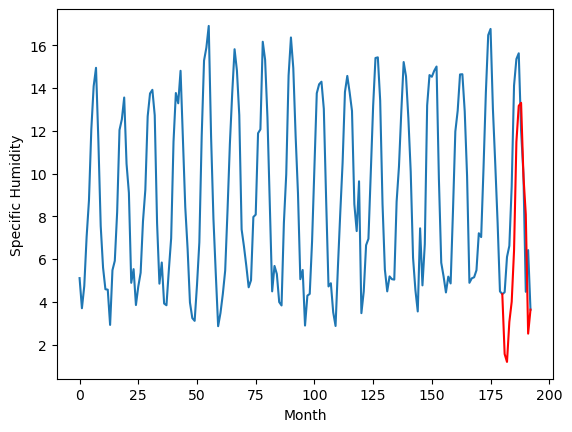

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.64		2.60		-0.04
2.08		2.23		0.15
4.59		4.10		-0.49
5.76		5.05		-0.71
9.28		7.45		-1.83
13.81		12.53		-1.28
14.69		14.22		-0.47
14.86		14.36		-0.50
10.89		10.94		0.05
8.70		9.14		0.44
4.27		3.56		-0.71
5.24		4.68		-0.56
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.43, 2.596386979818344, 2.2267033565044403, 4.104665945768357, 5.046377133131028, 7.448156784772873, 12.527101944684983, 14.219534109830857, 14.357337455749512, 10.941375236511231, 9.143041472434998, 3.5623262929916386, 4.684804420471192]


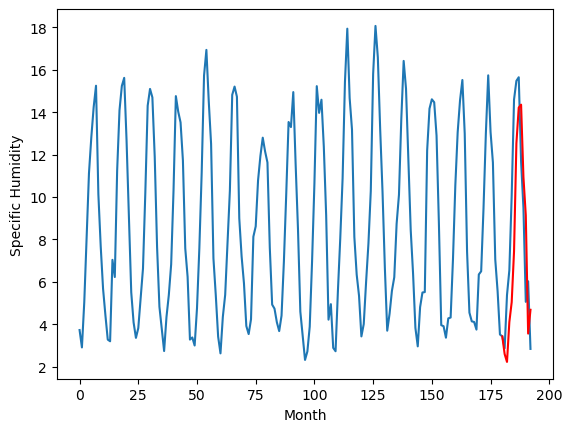

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.37		5.79		-0.58
6.31		5.42		-0.89
6.39		7.29		0.90
7.01		8.23		1.22
7.41		10.63		3.22
9.86		15.70		5.84
10.56		17.39		6.83
10.09		17.53		7.44
8.80		14.11		5.31
7.66		12.31		4.65
8.24		6.73		-1.51
6.74		7.85		1.11
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.43, 5.792102180719375, 5.418824546337127, 7.287976734638214, 8.229162924289703, 10.62868904352188, 15.703809492588043, 17.392720572948456, 17.52704928100109, 14.10999367415905, 12.30870292365551, 6.733981110453605, 7.85123381793499]


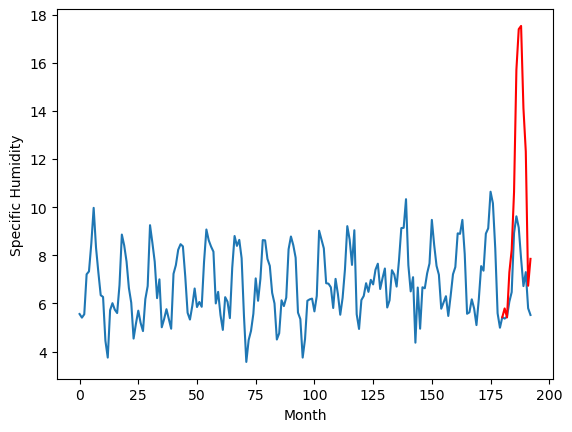

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.44		3.58		0.14
3.37		3.21		-0.16
4.67		5.08		0.41
5.86		6.03		0.17
8.39		8.43		0.04
13.81		13.51		-0.30
14.44		15.20		0.76
15.32		15.34		0.02
11.85		11.92		0.07
9.79		10.12		0.33
4.10		4.54		0.44
5.24		5.67		0.43
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.21, 3.57750265955925, 3.20842569231987, 5.083434633016586, 6.028187326192856, 8.425861886739732, 13.50922065138817, 15.20190327525139, 15.340455881357194, 11.923635116815568, 10.123890272378922, 4.544846884012223, 5.668920270204545]


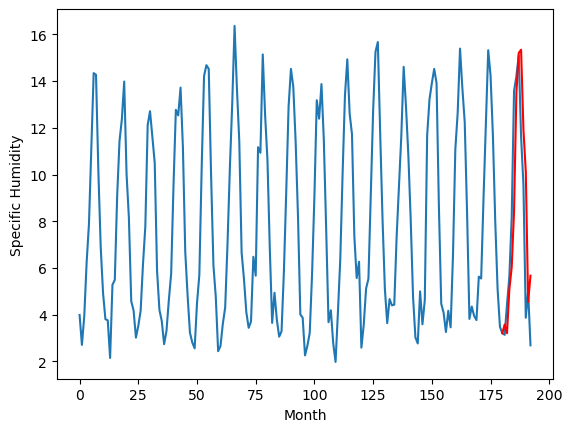

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.91		4.98		0.07
4.08		4.61		0.53
6.56		6.49		-0.07
7.62		7.44		-0.18
10.04		9.84		-0.20
14.50		14.92		0.42
16.45		16.62		0.17
16.54		16.76		0.22
12.77		13.34		0.57
10.82		11.54		0.72
5.70		5.96		0.26
6.40		7.08		0.68
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.04, 4.981830970048905, 4.612538412809372, 6.492195681333542, 7.436273530721665, 9.83795733809471, 14.919249013662338, 16.61616130232811, 16.75678283035755, 13.340619862675666, 11.54216474354267, 5.957247675061225, 7.080013931393623]


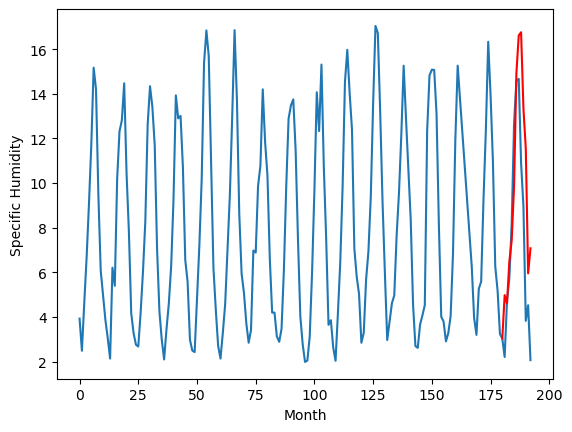

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.42		3.60		0.18
2.90		3.23		0.33
4.93		5.11		0.18
6.23		6.06		-0.17
8.47		8.46		-0.01
13.69		13.54		-0.15
14.94		15.24		0.30
15.11		15.38		0.27
11.81		11.97		0.16
10.19		10.17		-0.02
4.32		4.58		0.26
5.37		5.70		0.33
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.91, 3.6011339086294174, 3.2322580474615097, 5.114228929877282, 6.057750906348229, 8.458963121771813, 13.542144979834557, 15.239456500411034, 15.38094330906868, 11.965149651765824, 10.166743289232254, 4.581025611162186, 5.702993284463883]


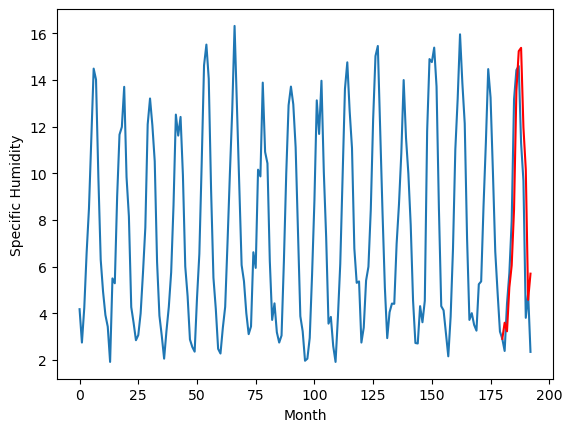

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.73		5.43		-0.30
5.79		5.05		-0.74
6.10		6.93		0.83
6.57		7.87		1.30
7.97		10.27		2.30
9.30		15.35		6.05
11.75		17.04		5.29
10.32		17.18		6.86
8.62		13.76		5.14
7.53		11.95		4.42
6.82		6.37		-0.45
6.11		7.49		1.38
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.6, 5.425616455674171, 5.052449507117271, 6.927700204253196, 7.871060711741447, 10.273347956538199, 15.349874121546744, 17.03970752418041, 17.175265026688574, 13.756481123566626, 11.951153588891028, 6.374777627587317, 7.492543650269507]


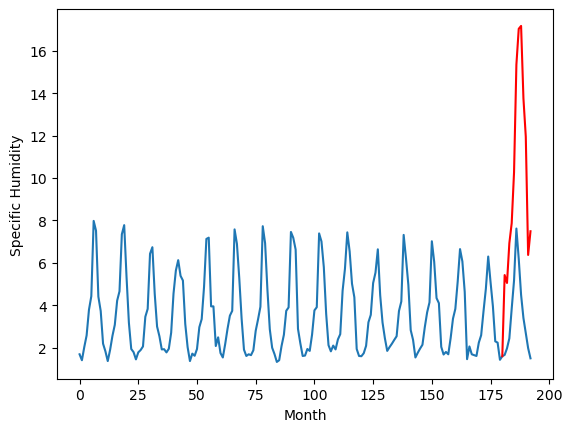

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.80		3.85		-0.95
4.32		3.48		-0.84
4.62		5.35		0.73
4.31		6.29		1.98
4.87		8.70		3.83
6.29		13.77		7.48
11.65		15.46		3.81
9.22		15.59		6.37
7.50		12.18		4.68
6.40		10.37		3.97
5.13		4.80		-0.33
5.27		5.92		0.65
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.86, 3.8503750169277193, 3.4780864024162295, 5.350664904117584, 6.292376091480255, 8.696622898578644, 13.772845795154572, 15.460149219036103, 15.594300037026406, 12.176028495430947, 10.374372845292092, 4.804295426011086, 5.918724065423012]


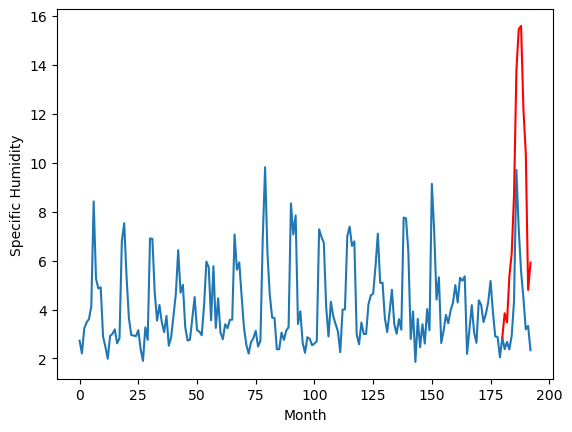

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.60		3.79		-0.81
4.25		3.42		-0.83
3.90		5.29		1.39
4.83		6.23		1.40
5.27		8.63		3.36
6.70		13.71		7.01
7.18		15.39		8.21
7.57		15.53		7.96
6.93		12.11		5.18
5.90		10.31		4.41
6.12		4.74		-1.38
4.87		5.85		0.98
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.65, 3.79085020005703, 3.4193601387739183, 5.289412357211113, 6.229141630530357, 8.631321586966514, 13.706326164603233, 15.390818156599998, 15.525001846551895, 12.106496893167495, 10.305556617975235, 4.735713802576065, 5.85215433716774]


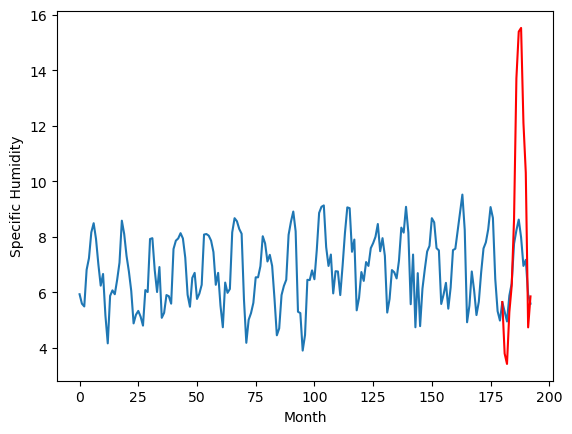

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.09		4.04		0.95
3.24		3.67		0.43
4.02		5.54		1.52
5.40		6.49		1.09
6.97		8.88		1.91
11.87		13.96		2.09
14.08		15.66		1.58
14.46		15.79		1.33
11.86		12.38		0.52
9.32		10.57		1.25
4.79		5.00		0.21
4.49		6.11		1.62
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.54, 4.042382546067238, 3.6721986311674115, 5.543488361239433, 6.486181773543358, 8.883738555312156, 13.964912452101707, 15.655579246878624, 15.79341643333435, 12.375118427276611, 10.57149284362793, 4.996563606262207, 6.111724190711975]


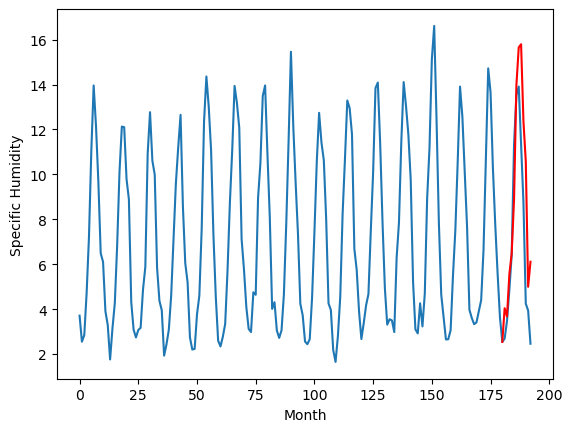

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.00		1.55		0.55
0.86		1.18		0.32
2.14		3.06		0.92
3.55		4.00		0.45
5.14		6.39		1.25
10.01		11.48		1.47
11.70		13.17		1.47
12.02		13.31		1.29
9.10		9.89		0.79
7.20		8.08		0.88
2.28		2.50		0.22
2.18		3.62		1.44
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.51, 1.5524647259712219, 1.1848384463787078, 3.0557868802547454, 3.9972824776172637, 6.391520234346389, 11.476061078310012, 13.16702470421791, 13.306151586174964, 9.888139682412147, 8.083959179520606, 2.504663544297218, 3.618952112793922]


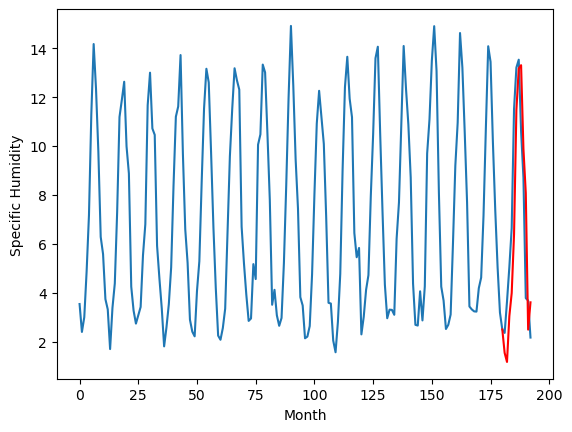

RangeIndex(start=1, stop=12, step=1)
[1.5600000000000005, 2.64, 6.369999999999998, 3.4399999999999995, 4.91, 3.42, 5.73, 4.800000000000001, 4.6, 3.09, 0.9999999999999993]
[1.555889087319374, 2.596386979818344, 5.792102180719375, 3.57750265955925, 4.981830970048905, 3.6011339086294174, 5.425616455674171, 3.8503750169277193, 3.79085020005703, 4.042382546067238, 1.5524647259712219]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    1.56   1.555889
1                 1    2.64   2.596387
2                 2    6.37   5.792102
3                 3    3.44   3.577503
4                 4    4.91   4.981831
5                 5    3.42   3.601134
6                 6    5.73   5.425616
7                 7    4.80   3.850375
8                 8    4.60   3.790850
9                 9    3.09   4.042383
10               10    1.00   1.552465


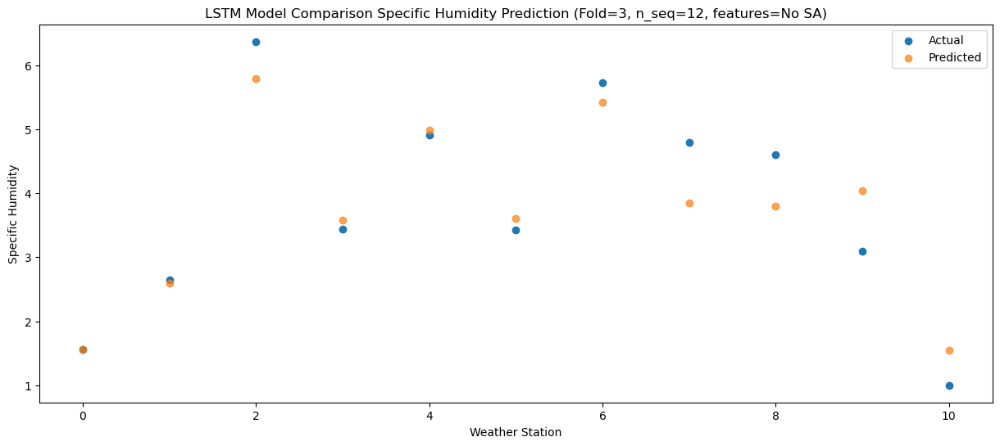

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.65   1.188465
1                 1    2.08   2.226703
2                 2    6.31   5.418825
3                 3    3.37   3.208426
4                 4    4.08   4.612538
5                 5    2.90   3.232258
6                 6    5.79   5.052450
7                 7    4.32   3.478086
8                 8    4.25   3.419360
9                 9    3.24   3.672199
10               10    0.86   1.184838


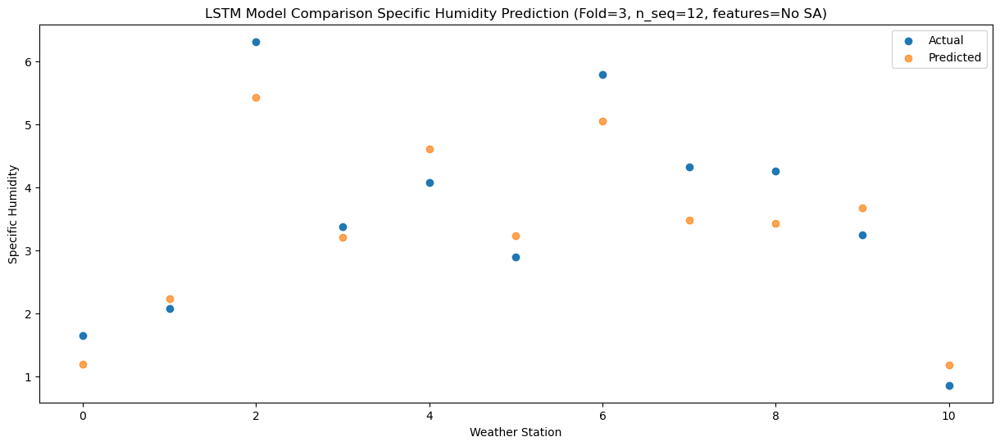

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    3.30   3.062225
1                 1    4.59   4.104666
2                 2    6.39   7.287977
3                 3    4.67   5.083435
4                 4    6.56   6.492196
5                 5    4.93   5.114229
6                 6    6.10   6.927700
7                 7    4.62   5.350665
8                 8    3.90   5.289412
9                 9    4.02   5.543488
10               10    2.14   3.055787


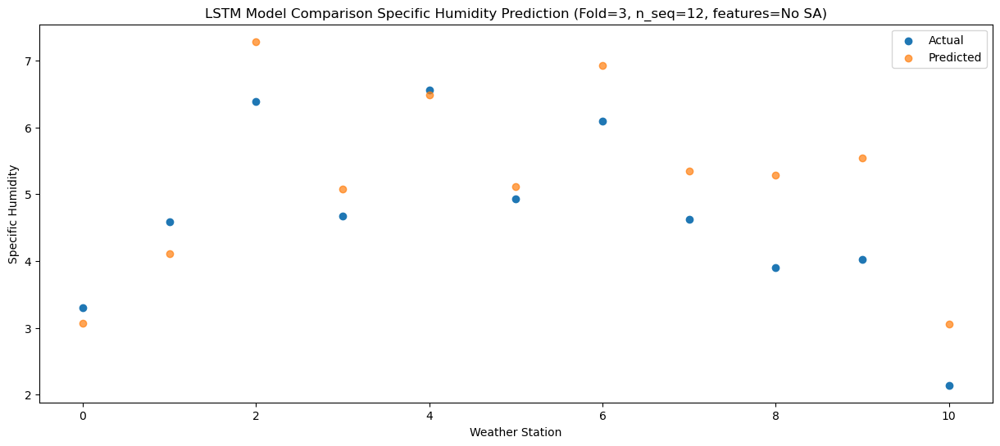

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    3.82   4.003054
1                 1    5.76   5.046377
2                 2    7.01   8.229163
3                 3    5.86   6.028187
4                 4    7.62   7.436274
5                 5    6.23   6.057751
6                 6    6.57   7.871061
7                 7    4.31   6.292376
8                 8    4.83   6.229142
9                 9    5.40   6.486182
10               10    3.55   3.997282


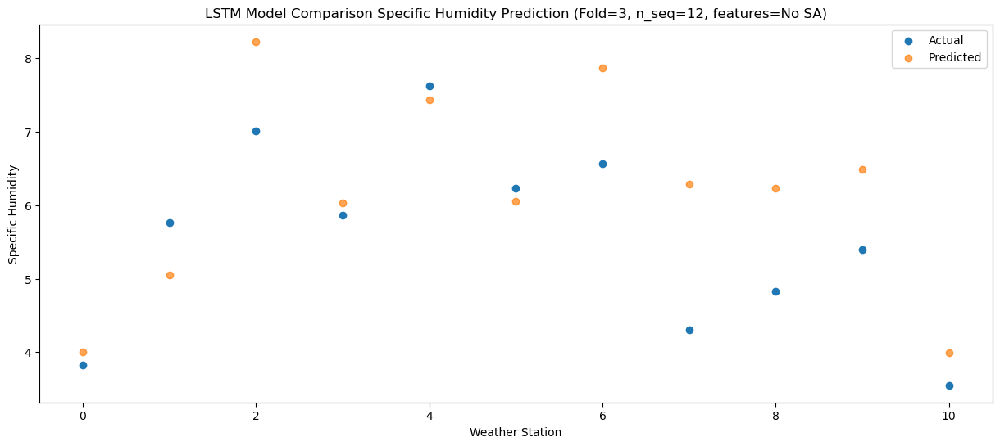

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    6.60   6.399941
1                 1    9.28   7.448157
2                 2    7.41  10.628689
3                 3    8.39   8.425862
4                 4   10.04   9.837957
5                 5    8.47   8.458963
6                 6    7.97  10.273348
7                 7    4.87   8.696623
8                 8    5.27   8.631322
9                 9    6.97   8.883739
10               10    5.14   6.391520


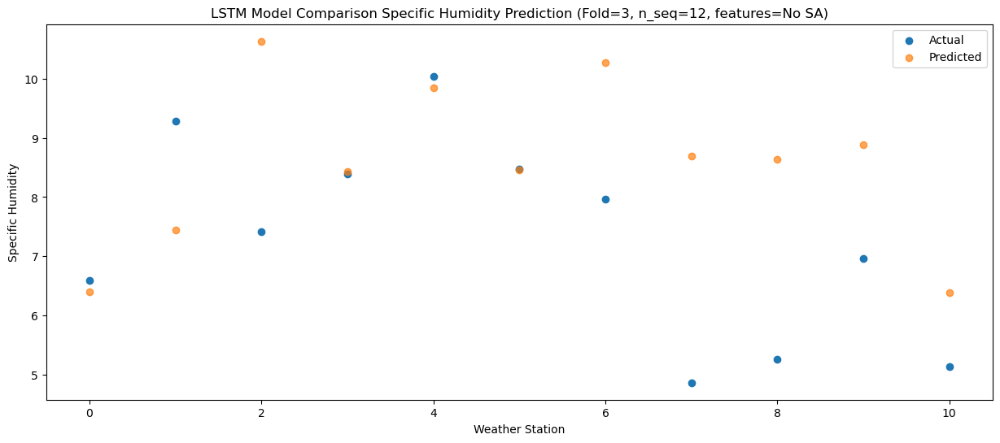

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   11.32  11.480661
1                 1   13.81  12.527102
2                 2    9.86  15.703809
3                 3   13.81  13.509221
4                 4   14.50  14.919249
5                 5   13.69  13.542145
6                 6    9.30  15.349874
7                 7    6.29  13.772846
8                 8    6.70  13.706326
9                 9   11.87  13.964912
10               10   10.01  11.476061


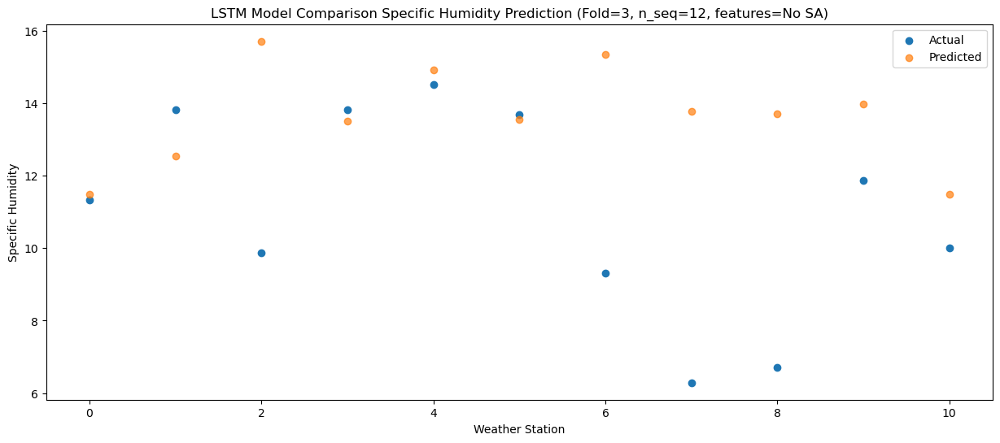

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   12.56  13.170444
1                 1   14.69  14.219534
2                 2   10.56  17.392721
3                 3   14.44  15.201903
4                 4   16.45  16.616161
5                 5   14.94  15.239457
6                 6   11.75  17.039708
7                 7   11.65  15.460149
8                 8    7.18  15.390818
9                 9   14.08  15.655579
10               10   11.70  13.167025


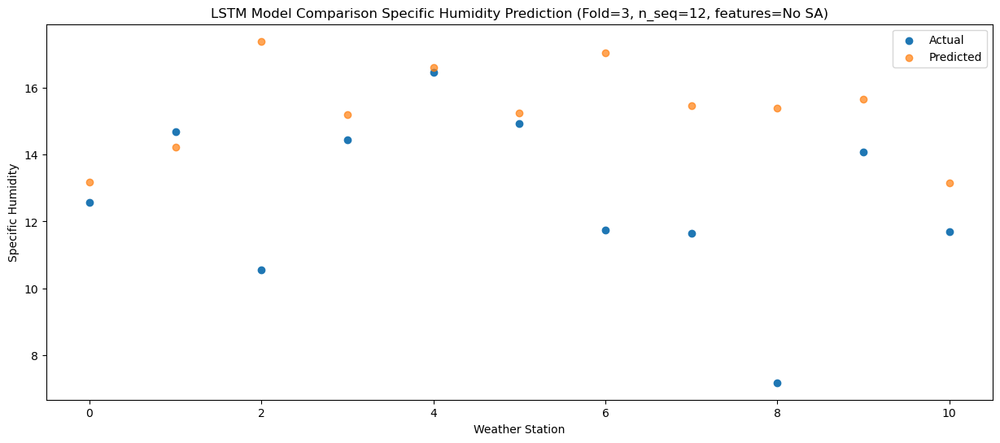

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   12.83  13.311748
1                 1   14.86  14.357337
2                 2   10.09  17.527049
3                 3   15.32  15.340456
4                 4   16.54  16.756783
5                 5   15.11  15.380943
6                 6   10.32  17.175265
7                 7    9.22  15.594300
8                 8    7.57  15.525002
9                 9   14.46  15.793416
10               10   12.02  13.306152


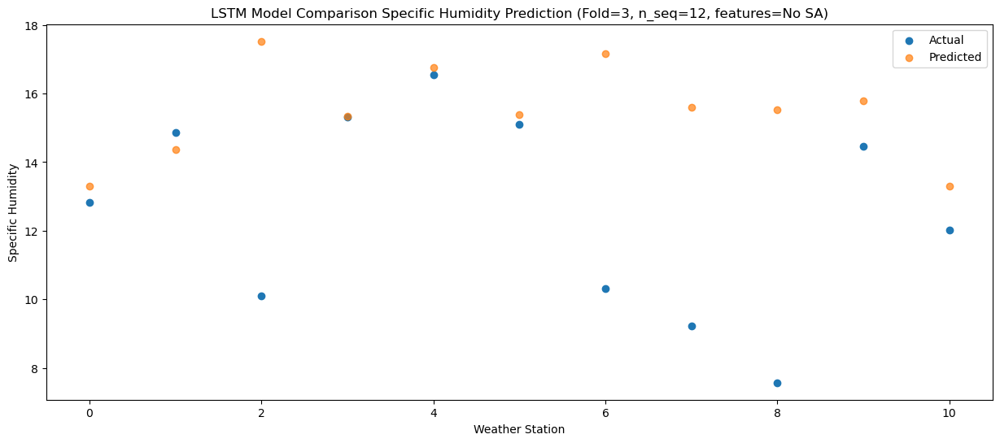

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0    9.21   9.895425
1                 1   10.89  10.941375
2                 2    8.80  14.109994
3                 3   11.85  11.923635
4                 4   12.77  13.340620
5                 5   11.81  11.965150
6                 6    8.62  13.756481
7                 7    7.50  12.176028
8                 8    6.93  12.106497
9                 9   11.86  12.375118
10               10    9.10   9.888140


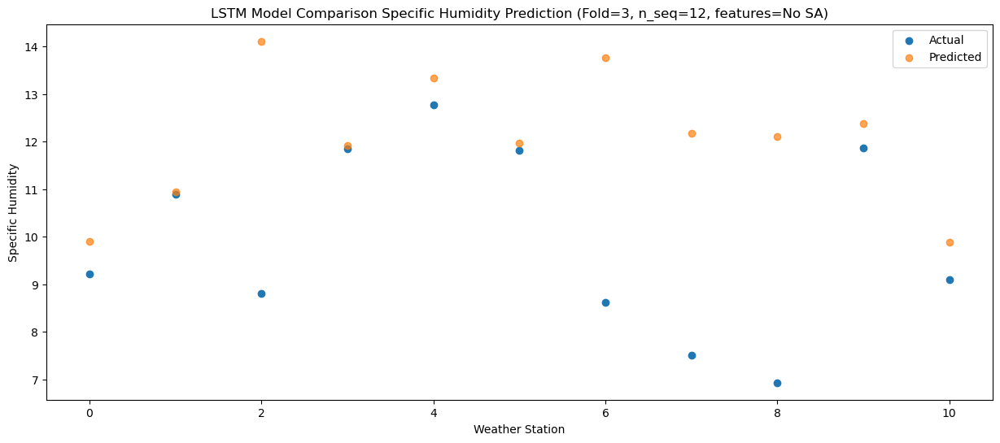

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0    7.17   8.094593
1                 1    8.70   9.143041
2                 2    7.66  12.308703
3                 3    9.79  10.123890
4                 4   10.82  11.542165
5                 5   10.19  10.166743
6                 6    7.53  11.951154
7                 7    6.40  10.374373
8                 8    5.90  10.305557
9                 9    9.32  10.571493
10               10    7.20   8.083959


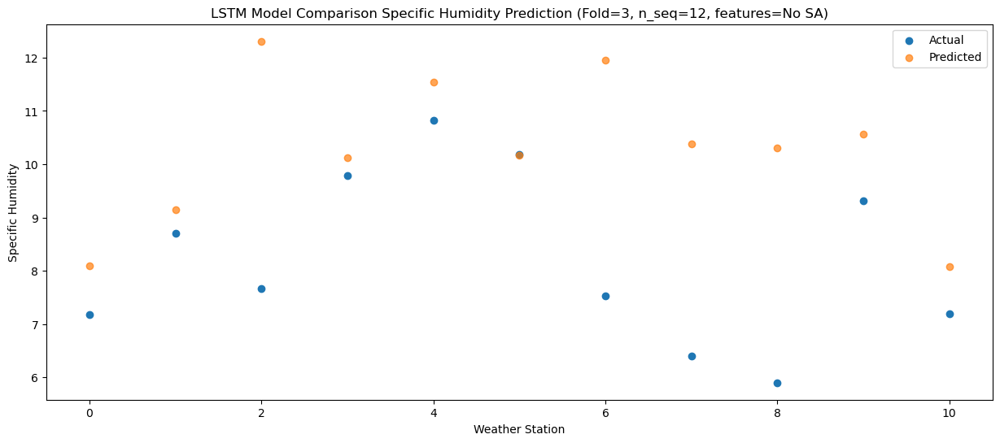

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    1.67   2.511578
1                 1    4.27   3.562326
2                 2    8.24   6.733981
3                 3    4.10   4.544847
4                 4    5.70   5.957248
5                 5    4.32   4.581026
6                 6    6.82   6.374778
7                 7    5.13   4.804295
8                 8    6.12   4.735714
9                 9    4.79   4.996564
10               10    2.28   2.504664


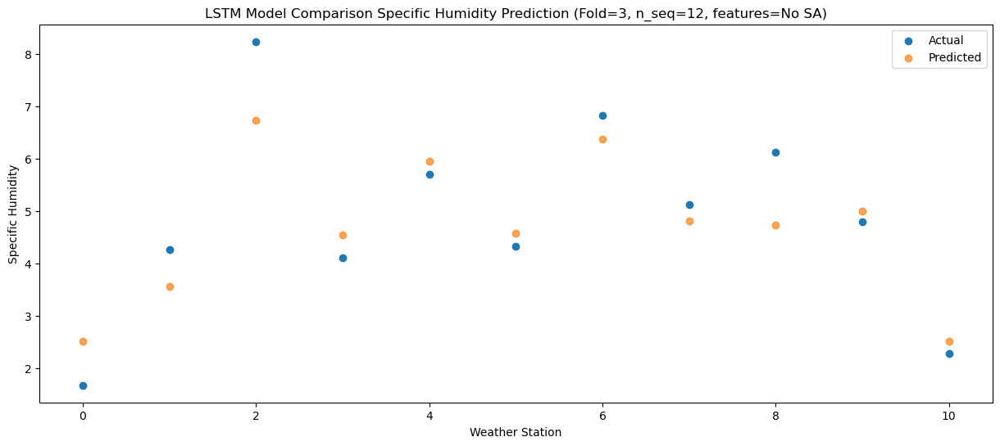

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    3.62   3.634820
1                 1    5.24   4.684804
2                 2    6.74   7.851234
3                 3    5.24   5.668920
4                 4    6.40   7.080014
5                 5    5.37   5.702993
6                 6    6.11   7.492544
7                 7    5.27   5.918724
8                 8    4.87   5.852154
9                 9    4.49   6.111724
10               10    2.18   3.618952


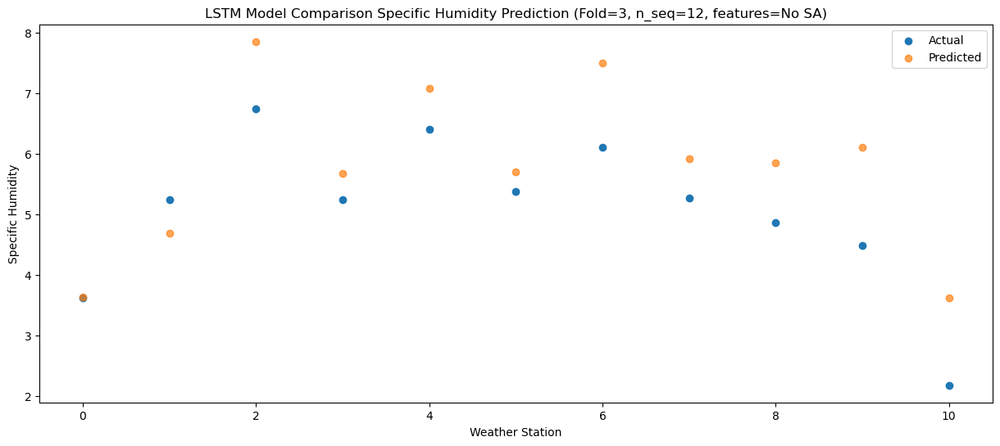

Model: "sequential_504"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1008 (LSTM)            (1, 1, 1024)              12263424  
                                                                 
 dropout_1008 (Dropout)      (1, 1, 1024)              0         
                                                                 
 lstm_1009 (LSTM)            (1, 1024)                 8392704   
                                                                 
 dropout_1009 (Dropout)      (1, 1024)                 0         
                                                                 
 dense_1512 (Dense)          (1, 256)                  262400    
                                                                 
 dense_1513 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1514 (Dense)          (1, 12)                

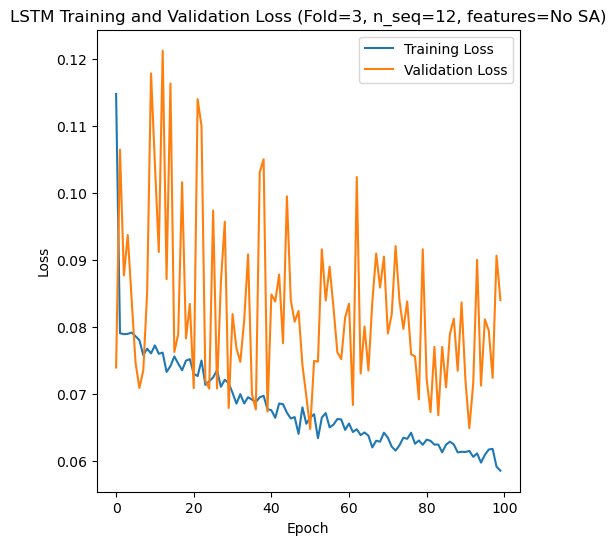

Epoch 1/100
84/84 [==============================] - 9s 51ms/step - loss: 0.1293 - accuracy: 0.5238 - mae: 0.0977 - rmse: 0.1293 - mape: 21.1169 - pearson: 0.6158 - val_loss: 0.0840 - val_accuracy: 0.0000e+00 - val_mae: 0.0680 - val_rmse: 0.0840 - val_mape: 14.9290 - val_pearson: 0.6680
Epoch 2/100
84/84 [==============================] - 3s 40ms/step - loss: 0.0824 - accuracy: 0.6071 - mae: 0.0657 - rmse: 0.0824 - mape: 14.7534 - pearson: 0.7124 - val_loss: 0.1013 - val_accuracy: 0.0000e+00 - val_mae: 0.0804 - val_rmse: 0.1013 - val_mape: 17.4009 - val_pearson: 0.6443
Epoch 3/100
84/84 [==============================] - 3s 41ms/step - loss: 0.0866 - accuracy: 0.6071 - mae: 0.0682 - rmse: 0.0866 - mape: 15.7100 - pearson: 0.7168 - val_loss: 0.0897 - val_accuracy: 0.0000e+00 - val_mae: 0.0730 - val_rmse: 0.0897 - val_mape: 17.7159 - val_pearson: 0.5825
Epoch 4/100
84/84 [==============================] - 3s 40ms/step - loss: 0.0816 - accuracy: 0.6071 - mae: 0.0653 - rmse: 0.0816 - mape:

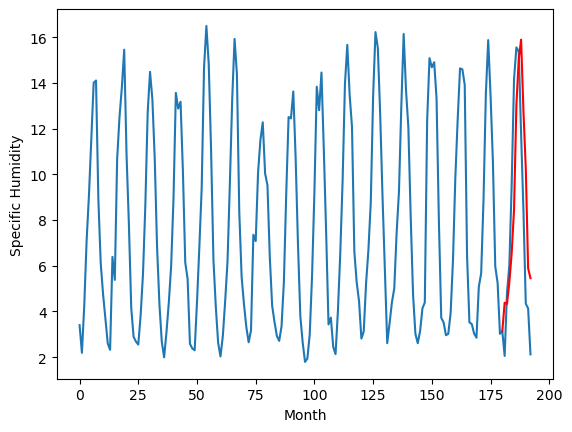

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.27		3.08		-1.19
6.26		3.04		-3.22
6.23		3.96		-2.27
6.98		5.25		-1.73
8.31		7.16		-1.15
12.60		11.72		-0.88
13.81		13.73		-0.08
14.20		14.58		0.38
13.40		11.47		-1.93
10.48		8.94		-1.54
5.82		4.57		-1.25
7.56		4.15		-3.41
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.79, 3.0830303263664245, 3.035881934762001, 3.9637902957201003, 5.25376045525074, 7.160279033780098, 11.719408748745918, 13.725102184414864, 14.581572709679604, 11.474595246911049, 8.938685355782509, 4.569749293923378, 4.147584585547447]


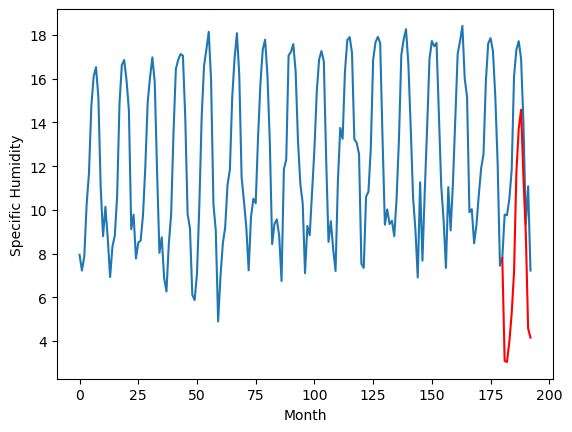

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.87		3.14		-0.73
3.75		3.10		-0.65
6.81		4.03		-2.78
7.06		5.32		-1.74
10.50		7.22		-3.28
14.74		11.79		-2.95
16.39		13.79		-2.60
16.40		14.65		-1.75
13.46		11.54		-1.92
10.68		9.00		-1.68
5.24		4.63		-0.61
8.19		4.21		-3.98
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.03, 3.1430815863609314, 3.09635809764266, 4.027412391752005, 5.317408658117056, 7.224847532361746, 11.785978532880545, 13.793864704221487, 14.649012662023306, 11.53986511334777, 9.004943467229605, 4.634436703771353, 4.213631785959006]


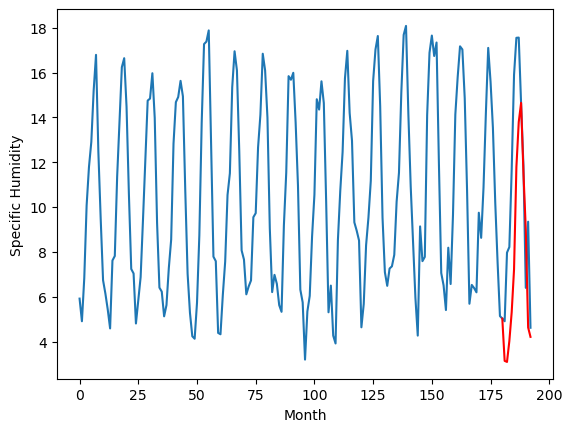

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.73		3.00		-0.73
3.41		2.95		-0.46
6.07		3.89		-2.18
7.36		5.18		-2.18
11.36		7.09		-4.27
15.05		11.65		-3.40
15.62		13.66		-1.96
16.01		14.51		-1.50
12.00		11.40		-0.60
9.15		8.87		-0.28
5.53		4.50		-1.03
7.39		4.08		-3.31
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.41, 3.002318766117096, 2.9545845018327235, 3.8906119094789027, 5.1784908996522425, 7.089887879937887, 11.650344155877828, 13.659480355829, 14.513229333013296, 11.404106579869985, 8.867635212987661, 4.49924322232604, 4.075862787812948]


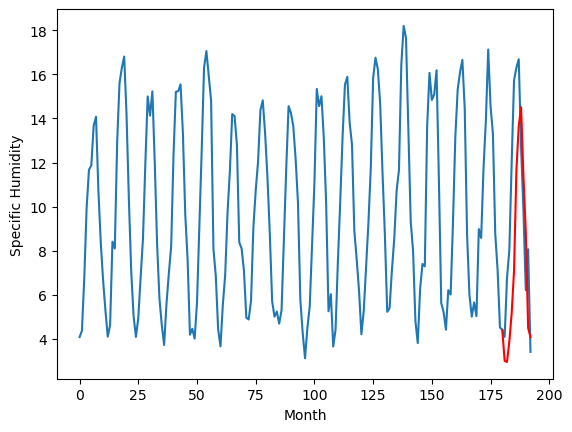

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.36		2.56		-0.80
2.91		2.52		-0.39
5.49		3.45		-2.04
6.85		4.74		-2.11
11.14		6.66		-4.48
15.02		11.22		-3.80
15.40		13.23		-2.17
15.51		14.08		-1.43
11.61		10.97		-0.64
8.88		8.43		-0.45
5.27		4.06		-1.21
6.68		3.64		-3.04
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.29, 2.5628084778785705, 2.5152530685067176, 3.4544708743691444, 4.742102386057377, 6.655213476717472, 11.215454222261906, 13.226177813112736, 14.078923286497593, 10.96974283605814, 8.432550252974034, 4.064813436567784, 3.639846505224705]


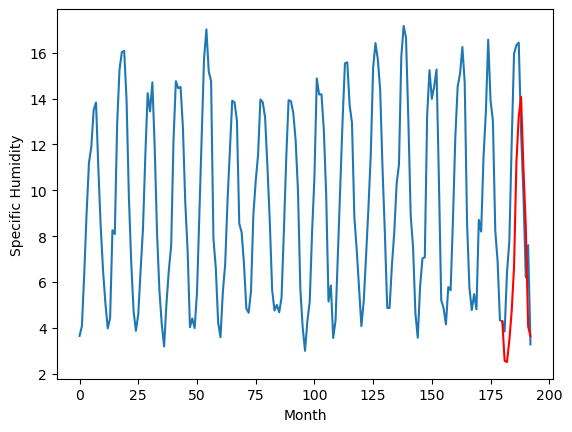

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.64		7.10		-1.54
8.00		7.05		-0.95
9.49		7.99		-1.50
10.45		9.27		-1.18
15.00		11.18		-3.82
17.30		15.74		-1.56
18.33		17.75		-0.58
18.05		18.60		0.55
14.80		15.49		0.69
11.75		12.95		1.20
10.03		8.58		-1.45
9.18		8.16		-1.02
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.47, 7.101943674087525, 7.054841688424349, 7.98934935644269, 9.272683492451907, 11.184999814778568, 15.741638055592777, 17.75038372591138, 18.60141413524747, 15.491824796944858, 12.952463558465244, 8.584553650170566, 8.156804791241886]


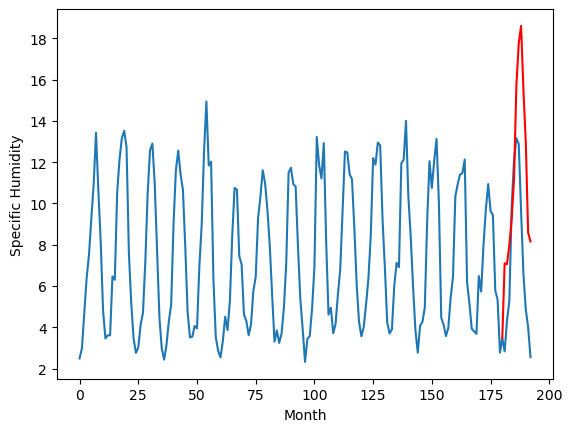

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.80		5.08		-0.72
6.05		5.04		-1.01
7.76		5.97		-1.79
8.17		7.26		-0.91
11.15		9.16		-1.99
15.84		13.72		-2.12
17.44		15.73		-1.71
17.82		16.58		-1.24
14.24		13.47		-0.77
12.03		10.94		-1.09
6.31		6.56		0.25
8.17		6.14		-2.03
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.52, 5.08342431306839, 5.038168409913778, 5.967408994287252, 7.255096653550863, 9.163063386529684, 13.7241896186769, 15.730789044946432, 16.584740081876518, 13.472547689527275, 10.93584553346038, 6.56311718568206, 6.1418757532537]


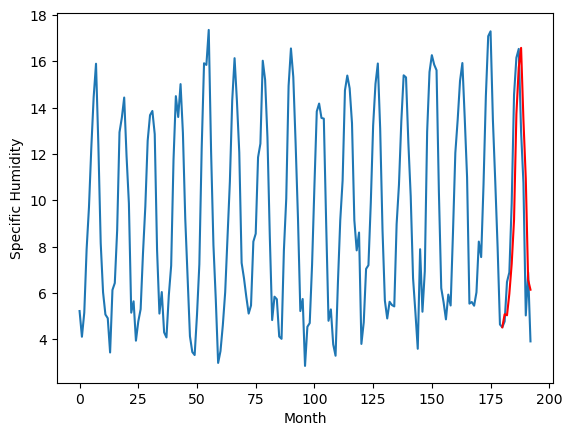

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.93		3.24		-0.69
3.30		3.19		-0.11
5.67		4.13		-1.54
6.59		5.42		-1.17
9.75		7.33		-2.42
14.35		11.89		-2.46
15.30		13.90		-1.40
15.04		14.76		-0.28
11.78		11.65		-0.13
9.69		9.11		-0.58
5.00		4.74		-0.26
6.47		4.32		-2.15
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.4, 3.242765920162201, 3.1947314682602883, 4.130362505018711, 5.41742169290781, 7.329511875212193, 11.892260307371616, 13.902767414152622, 14.757018143236637, 11.64577417999506, 9.109761053621769, 4.7409618440270425, 4.316447848379612]


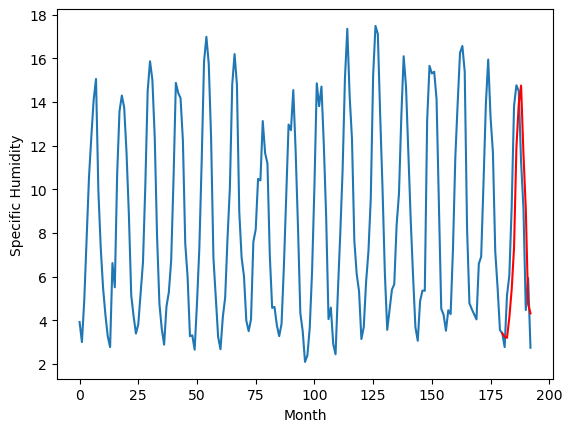

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.30		2.81		-0.49
2.73		2.76		0.03
4.67		3.70		-0.97
6.00		4.99		-1.01
8.29		6.90		-1.39
13.35		11.46		-1.89
14.61		13.47		-1.14
14.75		14.33		-0.42
11.27		11.21		-0.06
10.12		8.68		-1.44
4.35		4.31		-0.04
5.06		3.88		-1.18
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.82, 2.8086850881576537, 2.759189338982105, 3.6958586886525153, 4.9870238021016124, 6.895404310524464, 11.458793611824513, 13.470222206413746, 14.328719110786915, 11.21436974555254, 8.680375070869923, 4.307473631203175, 3.882658959925175]


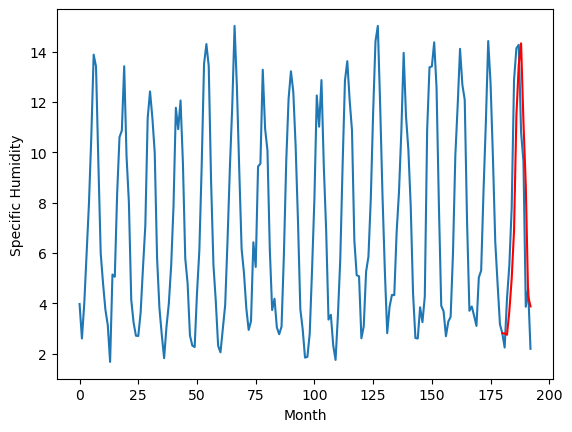

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.17		1.65		-0.52
1.53		1.60		0.07
3.90		2.54		-1.36
5.21		3.83		-1.38
7.83		5.74		-2.09
12.58		10.30		-2.28
13.98		12.31		-1.67
14.23		13.17		-1.06
10.20		10.06		-0.14
8.33		7.53		-0.80
3.04		3.15		0.11
3.58		2.73		-0.85
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.86, 1.647967269420624, 1.5964383648335936, 2.5363039539754393, 3.8263631628453734, 5.737139420360327, 10.299852089732886, 12.313256697505713, 13.17037786707282, 10.056180851310492, 7.525276558250189, 3.152478592246771, 2.7251584993302824]


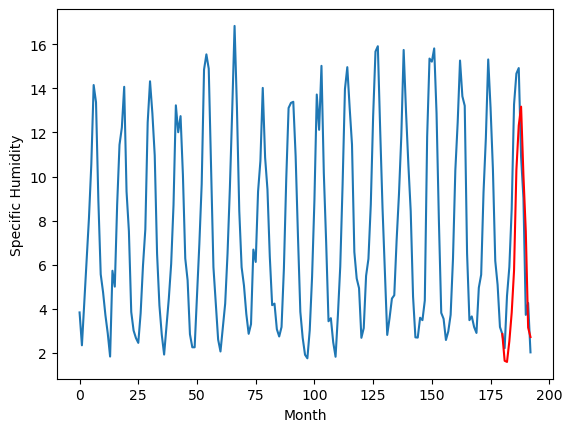

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		4.37		-0.47
4.27		4.32		0.05
5.56		5.26		-0.30
7.23		6.55		-0.68
8.83		8.46		-0.37
13.84		13.02		-0.82
15.11		15.03		-0.08
15.98		15.89		-0.09
12.22		12.78		0.56
11.21		10.25		-0.96
5.97		5.87		-0.10
5.93		5.44		-0.49
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.61, 4.373414189815521, 4.323547193109989, 5.259586223661899, 6.552713045179844, 8.457290300428866, 13.020457395613192, 15.030947097837924, 15.891532250940799, 12.776783773005008, 10.247893401682376, 5.870824405252932, 5.441760697662829]


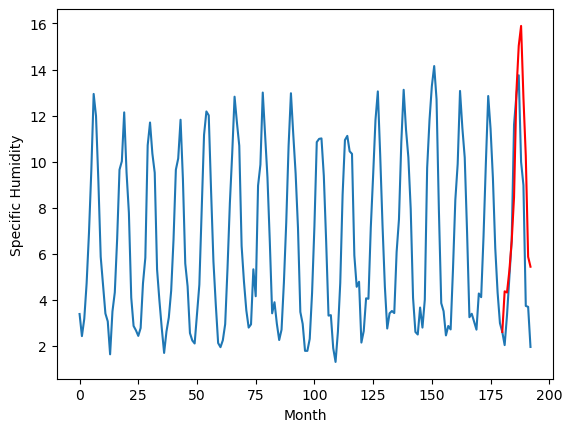

RangeIndex(start=1, stop=12, step=1)
[5.34, 4.269999999999999, 3.870000000000001, 3.7300000000000004, 3.3600000000000003, 8.64, 5.8, 3.93, 3.3000000000000003, 2.1699999999999995, 4.839999999999999]
[4.3811915230751035, 3.0830303263664245, 3.1430815863609314, 3.002318766117096, 2.5628084778785705, 7.101943674087525, 5.08342431306839, 3.242765920162201, 2.8086850881576537, 1.647967269420624, 4.373414189815521]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.34   4.381192
1                 1    4.27   3.083030
2                 2    3.87   3.143082
3                 3    3.73   3.002319
4                 4    3.36   2.562808
5                 5    8.64   7.101944
6                 6    5.80   5.083424
7                 7    3.93   3.242766
8                 8    3.30   2.808685
9                 9    2.17   1.647967
10               10    4.84   4.373414


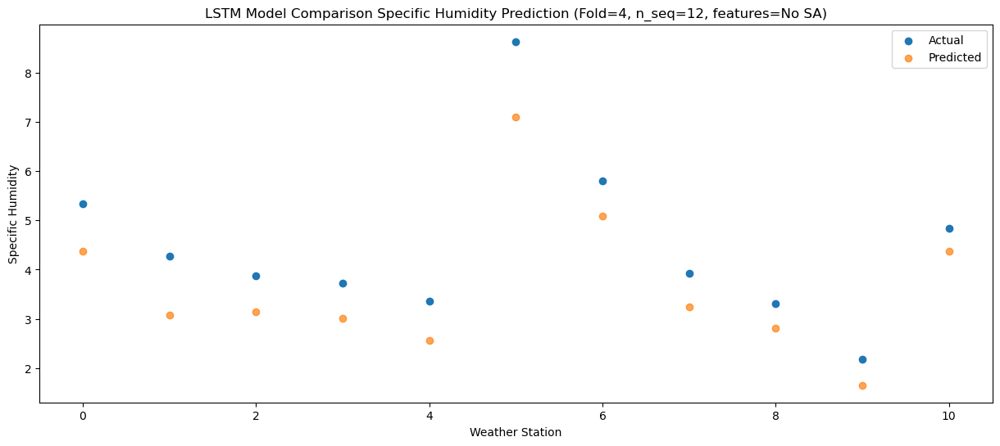

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.25   4.328909
1                 1    6.26   3.035882
2                 2    3.75   3.096358
3                 3    3.41   2.954585
4                 4    2.91   2.515253
5                 5    8.00   7.054842
6                 6    6.05   5.038168
7                 7    3.30   3.194731
8                 8    2.73   2.759189
9                 9    1.53   1.596438
10               10    4.27   4.323547


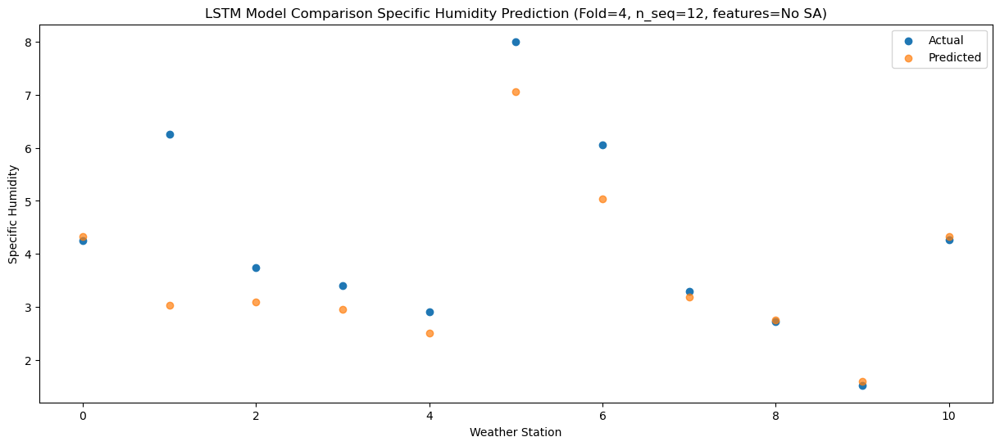

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.01   5.267655
1                 1    6.23   3.963790
2                 2    6.81   4.027412
3                 3    6.07   3.890612
4                 4    5.49   3.454471
5                 5    9.49   7.989349
6                 6    7.76   5.967409
7                 7    5.67   4.130363
8                 8    4.67   3.695859
9                 9    3.90   2.536304
10               10    5.56   5.259586


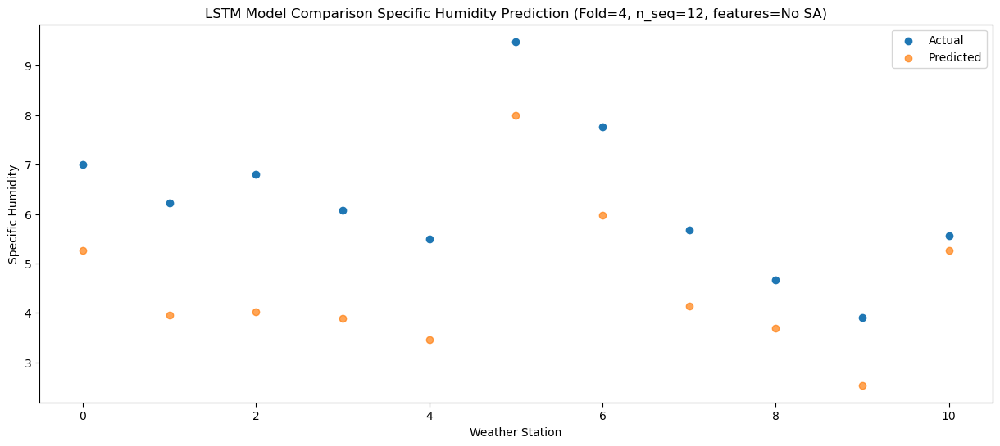

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    8.22   6.559087
1                 1    6.98   5.253760
2                 2    7.06   5.317409
3                 3    7.36   5.178491
4                 4    6.85   4.742102
5                 5   10.45   9.272683
6                 6    8.17   7.255097
7                 7    6.59   5.417422
8                 8    6.00   4.987024
9                 9    5.21   3.826363
10               10    7.23   6.552713


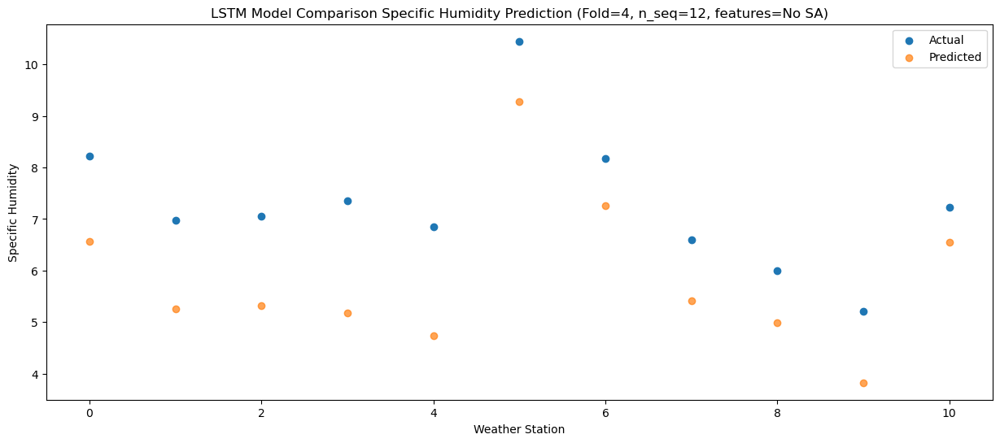

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   11.78   8.470295
1                 1    8.31   7.160279
2                 2   10.50   7.224848
3                 3   11.36   7.089888
4                 4   11.14   6.655213
5                 5   15.00  11.185000
6                 6   11.15   9.163063
7                 7    9.75   7.329512
8                 8    8.29   6.895404
9                 9    7.83   5.737139
10               10    8.83   8.457290


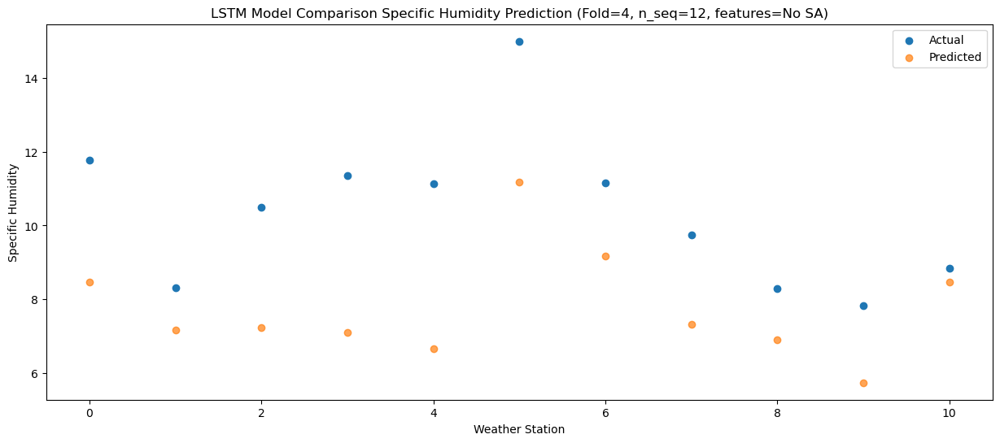

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   16.37  13.029263
1                 1   12.60  11.719409
2                 2   14.74  11.785979
3                 3   15.05  11.650344
4                 4   15.02  11.215454
5                 5   17.30  15.741638
6                 6   15.84  13.724190
7                 7   14.35  11.892260
8                 8   13.35  11.458794
9                 9   12.58  10.299852
10               10   13.84  13.020457


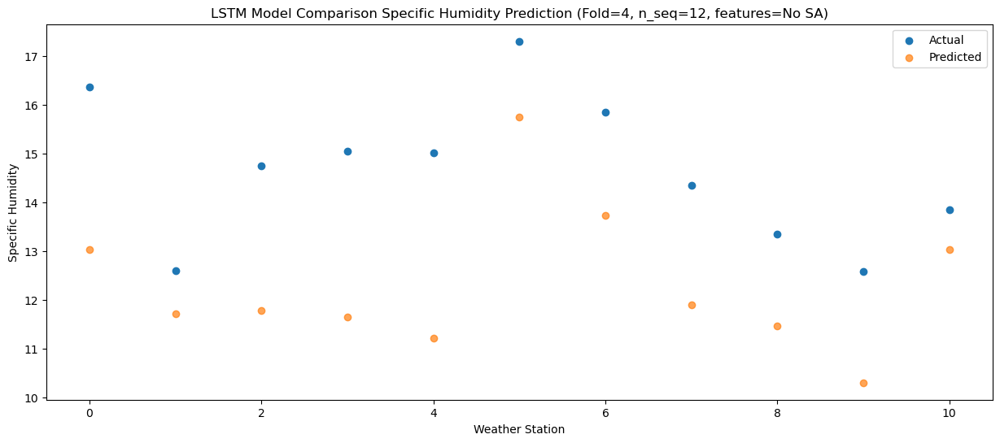

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   17.76  15.042485
1                 1   13.81  13.725102
2                 2   16.39  13.793865
3                 3   15.62  13.659480
4                 4   15.40  13.226178
5                 5   18.33  17.750384
6                 6   17.44  15.730789
7                 7   15.30  13.902767
8                 8   14.61  13.470222
9                 9   13.98  12.313257
10               10   15.11  15.030947


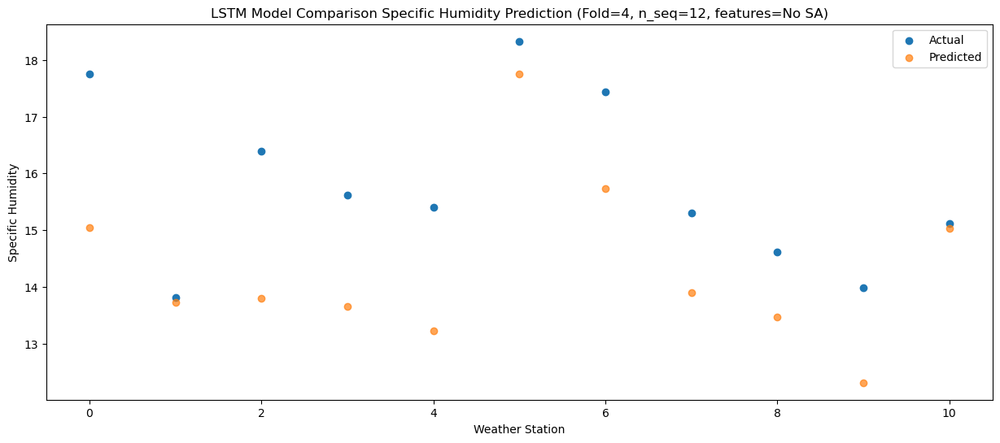

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   17.58  15.899260
1                 1   14.20  14.581573
2                 2   16.40  14.649013
3                 3   16.01  14.513229
4                 4   15.51  14.078923
5                 5   18.05  18.601414
6                 6   17.82  16.584740
7                 7   15.04  14.757018
8                 8   14.75  14.328719
9                 9   14.23  13.170378
10               10   15.98  15.891532


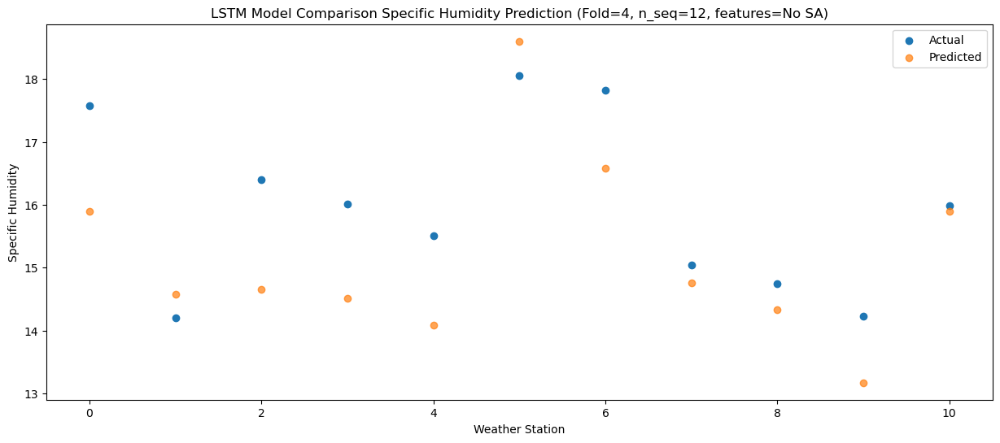

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   14.00  12.788040
1                 1   13.40  11.474595
2                 2   13.46  11.539865
3                 3   12.00  11.404107
4                 4   11.61  10.969743
5                 5   14.80  15.491825
6                 6   14.24  13.472548
7                 7   11.78  11.645774
8                 8   11.27  11.214370
9                 9   10.20  10.056181
10               10   12.22  12.776784


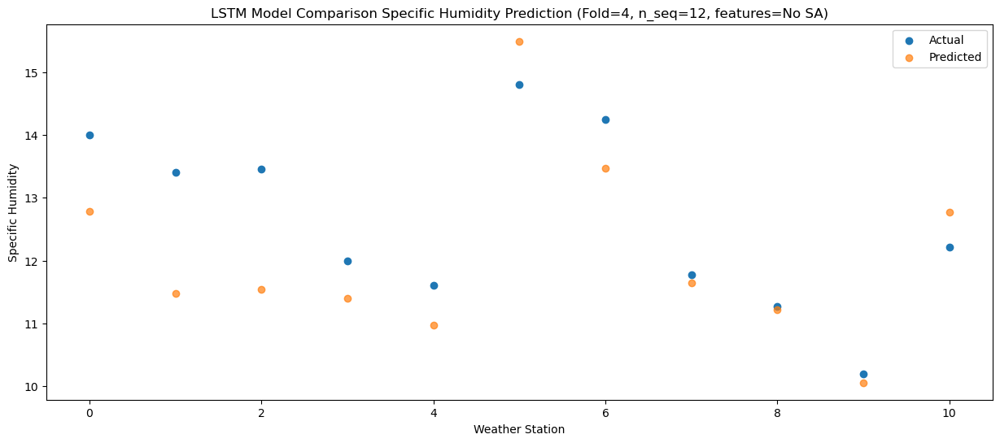

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.63  10.253823
1                 1   10.48   8.938685
2                 2   10.68   9.004943
3                 3    9.15   8.867635
4                 4    8.88   8.432550
5                 5   11.75  12.952464
6                 6   12.03  10.935846
7                 7    9.69   9.109761
8                 8   10.12   8.680375
9                 9    8.33   7.525277
10               10   11.21  10.247893


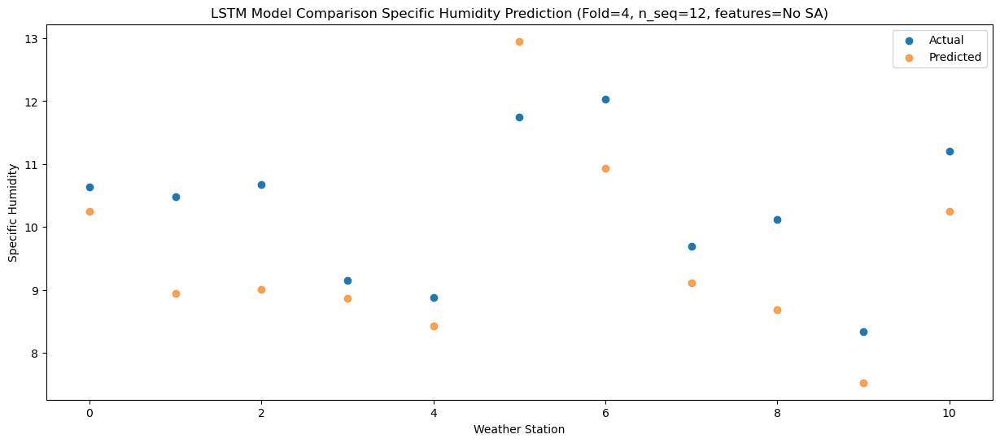

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    6.54   5.885983
1                 1    5.82   4.569749
2                 2    5.24   4.634437
3                 3    5.53   4.499243
4                 4    5.27   4.064813
5                 5   10.03   8.584554
6                 6    6.31   6.563117
7                 7    5.00   4.740962
8                 8    4.35   4.307474
9                 9    3.04   3.152479
10               10    5.97   5.870824


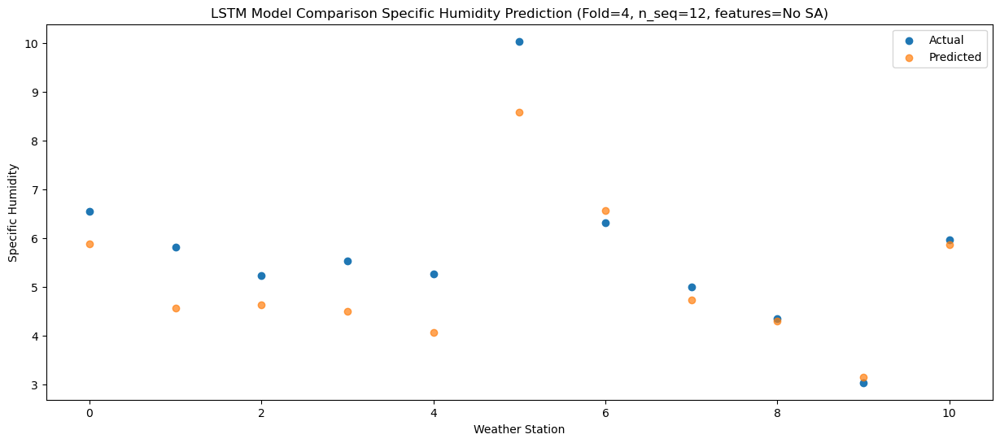

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    6.33   5.454643
1                 1    7.56   4.147585
2                 2    8.19   4.213632
3                 3    7.39   4.075863
4                 4    6.68   3.639847
5                 5    9.18   8.156805
6                 6    8.17   6.141876
7                 7    6.47   4.316448
8                 8    5.06   3.882659
9                 9    3.58   2.725158
10               10    5.93   5.441761


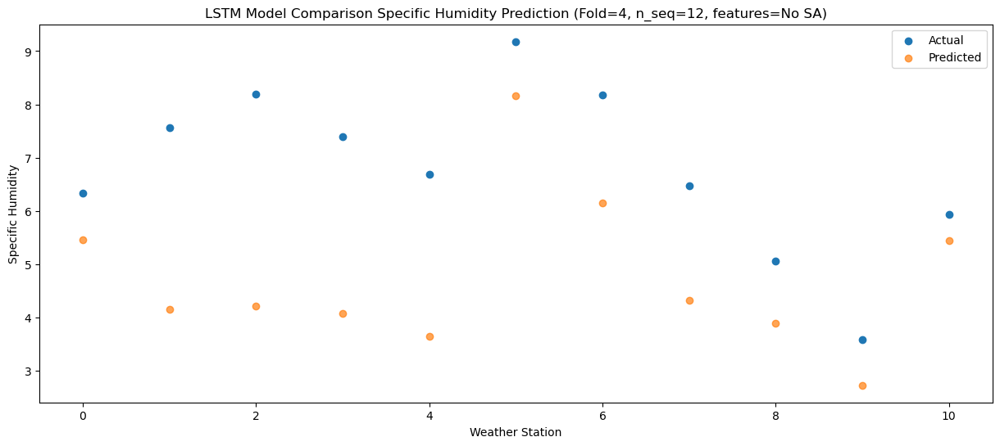

Model: "sequential_505"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1010 (LSTM)            (1, 1, 1024)              12263424  
                                                                 
 dropout_1010 (Dropout)      (1, 1, 1024)              0         
                                                                 
 lstm_1011 (LSTM)            (1, 1024)                 8392704   
                                                                 
 dropout_1011 (Dropout)      (1, 1024)                 0         
                                                                 
 dense_1515 (Dense)          (1, 256)                  262400    
                                                                 
 dense_1516 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1517 (Dense)          (1, 12)                

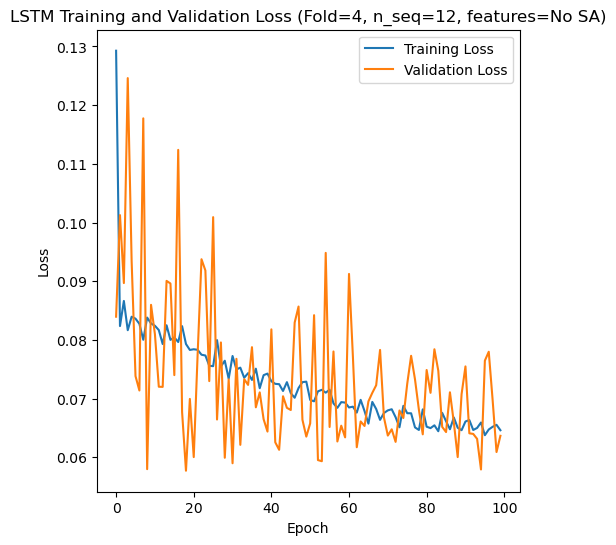

[[0.3064368764927783, 0.7159231034370784, 1.4762479371850212, 1.0259622553289447, 1.7702200958129057, 1.5768599250661033, 1.6088628461652108, 1.4156318801238195, 1.5553448874901104, 0.8273566697350896, 0.405019053424964, 2.2785921251415933], [0.38083097069101135, 0.6596780560637431, 0.8493984529187143, 0.7912763682632546, 1.854381559862927, 1.1771783445451607, 1.0653673320284844, 1.2657054342154879, 1.1245917677977468, 1.1361208015324693, 0.5364947091101545, 1.7505435142147552], [0.5206761407654841, 1.4148855243432743, 1.1611042679146084, 1.2143172244583293, 2.3164298551687352, 2.4559271072501625, 1.7012840866193073, 1.8772525982552495, 1.0406358170148973, 1.487854630192508, 0.9318590740017052, 1.9623977833862813], [0.5439060065803684, 0.5787059323871696, 0.832139742218005, 1.0036687402666231, 2.1378301918320086, 4.093569296998119, 3.8438642968731234, 4.371975585796956, 3.0889082025222123, 2.7034309631765403, 0.7460834370791875, 0.9675671446983244], [0.8583628641810324, 1.0924527167862

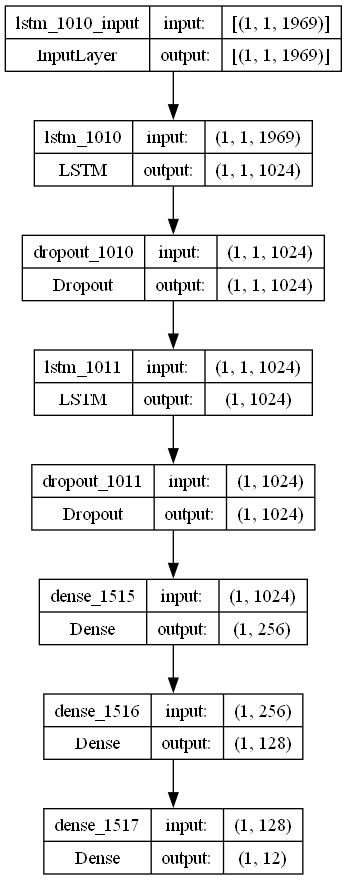

In [9]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    lr = 0.025099140649404033 
    optimizer = SGD(learning_rate = lr)
    activation_function = 'sigmoid'
    lstm_units = 1024
    dropout_rate = 0.10155711537887459

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with an LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No SA)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No SA)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_SH_S12_No_SA.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

In [ ]:
from matplotlib import pyplot

n_test_batch = 11
ws=0

# make forecasts
forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test_batch)

# inverse transform forecasts and test
forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
actual = [row[-n_seq:] for row in test1]
actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

rmse_list = [] # list stores root mean squared errors for each future time prediction
mae_list = [] # list stores root mean squared errors for each future time prediction
mape_list = [] # list stores root mean squared errors for each future time prediction
r2_list = [] # list stores root mean squared errors for each future time prediction
    
# evaluate forecasts
rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

# plot forecasts
dataset_df = pd.DataFrame(val_y[0])
dataset_df = dataset_df.iloc[0:11, :]
dataset_df = dataset_df.transpose()
dataset = dataset_df.values

#print(dataset_df)

#print(len(dataset))
#print(dataset)


series_ws = pd.Series(dataset[:, ws]) # Using first column (specific_humidity)
forecasts_ws = [forecasts[ws]]

print(series_ws[180:225])
print(actual[0])
print(forecasts[0])

n_test=11
print(len(series_ws))
print(series_ws[220:228])
print(len(forecasts_ws))
print(forecasts_ws)
print(n_seq)
print(n_test)

# plot forecasts
plot_forecasts(series_ws, forecasts_ws, n_test+2)

In [ ]:
# Extract the dates corresponding to the test set predictions
test_dates = df.index[-len(actual[0]):]

# Print out plots of actual and predicted values for each weather station
for j in range(11):
    print("Weather Station "+str(j+1)+":")
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'Month': test_dates,
        'Actual': actual[j],
        'Predicted': forecasts[j]
    })
            
    # Plotting the results
    plt.figure(figsize=(15, 6))
    plt.plot(results_df['Month'], results_df['Actual'], label='Actual')
    plt.plot(results_df['Month'], results_df['Predicted'], label='Predicted', alpha=0.7)
    plt.title('LSTM Model Comparison Specific Humidity Prediction')
    plt.xlabel('Month')
    plt.ylabel('Specific Humidity')
    plt.legend()
    plt.show()

    # Plot model architecture
    filename = "lstm_model_optimized_ws_"+str(j)+".png"
    plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

In [ ]:
print(np.mean(rmse))
print(np.std(rmse))

In [ ]:
print(len(actual))
print(len(actual[0]))
print(len(forecasts))
print(len(forecasts[0]))